Connected to Python 3.8.10

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import os
from astropy.io import fits
from scipy.stats import norm
import glob
from scipy import interpolate
from scipy import integrate
from scipy.integrate import solve_ivp
from astropy import cosmology
import h5py
from regulator_lib.cooling_fn_generator import cooling_fn_generator
import astropy.constants as consts
import astropy.units as u
import seaborn as sns

LCDM = cosmology.LambdaCDM(H0=70, Om0=0.3, Ode0=0.7)  # Astropy built-in cosmology
import astropy.units as u

matplotlib.rcParams.update(matplotlib.rcParamsDefault)
plt.rcParams.update(
    {
        "text.usetex": True,
        # "font.family": "Helvetica",
        "font.family": "serif",
        "mathtext.fontset": "cm",
        "xtick.labelsize": 8,
        "ytick.labelsize": 8,
        "font.size": 9,
        "xtick.direction": "in",
        "ytick.direction": "in",
        "ytick.right": True,
        "xtick.top": True,
        # "xtick.major.size": 6,
        # "ytick.major.size": 6,
        # "xtick.minor.size": 4,
        # "ytick.minor.size": 4,
    }
)

In [ ]:
cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

reading file ['./tables/Lambda_tab_redshifts.npz']


In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
y = 0.02  # metallicity enrichment yield (mass in metals produced per solar mass)
fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
C = 0.4

# controls how effective outflowing energy is at preventing inflowing gas
CGM_infall_prevention_constant = 1.0
# ratio of specific energy of ejected gas to CGM gas
CGM_eject_specific_energy_ratio = 1.0


# Parameters for eta_m function
A = 1
beta = 0.7


def mass_loading(A, mhalo, alpha):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)

In [ ]:
def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, C):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        C (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return C * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


# def density0(mCGM, alpha, r1, Rvir):  # density factor
#     return (mCGM * (3 - alpha)) / (
#         (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
#     )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial z=6 halo mass
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    # Finds initial z=6 halo mass for a given (z=0) halo mass
    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # z=6 halo mass


# def loss_integrand(x, alpha): # Integrand for calculating CGM mass loss
#    return x**(-2*alpha) * x**2

# def electron_density(Lamb, T, t_ff): # equation (1) from Voit et al 2015
#    return (3*kb*T) / (10 * Lamb * t_ff)

# def CGM_massloss_integrand(x, r1, alpha, rho0, Rvir, mhalo, Tvir, Lamb):
#    rho = rho0 * ((x*u.kpc)/r1)**(-alpha)
#    tcool = 2*((1.5 * mu * kb * Tvir) / (rho * Lamb)).to(u.Gyr)
#    tff = t_ff((x*u.kpc), Rvir, mhalo).to(u.Gyr)
#    return (x**(2-alpha)) / (tcool.value + 0*tff.value)

# def E_IN_integrand(x, Tvir, Rvir, mhalo, Lamb): # Integrand for calculating energy loss from the CGM
##    ne = electron_density(Lamb, Tvir, t_ff((x*u.kpc), Rvir, mhalo)).to(u.kpc**-3).value
#    tff = t_ff((x*u.kpc), Rvir, mhalo).to(u.Gyr)
#    ne = ((3*kb*Tvir) / (10 * Lamb * tff)).to(u.kpc**-3).value
#    return ne**2 * x**2

# def CGM_profile(x,Tvir, Rvir, mhalo, Lamb): # integrand for estimating halo mass from CGM density profile
#    ne_r = electron_density(Lamb, Tvir, t_ff((x*u.kpc), Rvir, mhalo)).to(u.kpc**-3).value
#    return ne_r*x**2


# def energy_loss(Lamb, Tvir, Rvir, mhalo): # radiative energy loss from the CGM
#    return (Lamb* 4*np.pi * (integrate.quad(E_IN_integrand, 10, Rvir.value, epsrel=1e-3,
#            args=(Tvir, Rvir, mhalo, Lamb))[0] * u.kpc**-3)).to(u.erg * u.Gyr**-1)

In [ ]:
def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list = (
        [],
        [],
        [],
        [],
        [],
        [],
    )
    CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list = ([], [], [], [])
    Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list = ([], [], [], [])

    mgas = mass[0] * u.solMass
    mstar = mass[1] * u.solMass
    mCGM = mass[2] * u.solMass  # Total CGM mass
    mZM = mass[3] * u.solMass
    mhalo = mass[4] * u.solMass

    E_g = mass[5] * (u.erg)  # Energy gained from energy-loaded galactic winds
    E_l = mass[6] * (u.erg)  # Energy loss from gas precipitation onto the Galaxy
    E_ej = mass[7] * (u.erg)  # Energy loss from mass enjected from the CGM
    E_acc = mass[8] * (u.erg)  # Energy gained from mass accretion from the IGM
    E_CGM = mass[9] * (u.erg)  # Total CGM energy

    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift

    t_dep = depletion_time(z, mstar, exp, C)  # estimate of depletion time
    # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr
    t_dep_list.append(t_dep.value)

    Rvir = virial_radius(z, mhalo).to(u.kpc)  # virial radius
    Tvir = virial_T(mhalo, Rvir).to(u.K)  # Virial Temperature
    rho_crit = LCDM.critical_density(z)  # critical density
    t_dyn = t_ff(Rvir, Rvir, mhalo).to(u.Gyr)  # dynamical time
    # t_cool = 10 * t_ff(Rvir,Rvir, mhalo).to(u.Gyr) # cooling time from precipitation
    Z_m = mZM / mCGM  # CGM metallicity
    Z = Z_m / Z_sol  # CGM metallicity with respect to solar metallicity
    Lamb = cooling_fn((-4, np.log10(Tvir.value), Z, 0)) * (
        u.erg * u.cm**3 * u.s**-1
    )  # cooling function value

    # Compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * Rvir  # our definition of inner radius of CGM
    # r1 = 10.0*u.kpc # Another possible definition of inner radius of CGM

    rho0 = density0(mCGM=mCGM, alpha=alpha, r1=r1, Rvir=Rvir)  # central density of CGM

    # Energy ejection loss timescale
    cs = np.sqrt(E_CGM / mCGM)  # specific energy of CGM (approximate sound speed)
    t_ej = Rvir / cs  # ejection time of hot gas
    t_ej = min(max(t_ej, 0.1 * t_dyn), t_dyn)  # clip to range 0.1-1 t_dyn

    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    Eej_dot = (max(E_CGM - kb * Tvir * mCGM / mu, 0.0 * u.erg) / t_ej).to(u.erg / u.Gyr)

    # Energy radiative loss
    # integrated radiative loss rate
    El_dot = energy_loss(Lamb, Rvir, r1, rho0).to(u.erg / u.Gyr)

    # specific energy of ejected gas
    CGM_specific_energy = CGM_eject_specific_energy_ratio * max(
        E_CGM / mCGM, kb * Tvir / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (CGM_specific_energy / El_dot) * mCGM
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling

    # include dynamical time?
    tcool_eff = tcool_eff + 1 * t_dyn
    El_dot = (E_CGM / tcool_eff).to(u.erg / u.Gyr)

    # CGM mass loss due to cooling (using effective cooling time)
    CGM_cool_dot = (mCGM / tcool_eff).to(u.solMass / u.Gyr)

    # Mass Terms
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)
    mstar_dot = (mgas / t_dep).to(u.solMass / u.Gyr)
    mgas_dot = (-(mgas / t_dep) * (1 + eta_m) + CGM_cool_dot).to(u.solMass / u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)

    # CGM eject loss term
    CGM_eject_dot = ((1 / CGM_specific_energy) * Eej_dot).to(u.solMass / u.Gyr)

    # CGM infall terms
    CGM_infall_dot = fb * mhalo_dot

    # CGM infall prevention factor: ratio of ejection energy / infall energy
    Eej_infall_ratio = CGM_infall_prevention_constant / (
        Eej_dot / ((kb * Tvir / mu) * CGM_infall_dot)
    ).to(u.dimensionless_unscaled)
    fprevent = min(max(Eej_infall_ratio, 0.1), 1.0)  # clip to 0.1-1.0
    CGM_infall_dot *= fprevent

    # CGM feedback gain term
    CGM_gain_dot = mstar_dot * eta_m

    # Energy gain due to star formation
    Eg_dot = energy_gain(eta_e, mstar_dot)

    # Energy loss due to ejection
    Eacc_dot = ((kb * Tvir) / mu * CGM_infall_dot).to(u.erg * u.Gyr**-1)

    # totaol Mass, energy, and metallicity derivatives
    mCGM_dot = CGM_infall_dot + CGM_gain_dot - CGM_cool_dot - CGM_eject_dot
    #    print(mCGM_dot, CGM_infall_dot, CGM_gain_dot, CGM_cool_dot, CGM_eject_dot)
    mZM_dot = (
        eta_z * y * mstar_dot
        + Z_IGM * Z_sol * CGM_infall_dot
        - Z_m * (CGM_cool_dot + CGM_eject_dot)
    )
    ECGM_dot = Eg_dot + 1 * Eacc_dot - Eej_dot - 1 * El_dot

    if (mCGM.value < 3e5) & (mCGM_dot < 0):
        mCGM_dot *= max((mCGM.value - 5e3) / 5e3, 0)
    #        mCGM_dot = 0.0 * u.solMass/u.Gyr

    # Record some quantities for plotting later
    TT_list.append(t)  # Time [Gyr]
    Tvir_list.append(Tvir.value)

    Eej_dot_list.append(Eej_dot.value)
    El_dot_list.append(El_dot.value)
    Eacc_dot_list.append(Eacc_dot.value)
    Eg_dot_list.append(Eg_dot.value)

    CGM_eject_list.append(CGM_eject_dot.value)
    CGM_cool_list.append(CGM_cool_dot.value)
    CGM_infall_list.append(CGM_infall_dot.value)
    CGM_gain_list.append(CGM_gain_dot.value)

    fprevent_list.append(fprevent)
    fstar_list.append(mstar / (fb * mhalo))

    grad_array = np.array(
        [
            mgas_dot.value,
            mstar_dot.value,
            mCGM_dot.value,
            mZM_dot.value,
            mhalo_dot.value,
            Eg_dot.value,
            El_dot.value,
            Eej_dot.value,
            Eacc_dot.value,
            ECGM_dot.value,
        ]
    )

    #    plot_list.append( (t,grad_array,Tvir_list,fprevent))

    return grad_array


def bathtub(time_interval, mhalo_z0):
    """run the model for a given halo mass at z=0

    Args:
        time_interval (float): tuple, time interval for the model (units: Gyr)
        mhalo_z0 (float): stellar mass at z=0 (units: solar mass)

    Returns:
        (array): time, redshift, gas mass, stellar mass, CGM mass, halo mass, CGM metallicity, energy gain, energy loss, energy ejection, energy accretion, CGM energy
    """

    mhalo0 = initial_mhalo(mhalo_z0, time_interval)
    Rvir = virial_radius(0, mhalo0 * u.solMass).to(u.kpc)  # virial radius
    Tvir = virial_T(mhalo0 * u.solMass, Rvir).to(u.K)  # Virial Temperature
    mcgm0 = 1e3
    ecgm0 = (1e3 * u.solMass * fb * kb * Tvir / mu).to(u.erg)
    mass_initial = np.array(
        [1e3, 1e3, mcgm0, 1e1, mhalo0, 1e3, 1e3, 1e3, 1e3, ecgm0.value]
    )

    sol = solve_ivp(mass_evolution, time_interval, mass_initial, rtol=1e-3)
    t = sol.t
    mgas_t = sol.y[0]
    mstar_t = sol.y[1]
    mCGM_t = sol.y[2]
    mZM_t = sol.y[3]
    mhalo_t = sol.y[4]

    Eg_t = sol.y[5]
    El_t = sol.y[6]
    Eej_t = sol.y[7]
    Eacc_t = sol.y[8]
    ECGM_t = sol.y[9]

    Z_m = mZM_t / mCGM_t  # CGM metallicity ratio
    Z_cgm = Z_m / Z_sol  # CGM metallicity with respect to solar metallicity
    #   z = np.sqrt((28/t) - 1) - 1 # cosmological redshift rough approx
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    return (
        t,
        z,
        mgas_t,
        mstar_t,
        mCGM_t,
        mhalo_t,
        Z_cgm,
        Eg_t,
        El_t,
        Eej_t,
        Eacc_t,
        ECGM_t,
    )

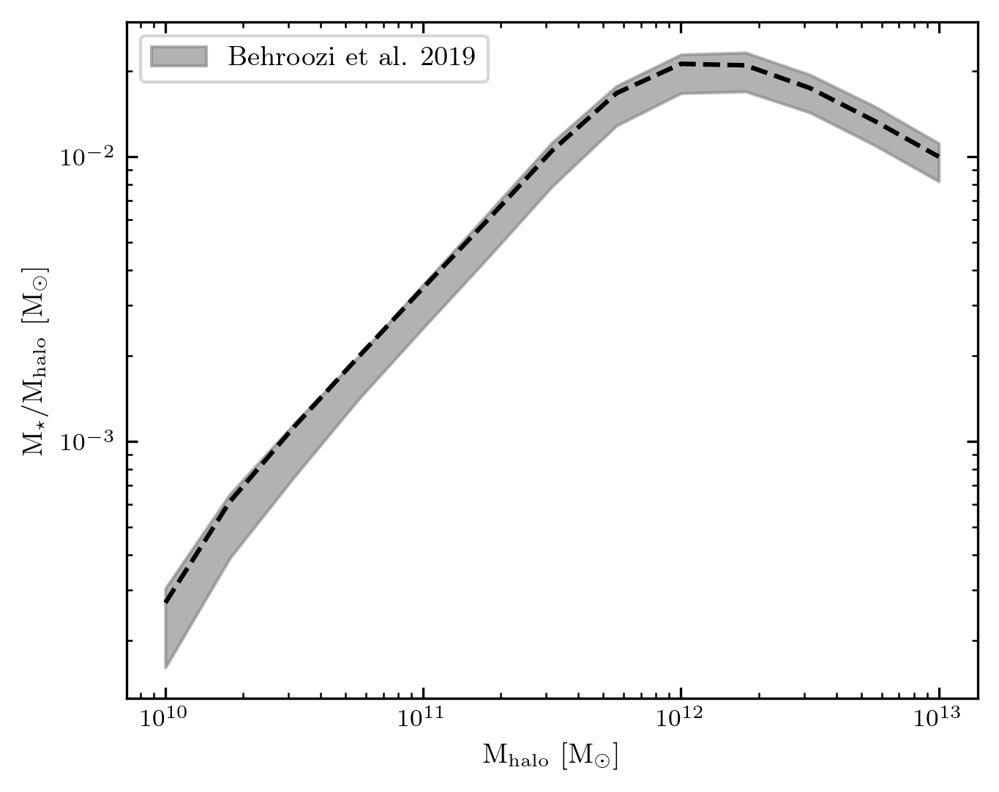

In [ ]:
smmr = np.loadtxt("./data/sm_averages_a1.002310.dat")
loghm = smmr[8:21, 0]  # halo mass
hm = 10**loghm * u.solMass

logSM = smmr[8:21, 7]  # stellar mass
sm = 10 ** logSM[8:21] * u.solMass

SMerr = np.vstack([smmr[8:21, 3], smmr[8:21, 2]])  # error array
logSMHM = smmr[8:21, 10]  # stellar mass / halo mass
SMHMerr = np.vstack([smmr[8:21, 12], smmr[8:21, 11]])  # error array
fig, ax = plt.subplots(1, 1, figsize=(5, 4), sharey="all", dpi=300)
ax.plot(10**loghm, 10**logSMHM, color="k", ls="--")
ax.fill_between(
    10**loghm,
    10 ** (logSMHM + SMHMerr[1, :]),
    10 ** (logSMHM - SMHMerr[0, :]),
    color="gray",
    alpha=0.6,
    label="Behroozi et al. 2019",
)
ax.set(
    xlabel=r"M$_{\rm halo}$ [M$_\odot$]",
    ylabel=r"M$_\star$/M$_{\rm halo}$ [M$_\odot$]",
    yscale="log",
    xscale="log",
)
ax.legend()
plt.show()

In [ ]:
def explore_halo(mhalo_z0, eta_m_, eta_e_, time_interval):
    # time_interval = (0.56, 13.7)  # z=9 to z=0
    # if (time_interval is None):
    #     #z = 15 to z=0

    #    zinit = np.sqrt((28/time_interval[0]) - 1) - 1
    #    zfinal = np.sqrt((28/time_interval[1]) - 1) - 1
    zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
    zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
    print("Running models from z = {:.2f} to z = {:.2f}".format(zinit, zfinal))
    print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

    beta = 0.9
    # eta_m = mass_loading(A, mhalo_z0, beta)

    colors = sns.color_palette()

    # Parameters
    # global CGM_infall_prevention_constant, CGM_eject_specific_energy_ratio
    # global eta_m, eta_e, eta_z
    eta_m = eta_m_
    eta_e = eta_e_

    # global TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list
    # global CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list
    # global Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list
    # global Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list
    # global msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list
    Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list = ([], [], [], [])
    msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list = ([], [], [], [], [])

    mhalo0 = initial_mhalo(mhalo_z0, time_interval)
    Rvir = virial_radius(zfinal, mhalo0 * u.solMass).to(u.kpc)  # virial radius
    Tvir = virial_T(mhalo0 * u.solMass, Rvir).to(u.K)  # Virial Temperature
    mcgm0 = 1e3
    ecgm0 = (1e3 * u.solMass * fb * kb * Tvir / mu).to(u.erg)
    mass_initial = np.array(
        [1e3, 1e3, mcgm0, 1e1, mhalo0, 1e3, 1e3, 1e3, 1e3, ecgm0.value]
    )
    # time_interval = (0.04, 0.1)
    sol = solve_ivp(mass_evolution, time_interval, mass_initial, rtol=1e-3)

    gradients = np.zeros_like(sol.y)
    #    for i in range(len(sol.t)):
    #        print(i,len(sol.y[i]),sol.y[:,i])
    #      gradients[:,i] = mass_evolution(sol.t[i], sol.y[:,i])
    #     fprevent[i] = fprevent_func(sol.t[i,])

    t = sol.t
    mgas_t = sol.y[0]
    mstar_t = sol.y[1]
    mCGM_t = sol.y[2]
    mZM_t = sol.y[3]
    mhalo_t = sol.y[4]

    Eg_t = sol.y[5]
    El_t = sol.y[6]
    Eej_t = sol.y[7]
    Eacc_t = sol.y[8]
    ECGM_t = sol.y[9]

    Z_m = mZM_t / mCGM_t  # CGM metallicity ratio
    Z_cgm = Z_m / Z_sol  # CGM metallicity with respect to solar metallicity
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    print(sol.status)
    mcgm_dot = np.array(mcdot_list)

    print(r"M_halo = {:.4e}  Msol".format(mhalo_t[-1]))
    print(r"M_star = {:.4e}  Msol".format(mstar_t[-1]))
    print(r"f_star = {:.4e}".format(mstar_t[-1] / (fb * mhalo_t[-1])))
    print(r"M_gas = {:.4e} Msol".format(mgas_t[-1]))
    print(r"M_CGM = {:.4e}  Msol".format(mCGM_t[-1]))
    print("CGM Z = {:.2e}".format(Z_cgm[-1]))

    return_dict = {
        "TT_list": TT_list,
        "Tvir_list": Tvir_list,
        "CB_list_1": CB_list_1,
        "Eg_dot_list": Eg_dot_list,
        "El_dot_list": El_dot_list,
        "Eacc_dot_list": Eacc_dot_list,
        "Eej_dot_list": Eej_dot_list,
        "t": t,
        "mgas_t": mgas_t,
        "mstar_t": mstar_t,
        "mCGM_t": mCGM_t,
        "mZM_t": mZM_t,
        "mhalo_t": mhalo_t,
        "Eg_t": Eg_t,
        "El_t": El_t,
        "Eej_t": Eej_t,
        "Eacc_t": Eacc_t,
        "ECGM_t": ECGM_t,
        "Z_cgm": Z_cgm,
        "z": z,
        "CGM_cool_list": CGM_cool_list,
        "CGM_eject_list": CGM_eject_list,
        "CGM_gain_list": CGM_gain_list,
        "CGM_infall_list": CGM_infall_list,
        "fprevent_list": fprevent_list,
        "fstar_list": fstar_list,
    }
    print(return_dict.keys())
    return return_dict

In [ ]:
def plot_halo_evolution(model):
    TT_list = model["TT_list"]
    Tvir_list = model["Tvir_list"]
    Eg_dot_list = model["Eg_dot_list"]
    El_dot_list = model["El_dot_list"]
    Eacc_dot_list = model["Eacc_dot_list"]
    Eej_dot_list = model["Eej_dot_list"]

    t = model["t"]
    CGM_cool_list = model["CGM_cool_list"]
    CGM_eject_list = model["CGM_eject_list"]
    CGM_gain_list = model["CGM_gain_list"]
    CGM_infall_list = model["CGM_infall_list"]
    fprevent_list = model["fprevent_list"]
    fstar_list = model["fstar_list"]
    mgas_t = model["mgas_t"]
    mstar_t = model["mstar_t"]
    mCGM_t = model["mCGM_t"]
    mZM_t = model["mZM_t"]
    mhalo_t = model["mhalo_t"]
    ECGM_t = model["ECGM_t"]
    Z_cgm = model["Z_cgm"]
    z = model["z"]
    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.1)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(TT_list, Eg_dot_list, label="gain from SF", color="b")
    ax[0].plot(TT_list, El_dot_list, label="cooling loss", color="r")
    ax[0].plot(TT_list, Eacc_dot_list, label=r"cosmic infall", color="g")
    ax[0].plot(
        TT_list, Eej_dot_list, label=r"eject from energy-loading", color="orange"
    )
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(TT_list, CGM_gain_list, label="mass gain from SF", color="b")
    ax[1].plot(TT_list, CGM_cool_list, label="cooling gas", color="r")
    ax[1].plot(TT_list, CGM_infall_list, label=r"cosmic infall", color="g")
    ax[1].plot(
        TT_list, CGM_eject_list, label=r"eject from energy-loading", color="orange"
    )
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(TT_list, fprevent_list)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(TT_list, fstar_list)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t, np.log10(mCGM_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((ECGM_t * u.erg) / (mCGM_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(TT_list, Tvir_list, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):
        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(TT_list, Eg_dot_list, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t * u.Gyr).value for t in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()

In [ ]:
# time, virial temperature, cooling function, depletion time, inflow prevention factor, star formation efficiency
# TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list = (
#     [],
#     [],
#     [],
#     [],
#     [],
#     [],
# )
# #
# CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list = ([], [], [], [])
# Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list = ([], [], [], [])
# Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list = ([], [], [], [])
# msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list = ([], [], [], [], [])

time_interval = (0.3, 1.0)
mh1e9t_004_05 = explore_halo(1e9 * u.solMass, 0.3, 0.15, time_interval)
plot_halo_evolution(mh1e9t_004_05)

Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+09 solMass  Msol


/home/fabg/.pyenv/versions/3.8.10/lib/python3.8/site-packages/astropy/units/quantity.py:673: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


0
M_halo = 1.0023e+09  Msol
M_star = 5.2419e+06  Msol
f_star = 3.2688e-02
M_gas = 3.7171e+06 Msol
M_CGM = 3.1028e+06  Msol
CGM Z = 5.61e-02


NameError: name 'TT_list' is not defined

In [ ]:
time_interval = (0.1, 13.4)
mh1e11t_01_10 = explore_halo(1e11 * u.solMass, 3, 0.3, time_interval)
plot_halo_evolution(mh1e11t_01_10)

: 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import os
from astropy.io import fits
from scipy.stats import norm
import glob
from scipy import interpolate
from scipy import integrate
from scipy.integrate import solve_ivp
from astropy import cosmology
import h5py
from regulator_lib.cooling_fn_generator import cooling_fn_generator
import astropy.constants as consts
import astropy.units as u
import seaborn as sns

LCDM = cosmology.LambdaCDM(H0=70, Om0=0.3, Ode0=0.7)  # Astropy built-in cosmology
import astropy.units as u

matplotlib.rcParams.update(matplotlib.rcParamsDefault)
plt.rcParams.update(
    {
        "text.usetex": True,
        # "font.family": "Helvetica",
        "font.family": "serif",
        "mathtext.fontset": "cm",
        "xtick.labelsize": 8,
        "ytick.labelsize": 8,
        "font.size": 9,
        "xtick.direction": "in",
        "ytick.direction": "in",
        "ytick.right": True,
        "xtick.top": True,
        # "xtick.major.size": 6,
        # "ytick.major.size": 6,
        # "xtick.minor.size": 4,
        # "ytick.minor.size": 4,
    }
)

In [ ]:
cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")


# Parameters for eta_m function
A = 1
beta = 0.7


def mass_loading(A, mhalo, alpha):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)

reading file ['./tables/Lambda_tab_redshifts.npz']


In [ ]:
def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, C):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        C (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return C * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


# def density0(mCGM, alpha, r1, Rvir):  # density factor
#     return (mCGM * (3 - alpha)) / (
#         (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
#     )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial z=6 halo mass
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    # Finds initial z=6 halo mass for a given (z=0) halo mass
    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # z=6 halo mass


# def loss_integrand(x, alpha): # Integrand for calculating CGM mass loss
#    return x**(-2*alpha) * x**2

# def electron_density(Lamb, T, t_ff): # equation (1) from Voit et al 2015
#    return (3*kb*T) / (10 * Lamb * t_ff)

# def CGM_massloss_integrand(x, r1, alpha, rho0, Rvir, mhalo, Tvir, Lamb):
#    rho = rho0 * ((x*u.kpc)/r1)**(-alpha)
#    tcool = 2*((1.5 * mu * kb * Tvir) / (rho * Lamb)).to(u.Gyr)
#    tff = t_ff((x*u.kpc), Rvir, mhalo).to(u.Gyr)
#    return (x**(2-alpha)) / (tcool.value + 0*tff.value)

# def E_IN_integrand(x, Tvir, Rvir, mhalo, Lamb): # Integrand for calculating energy loss from the CGM
##    ne = electron_density(Lamb, Tvir, t_ff((x*u.kpc), Rvir, mhalo)).to(u.kpc**-3).value
#    tff = t_ff((x*u.kpc), Rvir, mhalo).to(u.Gyr)
#    ne = ((3*kb*Tvir) / (10 * Lamb * tff)).to(u.kpc**-3).value
#    return ne**2 * x**2

# def CGM_profile(x,Tvir, Rvir, mhalo, Lamb): # integrand for estimating halo mass from CGM density profile
#    ne_r = electron_density(Lamb, Tvir, t_ff((x*u.kpc), Rvir, mhalo)).to(u.kpc**-3).value
#    return ne_r*x**2


# def energy_loss(Lamb, Tvir, Rvir, mhalo): # radiative energy loss from the CGM
#    return (Lamb* 4*np.pi * (integrate.quad(E_IN_integrand, 10, Rvir.value, epsrel=1e-3,
#            args=(Tvir, Rvir, mhalo, Lamb))[0] * u.kpc**-3)).to(u.erg * u.Gyr**-1)

In [ ]:
def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    mgas = mass[0] * u.solMass
    mstar = mass[1] * u.solMass
    mCGM = mass[2] * u.solMass  # Total CGM mass
    mZM = mass[3] * u.solMass
    mhalo = mass[4] * u.solMass

    E_g = mass[5] * (u.erg)  # Energy gained from energy-loaded galactic winds
    E_l = mass[6] * (u.erg)  # Energy loss from gas precipitation onto the Galaxy
    E_ej = mass[7] * (u.erg)  # Energy loss from mass enjected from the CGM
    E_acc = mass[8] * (u.erg)  # Energy gained from mass accretion from the IGM
    E_CGM = mass[9] * (u.erg)  # Total CGM energy

    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift

    t_dep = depletion_time(z, mstar, exp, C)  # estimate of depletion time
    # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr
    t_dep_list.append(t_dep.value)

    Rvir = virial_radius(z, mhalo).to(u.kpc)  # virial radius
    Tvir = virial_T(mhalo, Rvir).to(u.K)  # Virial Temperature
    rho_crit = LCDM.critical_density(z)  # critical density
    t_dyn = t_ff(Rvir, Rvir, mhalo).to(u.Gyr)  # dynamical time
    # t_cool = 10 * t_ff(Rvir,Rvir, mhalo).to(u.Gyr) # cooling time from precipitation
    Z_m = mZM / mCGM  # CGM metallicity
    Z = Z_m / Z_sol  # CGM metallicity with respect to solar metallicity
    Lamb = cooling_fn((-4, np.log10(Tvir.value), Z, 0)) * (
        u.erg * u.cm**3 * u.s**-1
    )  # cooling function value

    # Compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * Rvir  # our definition of inner radius of CGM
    # r1 = 10.0*u.kpc # Another possible definition of inner radius of CGM

    rho0 = density0(mCGM=mCGM, alpha=alpha, r1=r1, Rvir=Rvir)  # central density of CGM

    # Energy ejection loss timescale
    cs = np.sqrt(E_CGM / mCGM)  # specific energy of CGM (approximate sound speed)
    t_ej = Rvir / cs  # ejection time of hot gas
    t_ej = min(max(t_ej, 0.1 * t_dyn), t_dyn)  # clip to range 0.1-1 t_dyn

    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    Eej_dot = (max(E_CGM - kb * Tvir * mCGM / mu, 0.0 * u.erg) / t_ej).to(u.erg / u.Gyr)

    # Energy radiative loss
    # integrated radiative loss rate
    El_dot = energy_loss(Lamb, Rvir, r1, rho0).to(u.erg / u.Gyr)

    # specific energy of ejected gas
    CGM_specific_energy = CGM_eject_specific_energy_ratio * max(
        E_CGM / mCGM, kb * Tvir / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (CGM_specific_energy / El_dot) * mCGM
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling

    # include dynamical time?
    tcool_eff = tcool_eff + 1 * t_dyn
    El_dot = (E_CGM / tcool_eff).to(u.erg / u.Gyr)

    # CGM mass loss due to cooling (using effective cooling time)
    CGM_cool_dot = (mCGM / tcool_eff).to(u.solMass / u.Gyr)

    # Mass Terms
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)
    mstar_dot = (mgas / t_dep).to(u.solMass / u.Gyr)
    mgas_dot = (-(mgas / t_dep) * (1 + eta_m) + CGM_cool_dot).to(u.solMass / u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)

    # CGM eject loss term
    CGM_eject_dot = ((1 / CGM_specific_energy) * Eej_dot).to(u.solMass / u.Gyr)

    # CGM infall terms
    CGM_infall_dot = fb * mhalo_dot

    # CGM infall prevention factor: ratio of ejection energy / infall energy
    Eej_infall_ratio = CGM_infall_prevention_constant / (
        Eej_dot / ((kb * Tvir / mu) * CGM_infall_dot)
    ).to(u.dimensionless_unscaled)
    fprevent = min(max(Eej_infall_ratio, 0.1), 1.0)  # clip to 0.1-1.0
    CGM_infall_dot *= fprevent

    # CGM feedback gain term
    CGM_gain_dot = mstar_dot * eta_m

    # Energy gain due to star formation
    Eg_dot = energy_gain(eta_e, mstar_dot)

    # Energy loss due to ejection
    Eacc_dot = ((kb * Tvir) / mu * CGM_infall_dot).to(u.erg * u.Gyr**-1)

    # totaol Mass, energy, and metallicity derivatives
    mCGM_dot = CGM_infall_dot + CGM_gain_dot - CGM_cool_dot - CGM_eject_dot
    #    print(mCGM_dot, CGM_infall_dot, CGM_gain_dot, CGM_cool_dot, CGM_eject_dot)
    mZM_dot = (
        eta_z * y * mstar_dot
        + Z_IGM * Z_sol * CGM_infall_dot
        - Z_m * (CGM_cool_dot + CGM_eject_dot)
    )
    ECGM_dot = Eg_dot + 1 * Eacc_dot - Eej_dot - 1 * El_dot

    if (mCGM.value < 3e5) & (mCGM_dot < 0):
        mCGM_dot *= max((mCGM.value - 5e3) / 5e3, 0)
    #        mCGM_dot = 0.0 * u.solMass/u.Gyr

    # Record some quantities for plotting later
    TT_list.append(t)  # Time [Gyr]
    Tvir_list.append(Tvir.value)

    Eej_dot_list.append(Eej_dot.value)
    El_dot_list.append(El_dot.value)
    Eacc_dot_list.append(Eacc_dot.value)
    Eg_dot_list.append(Eg_dot.value)

    CGM_eject_list.append(CGM_eject_dot.value)
    CGM_cool_list.append(CGM_cool_dot.value)
    CGM_infall_list.append(CGM_infall_dot.value)
    CGM_gain_list.append(CGM_gain_dot.value)

    fprevent_list.append(fprevent)
    fstar_list.append(mstar / (fb * mhalo))

    grad_array = np.array(
        [
            mgas_dot.value,
            mstar_dot.value,
            mCGM_dot.value,
            mZM_dot.value,
            mhalo_dot.value,
            Eg_dot.value,
            El_dot.value,
            Eej_dot.value,
            Eacc_dot.value,
            ECGM_dot.value,
        ]
    )

    #    plot_list.append( (t,grad_array,Tvir_list,fprevent))

    return grad_array


def bathtub(time_interval, mhalo_z0):
    """run the model for a given halo mass at z=0

    Args:
        time_interval (float): tuple, time interval for the model (units: Gyr)
        mhalo_z0 (float): stellar mass at z=0 (units: solar mass)

    Returns:
        (array): time, redshift, gas mass, stellar mass, CGM mass, halo mass, CGM metallicity, energy gain, energy loss, energy ejection, energy accretion, CGM energy
    """

    mhalo0 = initial_mhalo(mhalo_z0, time_interval)
    Rvir = virial_radius(0, mhalo0 * u.solMass).to(u.kpc)  # virial radius
    Tvir = virial_T(mhalo0 * u.solMass, Rvir).to(u.K)  # Virial Temperature
    mcgm0 = 1e3
    ecgm0 = (1e3 * u.solMass * fb * kb * Tvir / mu).to(u.erg)
    mass_initial = np.array(
        [1e3, 1e3, mcgm0, 1e1, mhalo0, 1e3, 1e3, 1e3, 1e3, ecgm0.value]
    )

    sol = solve_ivp(mass_evolution, time_interval, mass_initial, rtol=1e-3)
    t = sol.t
    mgas_t = sol.y[0]
    mstar_t = sol.y[1]
    mCGM_t = sol.y[2]
    mZM_t = sol.y[3]
    mhalo_t = sol.y[4]

    Eg_t = sol.y[5]
    El_t = sol.y[6]
    Eej_t = sol.y[7]
    Eacc_t = sol.y[8]
    ECGM_t = sol.y[9]

    Z_m = mZM_t / mCGM_t  # CGM metallicity ratio
    Z_cgm = Z_m / Z_sol  # CGM metallicity with respect to solar metallicity
    #   z = np.sqrt((28/t) - 1) - 1 # cosmological redshift rough approx
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    return (
        t,
        z,
        mgas_t,
        mstar_t,
        mCGM_t,
        mhalo_t,
        Z_cgm,
        Eg_t,
        El_t,
        Eej_t,
        Eacc_t,
        ECGM_t,
    )

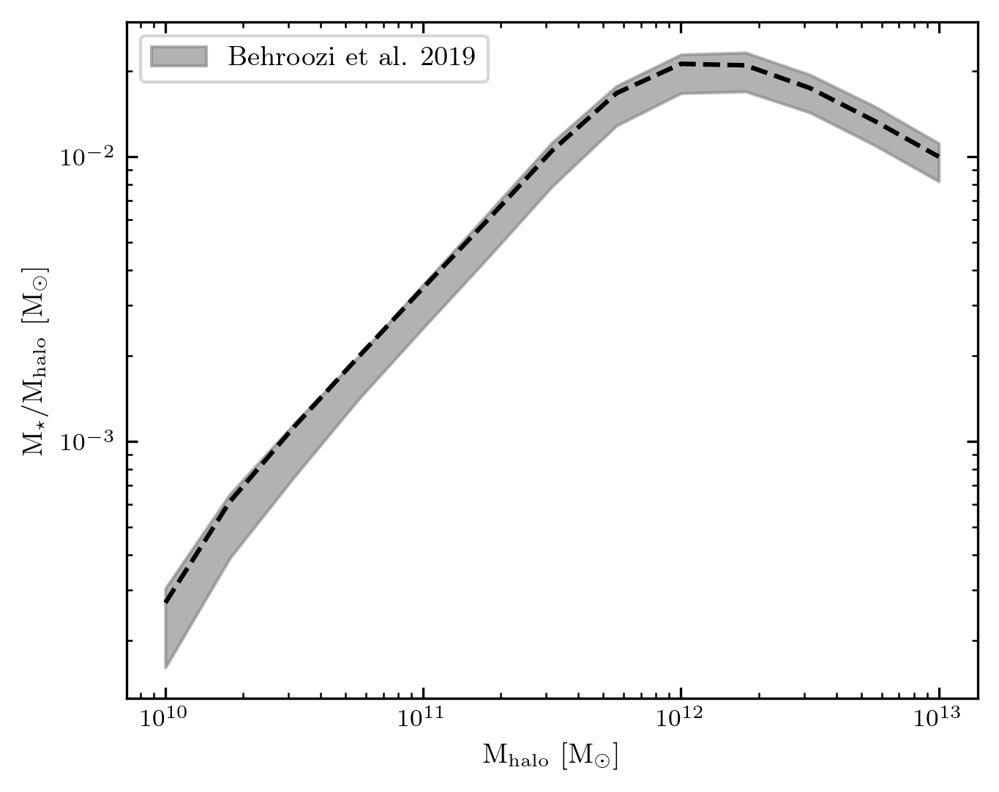

In [ ]:
smmr = np.loadtxt("./data/sm_averages_a1.002310.dat")
loghm = smmr[8:21, 0]  # halo mass
hm = 10**loghm * u.solMass

logSM = smmr[8:21, 7]  # stellar mass
sm = 10 ** logSM[8:21] * u.solMass

SMerr = np.vstack([smmr[8:21, 3], smmr[8:21, 2]])  # error array
logSMHM = smmr[8:21, 10]  # stellar mass / halo mass
SMHMerr = np.vstack([smmr[8:21, 12], smmr[8:21, 11]])  # error array
fig, ax = plt.subplots(1, 1, figsize=(5, 4), sharey="all", dpi=300)
ax.plot(10**loghm, 10**logSMHM, color="k", ls="--")
ax.fill_between(
    10**loghm,
    10 ** (logSMHM + SMHMerr[1, :]),
    10 ** (logSMHM - SMHMerr[0, :]),
    color="gray",
    alpha=0.6,
    label="Behroozi et al. 2019",
)
ax.set(
    xlabel=r"M$_{\rm halo}$ [M$_\odot$]",
    ylabel=r"M$_\star$/M$_{\rm halo}$ [M$_\odot$]",
    yscale="log",
    xscale="log",
)
ax.legend()
plt.show()

In [ ]:
def explore_halo(mhalo_z0, eta_m_, eta_e_, time_interval):
    # time_interval = (0.56, 13.7)  # z=9 to z=0
    # if (time_interval is None):
    #     #z = 15 to z=0

    #    zinit = np.sqrt((28/time_interval[0]) - 1) - 1
    #    zfinal = np.sqrt((28/time_interval[1]) - 1) - 1
    zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
    zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
    print("Running models from z = {:.2f} to z = {:.2f}".format(zinit, zfinal))
    print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

    beta = 0.9
    # eta_m = mass_loading(A, mhalo_z0, beta)

    colors = sns.color_palette()

    # Parameters
    global CGM_infall_prevention_constant, CGM_eject_specific_energy_ratio
    global eta_m, eta_e, eta_z
    eta_m = eta_m_
    eta_e = eta_e_
    CGM_infall_prevention_constant = (
        1.0  # sets how E_out is at preventing inflow (smaller - more effective)
    )
    CGM_eject_specific_energy_ratio = (
        1.0  # ratio of specific energy of ejected gas to CGM gas
    )

    global TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list
    global CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list
    global Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list
    global Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list
    global msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list
    TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list = (
        [],
        [],
        [],
        [],
        [],
        [],
    )
    CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list = ([], [], [], [])
    Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list = ([], [], [], [])
    Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list = ([], [], [], [])
    msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list = ([], [], [], [], [])

    mhalo0 = initial_mhalo(mhalo_z0, time_interval)
    Rvir = virial_radius(zfinal, mhalo0 * u.solMass).to(u.kpc)  # virial radius
    Tvir = virial_T(mhalo0 * u.solMass, Rvir).to(u.K)  # Virial Temperature
    mcgm0 = 1e3
    ecgm0 = (1e3 * u.solMass * fb * kb * Tvir / mu).to(u.erg)
    mass_initial = np.array(
        [1e3, 1e3, mcgm0, 1e1, mhalo0, 1e3, 1e3, 1e3, 1e3, ecgm0.value]
    )
    # time_interval = (0.04, 0.1)
    sol = solve_ivp(mass_evolution, time_interval, mass_initial, rtol=1e-3)

    gradients = np.zeros_like(sol.y)
    #    for i in range(len(sol.t)):
    #        print(i,len(sol.y[i]),sol.y[:,i])
    #      gradients[:,i] = mass_evolution(sol.t[i], sol.y[:,i])
    #     fprevent[i] = fprevent_func(sol.t[i,])

    t = sol.t
    mgas_t = sol.y[0]
    mstar_t = sol.y[1]
    mCGM_t = sol.y[2]
    mZM_t = sol.y[3]
    mhalo_t = sol.y[4]

    Eg_t = sol.y[5]
    El_t = sol.y[6]
    Eej_t = sol.y[7]
    Eacc_t = sol.y[8]
    ECGM_t = sol.y[9]

    Z_m = mZM_t / mCGM_t  # CGM metallicity ratio
    Z_cgm = Z_m / Z_sol  # CGM metallicity with respect to solar metallicity
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    print(sol.status)
    mcgm_dot = np.array(mcdot_list)

    print(r"M_halo = {:.4e}  Msol".format(mhalo_t[-1]))
    print(r"M_star = {:.4e}  Msol".format(mstar_t[-1]))
    print(r"f_star = {:.4e}".format(mstar_t[-1] / (fb * mhalo_t[-1])))
    print(r"M_gas = {:.4e} Msol".format(mgas_t[-1]))
    print(r"M_CGM = {:.4e}  Msol".format(mCGM_t[-1]))
    print("CGM Z = {:.2e}".format(Z_cgm[-1]))

    return_dict = {
        "TT_list": TT_list,
        "Tvir_list": Tvir_list,
        "CB_list_1": CB_list_1,
        "Eg_dot_list": Eg_dot_list,
        "El_dot_list": El_dot_list,
        "Eacc_dot_list": Eacc_dot_list,
        "Eej_dot_list": Eej_dot_list,
        "t": t,
        "mgas_t": mgas_t,
        "mstar_t": mstar_t,
        "mCGM_t": mCGM_t,
        "mZM_t": mZM_t,
        "mhalo_t": mhalo_t,
        "Eg_t": Eg_t,
        "El_t": El_t,
        "Eej_t": Eej_t,
        "Eacc_t": Eacc_t,
        "ECGM_t": ECGM_t,
        "Z_cgm": Z_cgm,
        "z": z,
        "CGM_cool_list": CGM_cool_list,
        "CGM_eject_list": CGM_eject_list,
        "CGM_gain_list": CGM_gain_list,
        "CGM_infall_list": CGM_infall_list,
        "fprevent_list": fprevent_list,
        "fstar_list": fstar_list,
    }
    print(return_dict.keys())
    return return_dict

In [ ]:
def plot_halo_evolution(model):
    TT_list = model["TT_list"]
    Tvir_list = model["Tvir_list"]
    Eg_dot_list = model["Eg_dot_list"]
    El_dot_list = model["El_dot_list"]
    Eacc_dot_list = model["Eacc_dot_list"]
    Eej_dot_list = model["Eej_dot_list"]

    t = model["t"]
    CGM_cool_list = model["CGM_cool_list"]
    CGM_eject_list = model["CGM_eject_list"]
    CGM_gain_list = model["CGM_gain_list"]
    CGM_infall_list = model["CGM_infall_list"]
    fprevent_list = model["fprevent_list"]
    fstar_list = model["fstar_list"]
    mgas_t = model["mgas_t"]
    mstar_t = model["mstar_t"]
    mCGM_t = model["mCGM_t"]
    mZM_t = model["mZM_t"]
    mhalo_t = model["mhalo_t"]
    ECGM_t = model["ECGM_t"]
    Z_cgm = model["Z_cgm"]
    z = model["z"]
    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(TT_list, Eg_dot_list, label="gain from SF", color="b")
    ax[0].plot(TT_list, El_dot_list, label="cooling loss", color="r")
    ax[0].plot(TT_list, Eacc_dot_list, label=r"cosmic infall", color="g")
    ax[0].plot(
        TT_list, Eej_dot_list, label=r"eject from energy-loading", color="orange"
    )
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(TT_list, CGM_gain_list, label="mass gain from SF", color="b")
    ax[1].plot(TT_list, CGM_cool_list, label="cooling gas", color="r")
    ax[1].plot(TT_list, CGM_infall_list, label=r"cosmic infall", color="g")
    ax[1].plot(
        TT_list, CGM_eject_list, label=r"eject from energy-loading", color="orange"
    )
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(TT_list, fprevent_list)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(TT_list, fstar_list)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t, np.log10(mCGM_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((ECGM_t * u.erg) / (mCGM_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(TT_list, Tvir_list, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):
        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(TT_list, Eg_dot_list, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t * u.Gyr).value for t in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()

Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+09 solMass  Msol


/home/fabg/.pyenv/versions/3.8.10/lib/python3.8/site-packages/astropy/units/quantity.py:673: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


0
M_halo = 1.0023e+09  Msol
M_star = 3.8381e+06  Msol
f_star = 2.3934e-02
M_gas = 2.6327e+06 Msol
M_CGM = 2.5733e+06  Msol
CGM Z = 4.78e-02
dict_keys(['TT_list', 'Tvir_list', 'CB_list_1', 'Eg_dot_list', 'El_dot_list', 'Eacc_dot_list', 'Eej_dot_list', 't', 'mgas_t', 'mstar_t', 'mCGM_t', 'mZM_t', 'mhalo_t', 'Eg_t', 'El_t', 'Eej_t', 'Eacc_t', 'ECGM_t', 'Z_cgm', 'z', 'CGM_cool_list', 'CGM_eject_list', 'CGM_gain_list', 'CGM_infall_list', 'fprevent_list', 'fstar_list'])


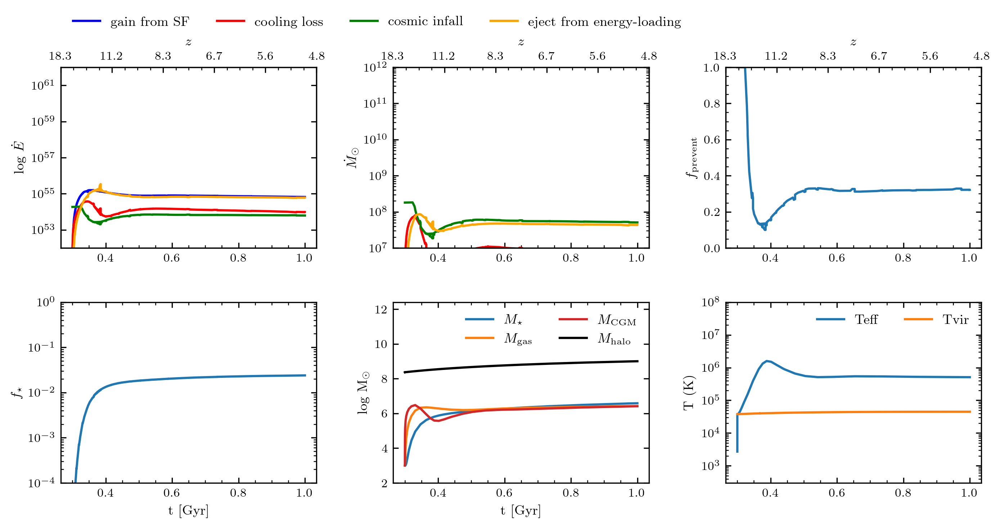

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
y = 0.02  # metallicity enrichment yield (mass in metals produced per solar mass)
fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
C = 0.4

# controls how effective outflowing energy is at preventing inflowing gas
CGM_infall_prevention_constant = 1.0
# ratio of specific energy of ejected gas to CGM gas
CGM_eject_specific_energy_ratio = 1.0
# time, virial temperature, cooling function, depletion time, inflow prevention factor, star formation efficiency
TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list = (
    [],
    [],
    [],
    [],
    [],
    [],
)
#
CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list = ([], [], [], [])
Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list = ([], [], [], [])
Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list = ([], [], [], [])
msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list = ([], [], [], [], [])

time_interval = (0.3, 1.0)
mh1e9t_004_05 = explore_halo(1e9 * u.solMass, 0.3, 0.15, time_interval)
plot_halo_evolution(mh1e9t_004_05)

In [ ]:
time_interval = (0.1, 13.4)
mh1e11t_01_10 = explore_halo(1e11 * u.solMass, 3, 0.3, time_interval)
plot_halo_evolution(mh1e11t_01_10)

Running models from z = 29.69 redshift to z = 0.00 redshift
Halo mass at z=0 = 1.00e+11 solMass  Msol


/home/fabg/.pyenv/versions/3.8.10/lib/python3.8/site-packages/astropy/units/quantity.py:673: RuntimeWarning: invalid value encountered in power
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


0
M_halo = 1.0104e+11  Msol
M_star = 6.9515e+08  Msol
f_star = 4.3001e-02
M_gas = 7.1116e+07 Msol
M_CGM = 3.7173e+08  Msol
CGM Z = 2.94e-02
dict_keys(['TT_list', 'Tvir_list', 'CB_list_1', 'Eg_dot_list', 'El_dot_list', 'Eacc_dot_list', 'Eej_dot_list', 't', 'mgas_t', 'mstar_t', 'mCGM_t', 'mZM_t', 'mhalo_t', 'Eg_t', 'El_t', 'Eej_t', 'Eacc_t', 'ECGM_t', 'Z_cgm', 'z', 'CGM_cool_list', 'CGM_eject_list', 'CGM_gain_list', 'CGM_infall_list', 'fprevent_list', 'fstar_list'])


CosmologyError: Best guess z=999.9999865617187 is very close to the upper z limit 1000.0.
Try re-running with a different zmax.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import os
from astropy.io import fits
from scipy.stats import norm
import glob
from scipy import interpolate
from scipy import integrate
from scipy.integrate import solve_ivp
from astropy import cosmology
import h5py
from regulator_lib.cooling_fn_generator import cooling_fn_generator
import astropy.constants as consts
import astropy.units as u
import seaborn as sns

# standard flat cosmology
LCDM = cosmology.LambdaCDM(H0=70, Om0=0.3, Ode0=0.7)

cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")
matplotlib.rcParams.update(matplotlib.rcParamsDefault)
plt.rcParams.update(
    {
        "text.usetex": True,
        # "font.family": "Helvetica",
        "font.family": "serif",
        "mathtext.fontset": "cm",
        "xtick.labelsize": 8,
        "ytick.labelsize": 8,
        "font.size": 9,
        "xtick.direction": "in",
        "ytick.direction": "in",
        "ytick.right": True,
        "xtick.top": True,
        # "xtick.major.size": 6,
        # "ytick.major.size": 6,
        # "xtick.minor.size": 4,
        # "ytick.minor.size": 4,
    }
)

reading file ['./tables/Lambda_tab_redshifts.npz']


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import os
from astropy.io import fits
from scipy.stats import norm
import glob
from scipy import interpolate
from scipy import integrate
from scipy.integrate import solve_ivp
from astropy import cosmology
import h5py
from regulator_lib.cooling_fn_generator import cooling_fn_generator
import astropy.constants as consts
import astropy.units as u
import seaborn as sns

# standard flat cosmology
LCDM = cosmology.LambdaCDM(H0=70, Om0=0.3, Ode0=0.7)

cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")
matplotlib.rcParams.update(matplotlib.rcParamsDefault)
plt.rcParams.update(
    {
        "text.usetex": True,
        # "font.family": "Helvetica",
        "font.family": "serif",
        "mathtext.fontset": "cm",
        "xtick.labelsize": 8,
        "ytick.labelsize": 8,
        "font.size": 9,
        "xtick.direction": "in",
        "ytick.direction": "in",
        "ytick.right": True,
        "xtick.top": True,
        # "xtick.major.size": 6,
        # "ytick.major.size": 6,
        # "xtick.minor.size": 4,
        # "ytick.minor.size": 4,
    }
)

reading file ['./tables/Lambda_tab_redshifts.npz']


In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
y = 0.02  # metallicity enrichment yield (mass in metals produced per solar mass)
fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial z=6 halo mass
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    # Finds initial z=6 halo mass for a given (z=0) halo mass
    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # z=6 halo mass


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        np.max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * np.max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energy inflow rate
    # eq 16 with some mods
    dot_e_cgm_in = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)

    # CGM infall prevention factor: ratio of ejection energy / infall energy

    # t_dep_list.append(t_dep.value)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import os
from astropy.io import fits
from scipy.stats import norm
import glob
from scipy import interpolate
from scipy import integrate
from scipy.integrate import solve_ivp
from astropy import cosmology
import h5py
from regulator_lib.cooling_fn_generator import cooling_fn_generator
import astropy.constants as consts
import astropy.units as u
import seaborn as sns

LCDM = cosmology.LambdaCDM(H0=70, Om0=0.3, Ode0=0.7)  # Astropy built-in cosmology
import astropy.units as u

matplotlib.rcParams.update(matplotlib.rcParamsDefault)
plt.rcParams.update(
    {
        "text.usetex": True,
        # "font.family": "Helvetica",
        "font.family": "serif",
        "mathtext.fontset": "cm",
        "xtick.labelsize": 8,
        "ytick.labelsize": 8,
        "font.size": 9,
        "xtick.direction": "in",
        "ytick.direction": "in",
        "ytick.right": True,
        "xtick.top": True,
        # "xtick.major.size": 6,
        # "ytick.major.size": 6,
        # "xtick.minor.size": 4,
        # "ytick.minor.size": 4,
    }
)

In [ ]:
cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")


# Parameters for eta_m function
A = 1
beta = 0.7


def mass_loading(A, mhalo, alpha):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)

reading file ['./tables/Lambda_tab_redshifts.npz']


In [ ]:
def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, C):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        C (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return C * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


# def density0(mCGM, alpha, r1, Rvir):  # density factor
#     return (mCGM * (3 - alpha)) / (
#         (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
#     )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial z=6 halo mass
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    # Finds initial z=6 halo mass for a given (z=0) halo mass
    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # z=6 halo mass


# def loss_integrand(x, alpha): # Integrand for calculating CGM mass loss
#    return x**(-2*alpha) * x**2

# def electron_density(Lamb, T, t_ff): # equation (1) from Voit et al 2015
#    return (3*kb*T) / (10 * Lamb * t_ff)

# def CGM_massloss_integrand(x, r1, alpha, rho0, Rvir, mhalo, Tvir, Lamb):
#    rho = rho0 * ((x*u.kpc)/r1)**(-alpha)
#    tcool = 2*((1.5 * mu * kb * Tvir) / (rho * Lamb)).to(u.Gyr)
#    tff = t_ff((x*u.kpc), Rvir, mhalo).to(u.Gyr)
#    return (x**(2-alpha)) / (tcool.value + 0*tff.value)

# def E_IN_integrand(x, Tvir, Rvir, mhalo, Lamb): # Integrand for calculating energy loss from the CGM
##    ne = electron_density(Lamb, Tvir, t_ff((x*u.kpc), Rvir, mhalo)).to(u.kpc**-3).value
#    tff = t_ff((x*u.kpc), Rvir, mhalo).to(u.Gyr)
#    ne = ((3*kb*Tvir) / (10 * Lamb * tff)).to(u.kpc**-3).value
#    return ne**2 * x**2

# def CGM_profile(x,Tvir, Rvir, mhalo, Lamb): # integrand for estimating halo mass from CGM density profile
#    ne_r = electron_density(Lamb, Tvir, t_ff((x*u.kpc), Rvir, mhalo)).to(u.kpc**-3).value
#    return ne_r*x**2


# def energy_loss(Lamb, Tvir, Rvir, mhalo): # radiative energy loss from the CGM
#    return (Lamb* 4*np.pi * (integrate.quad(E_IN_integrand, 10, Rvir.value, epsrel=1e-3,
#            args=(Tvir, Rvir, mhalo, Lamb))[0] * u.kpc**-3)).to(u.erg * u.Gyr**-1)

In [ ]:
def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    mgas = mass[0] * u.solMass
    mstar = mass[1] * u.solMass
    mCGM = mass[2] * u.solMass  # Total CGM mass
    mZM = mass[3] * u.solMass
    mhalo = mass[4] * u.solMass

    E_g = mass[5] * (u.erg)  # Energy gained from energy-loaded galactic winds
    E_l = mass[6] * (u.erg)  # Energy loss from gas precipitation onto the Galaxy
    E_ej = mass[7] * (u.erg)  # Energy loss from mass enjected from the CGM
    E_acc = mass[8] * (u.erg)  # Energy gained from mass accretion from the IGM
    E_CGM = mass[9] * (u.erg)  # Total CGM energy

    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift

    t_dep = depletion_time(z, mstar, exp, C)  # estimate of depletion time
    # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr
    t_dep_list.append(t_dep.value)

    Rvir = virial_radius(z, mhalo).to(u.kpc)  # virial radius
    Tvir = virial_T(mhalo, Rvir).to(u.K)  # Virial Temperature
    rho_crit = LCDM.critical_density(z)  # critical density
    t_dyn = t_ff(Rvir, Rvir, mhalo).to(u.Gyr)  # dynamical time
    # t_cool = 10 * t_ff(Rvir,Rvir, mhalo).to(u.Gyr) # cooling time from precipitation
    Z_m = mZM / mCGM  # CGM metallicity
    Z = Z_m / Z_sol  # CGM metallicity with respect to solar metallicity
    Lamb = cooling_fn((-4, np.log10(Tvir.value), Z, 0)) * (
        u.erg * u.cm**3 * u.s**-1
    )  # cooling function value

    # Compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * Rvir  # our definition of inner radius of CGM
    # r1 = 10.0*u.kpc # Another possible definition of inner radius of CGM

    rho0 = density0(mCGM=mCGM, alpha=alpha, r1=r1, Rvir=Rvir)  # central density of CGM

    # Energy ejection loss timescale
    cs = np.sqrt(E_CGM / mCGM)  # specific energy of CGM (approximate sound speed)
    t_ej = Rvir / cs  # ejection time of hot gas
    t_ej = min(max(t_ej, 0.1 * t_dyn), t_dyn)  # clip to range 0.1-1 t_dyn

    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    Eej_dot = (max(E_CGM - kb * Tvir * mCGM / mu, 0.0 * u.erg) / t_ej).to(u.erg / u.Gyr)

    # Energy radiative loss
    # integrated radiative loss rate
    El_dot = energy_loss(Lamb, Rvir, r1, rho0).to(u.erg / u.Gyr)

    # specific energy of ejected gas
    CGM_specific_energy = CGM_eject_specific_energy_ratio * max(
        E_CGM / mCGM, kb * Tvir / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (CGM_specific_energy / El_dot) * mCGM
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling

    # include dynamical time?
    tcool_eff = tcool_eff + 1 * t_dyn
    El_dot = (E_CGM / tcool_eff).to(u.erg / u.Gyr)

    # CGM mass loss due to cooling (using effective cooling time)
    CGM_cool_dot = (mCGM / tcool_eff).to(u.solMass / u.Gyr)

    # Mass Terms
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)
    mstar_dot = (mgas / t_dep).to(u.solMass / u.Gyr)
    mgas_dot = (-(mgas / t_dep) * (1 + eta_m) + CGM_cool_dot).to(u.solMass / u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)

    # CGM eject loss term
    CGM_eject_dot = ((1 / CGM_specific_energy) * Eej_dot).to(u.solMass / u.Gyr)

    # CGM infall terms
    CGM_infall_dot = fb * mhalo_dot

    # CGM infall prevention factor: ratio of ejection energy / infall energy
    Eej_infall_ratio = CGM_infall_prevention_constant / (
        Eej_dot / ((kb * Tvir / mu) * CGM_infall_dot)
    ).to(u.dimensionless_unscaled)
    fprevent = min(max(Eej_infall_ratio, 0.1), 1.0)  # clip to 0.1-1.0
    CGM_infall_dot *= fprevent

    # CGM feedback gain term
    CGM_gain_dot = mstar_dot * eta_m

    # Energy gain due to star formation
    Eg_dot = energy_gain(eta_e, mstar_dot)

    # Energy loss due to ejection
    Eacc_dot = ((kb * Tvir) / mu * CGM_infall_dot).to(u.erg * u.Gyr**-1)

    # totaol Mass, energy, and metallicity derivatives
    mCGM_dot = CGM_infall_dot + CGM_gain_dot - CGM_cool_dot - CGM_eject_dot
    #    print(mCGM_dot, CGM_infall_dot, CGM_gain_dot, CGM_cool_dot, CGM_eject_dot)
    mZM_dot = (
        eta_z * y * mstar_dot
        + Z_IGM * Z_sol * CGM_infall_dot
        - Z_m * (CGM_cool_dot + CGM_eject_dot)
    )
    ECGM_dot = Eg_dot + 1 * Eacc_dot - Eej_dot - 1 * El_dot

    if (mCGM.value < 3e5) & (mCGM_dot < 0):
        mCGM_dot *= max((mCGM.value - 5e3) / 5e3, 0)
    #        mCGM_dot = 0.0 * u.solMass/u.Gyr

    # Record some quantities for plotting later
    TT_list.append(t)  # Time [Gyr]
    Tvir_list.append(Tvir.value)

    Eej_dot_list.append(Eej_dot.value)
    El_dot_list.append(El_dot.value)
    Eacc_dot_list.append(Eacc_dot.value)
    Eg_dot_list.append(Eg_dot.value)

    CGM_eject_list.append(CGM_eject_dot.value)
    CGM_cool_list.append(CGM_cool_dot.value)
    CGM_infall_list.append(CGM_infall_dot.value)
    CGM_gain_list.append(CGM_gain_dot.value)

    fprevent_list.append(fprevent)
    fstar_list.append(mstar / (fb * mhalo))

    grad_array = np.array(
        [
            mgas_dot.value,
            mstar_dot.value,
            mCGM_dot.value,
            mZM_dot.value,
            mhalo_dot.value,
            Eg_dot.value,
            El_dot.value,
            Eej_dot.value,
            Eacc_dot.value,
            ECGM_dot.value,
        ]
    )

    #    plot_list.append( (t,grad_array,Tvir_list,fprevent))

    return grad_array


def bathtub(time_interval, mhalo_z0):
    """run the model for a given halo mass at z=0

    Args:
        time_interval (float): tuple, time interval for the model (units: Gyr)
        mhalo_z0 (float): stellar mass at z=0 (units: solar mass)

    Returns:
        (array): time, redshift, gas mass, stellar mass, CGM mass, halo mass, CGM metallicity, energy gain, energy loss, energy ejection, energy accretion, CGM energy
    """

    mhalo0 = initial_mhalo(mhalo_z0, time_interval)
    Rvir = virial_radius(0, mhalo0 * u.solMass).to(u.kpc)  # virial radius
    Tvir = virial_T(mhalo0 * u.solMass, Rvir).to(u.K)  # Virial Temperature
    mcgm0 = 1e3
    ecgm0 = (1e3 * u.solMass * fb * kb * Tvir / mu).to(u.erg)
    mass_initial = np.array(
        [1e3, 1e3, mcgm0, 1e1, mhalo0, 1e3, 1e3, 1e3, 1e3, ecgm0.value]
    )

    sol = solve_ivp(mass_evolution, time_interval, mass_initial, rtol=1e-3)
    t = sol.t
    mgas_t = sol.y[0]
    mstar_t = sol.y[1]
    mCGM_t = sol.y[2]
    mZM_t = sol.y[3]
    mhalo_t = sol.y[4]

    Eg_t = sol.y[5]
    El_t = sol.y[6]
    Eej_t = sol.y[7]
    Eacc_t = sol.y[8]
    ECGM_t = sol.y[9]

    Z_m = mZM_t / mCGM_t  # CGM metallicity ratio
    Z_cgm = Z_m / Z_sol  # CGM metallicity with respect to solar metallicity
    #   z = np.sqrt((28/t) - 1) - 1 # cosmological redshift rough approx
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    return (
        t,
        z,
        mgas_t,
        mstar_t,
        mCGM_t,
        mhalo_t,
        Z_cgm,
        Eg_t,
        El_t,
        Eej_t,
        Eacc_t,
        ECGM_t,
    )

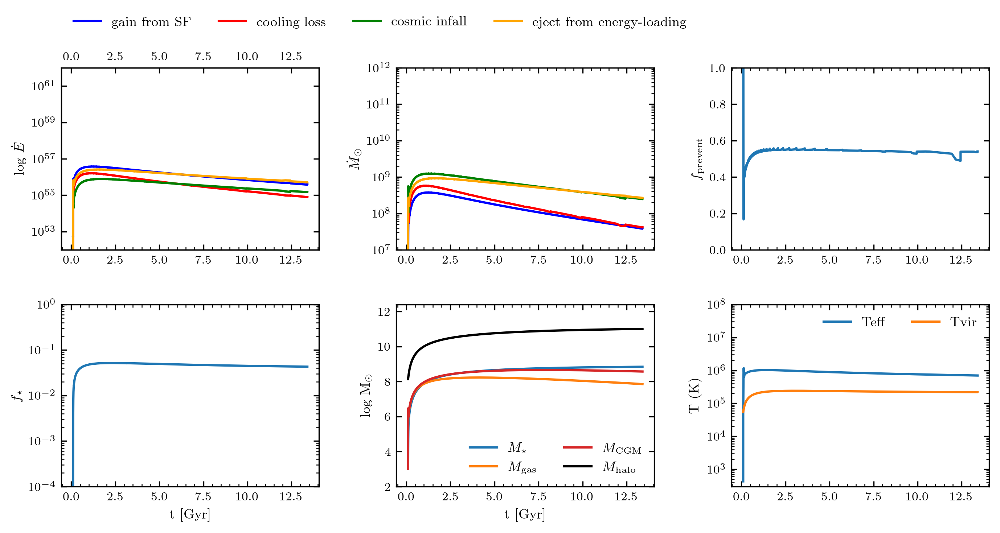

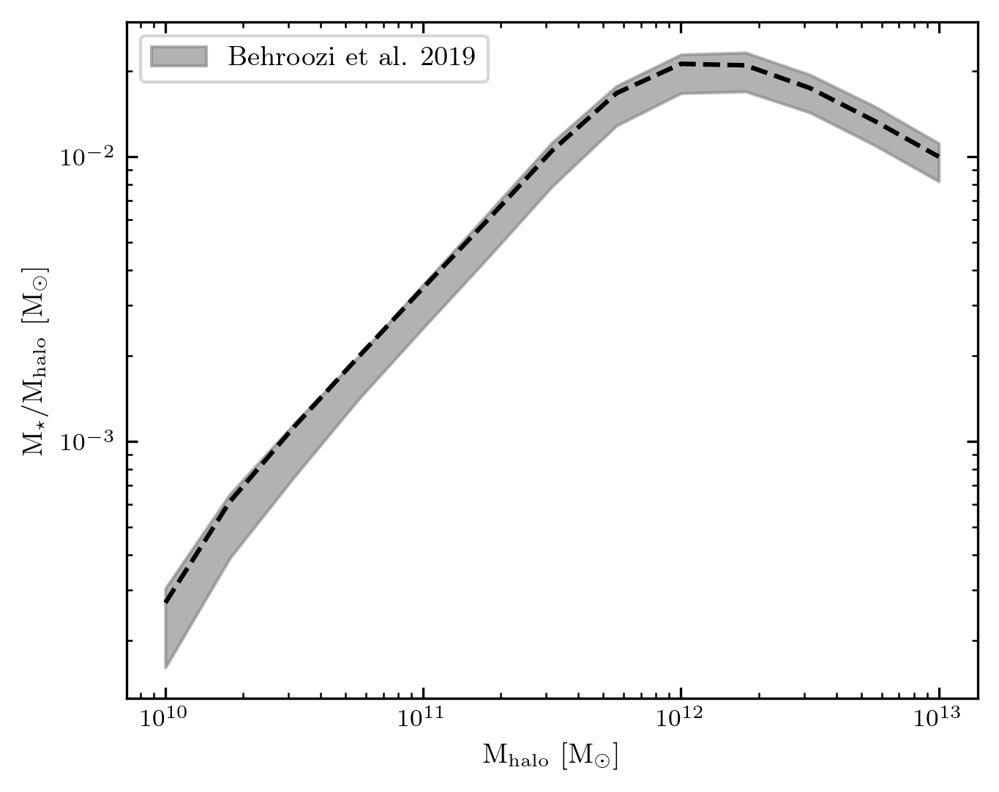

In [ ]:
smmr = np.loadtxt("./data/sm_averages_a1.002310.dat")
loghm = smmr[8:21, 0]  # halo mass
hm = 10**loghm * u.solMass

logSM = smmr[8:21, 7]  # stellar mass
sm = 10 ** logSM[8:21] * u.solMass

SMerr = np.vstack([smmr[8:21, 3], smmr[8:21, 2]])  # error array
logSMHM = smmr[8:21, 10]  # stellar mass / halo mass
SMHMerr = np.vstack([smmr[8:21, 12], smmr[8:21, 11]])  # error array
fig, ax = plt.subplots(1, 1, figsize=(5, 4), sharey="all", dpi=300)
ax.plot(10**loghm, 10**logSMHM, color="k", ls="--")
ax.fill_between(
    10**loghm,
    10 ** (logSMHM + SMHMerr[1, :]),
    10 ** (logSMHM - SMHMerr[0, :]),
    color="gray",
    alpha=0.6,
    label="Behroozi et al. 2019",
)
ax.set(
    xlabel=r"M$_{\rm halo}$ [M$_\odot$]",
    ylabel=r"M$_\star$/M$_{\rm halo}$ [M$_\odot$]",
    yscale="log",
    xscale="log",
)
ax.legend()
plt.show()

In [ ]:
def explore_halo(mhalo_z0, eta_m_, eta_e_, time_interval):
    # time_interval = (0.56, 13.7)  # z=9 to z=0
    # if (time_interval is None):
    #     #z = 15 to z=0

    #    zinit = np.sqrt((28/time_interval[0]) - 1) - 1
    #    zfinal = np.sqrt((28/time_interval[1]) - 1) - 1
    zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
    zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
    print("Running models from z = {:.2f} to z = {:.2f}".format(zinit, zfinal))
    print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

    beta = 0.9
    # eta_m = mass_loading(A, mhalo_z0, beta)

    colors = sns.color_palette()

    # Parameters
    global CGM_infall_prevention_constant, CGM_eject_specific_energy_ratio
    global eta_m, eta_e, eta_z
    eta_m = eta_m_
    eta_e = eta_e_
    CGM_infall_prevention_constant = (
        1.0  # sets how E_out is at preventing inflow (smaller - more effective)
    )
    CGM_eject_specific_energy_ratio = (
        1.0  # ratio of specific energy of ejected gas to CGM gas
    )

    global TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list
    global CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list
    global Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list
    global Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list
    global msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list
    TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list = (
        [],
        [],
        [],
        [],
        [],
        [],
    )
    CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list = ([], [], [], [])
    Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list = ([], [], [], [])
    Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list = ([], [], [], [])
    msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list = ([], [], [], [], [])

    mhalo0 = initial_mhalo(mhalo_z0, time_interval)
    Rvir = virial_radius(zfinal, mhalo0 * u.solMass).to(u.kpc)  # virial radius
    Tvir = virial_T(mhalo0 * u.solMass, Rvir).to(u.K)  # Virial Temperature
    mcgm0 = 1e3
    ecgm0 = (1e3 * u.solMass * fb * kb * Tvir / mu).to(u.erg)
    mass_initial = np.array(
        [1e3, 1e3, mcgm0, 1e1, mhalo0, 1e3, 1e3, 1e3, 1e3, ecgm0.value]
    )
    # time_interval = (0.04, 0.1)
    sol = solve_ivp(mass_evolution, time_interval, mass_initial, rtol=1e-3)

    gradients = np.zeros_like(sol.y)
    #    for i in range(len(sol.t)):
    #        print(i,len(sol.y[i]),sol.y[:,i])
    #      gradients[:,i] = mass_evolution(sol.t[i], sol.y[:,i])
    #     fprevent[i] = fprevent_func(sol.t[i,])

    t = sol.t
    mgas_t = sol.y[0]
    mstar_t = sol.y[1]
    mCGM_t = sol.y[2]
    mZM_t = sol.y[3]
    mhalo_t = sol.y[4]

    Eg_t = sol.y[5]
    El_t = sol.y[6]
    Eej_t = sol.y[7]
    Eacc_t = sol.y[8]
    ECGM_t = sol.y[9]

    Z_m = mZM_t / mCGM_t  # CGM metallicity ratio
    Z_cgm = Z_m / Z_sol  # CGM metallicity with respect to solar metallicity
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    print(sol.status)
    mcgm_dot = np.array(mcdot_list)

    print(r"M_halo = {:.4e}  Msol".format(mhalo_t[-1]))
    print(r"M_star = {:.4e}  Msol".format(mstar_t[-1]))
    print(r"f_star = {:.4e}".format(mstar_t[-1] / (fb * mhalo_t[-1])))
    print(r"M_gas = {:.4e} Msol".format(mgas_t[-1]))
    print(r"M_CGM = {:.4e}  Msol".format(mCGM_t[-1]))
    print("CGM Z = {:.2e}".format(Z_cgm[-1]))

    return_dict = {
        "TT_list": TT_list,
        "Tvir_list": Tvir_list,
        "CB_list_1": CB_list_1,
        "Eg_dot_list": Eg_dot_list,
        "El_dot_list": El_dot_list,
        "Eacc_dot_list": Eacc_dot_list,
        "Eej_dot_list": Eej_dot_list,
        "t": t,
        "mgas_t": mgas_t,
        "mstar_t": mstar_t,
        "mCGM_t": mCGM_t,
        "mZM_t": mZM_t,
        "mhalo_t": mhalo_t,
        "Eg_t": Eg_t,
        "El_t": El_t,
        "Eej_t": Eej_t,
        "Eacc_t": Eacc_t,
        "ECGM_t": ECGM_t,
        "Z_cgm": Z_cgm,
        "z": z,
        "CGM_cool_list": CGM_cool_list,
        "CGM_eject_list": CGM_eject_list,
        "CGM_gain_list": CGM_gain_list,
        "CGM_infall_list": CGM_infall_list,
        "fprevent_list": fprevent_list,
        "fstar_list": fstar_list,
    }
    print(return_dict.keys())
    return return_dict

In [ ]:
def plot_halo_evolution(model):
    TT_list = model["TT_list"]
    Tvir_list = model["Tvir_list"]
    Eg_dot_list = model["Eg_dot_list"]
    El_dot_list = model["El_dot_list"]
    Eacc_dot_list = model["Eacc_dot_list"]
    Eej_dot_list = model["Eej_dot_list"]

    t = model["t"]
    CGM_cool_list = model["CGM_cool_list"]
    CGM_eject_list = model["CGM_eject_list"]
    CGM_gain_list = model["CGM_gain_list"]
    CGM_infall_list = model["CGM_infall_list"]
    fprevent_list = model["fprevent_list"]
    fstar_list = model["fstar_list"]
    mgas_t = model["mgas_t"]
    mstar_t = model["mstar_t"]
    mCGM_t = model["mCGM_t"]
    mZM_t = model["mZM_t"]
    mhalo_t = model["mhalo_t"]
    ECGM_t = model["ECGM_t"]
    Z_cgm = model["Z_cgm"]
    z = model["z"]
    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(TT_list, Eg_dot_list, label="gain from SF", color="b")
    ax[0].plot(TT_list, El_dot_list, label="cooling loss", color="r")
    ax[0].plot(TT_list, Eacc_dot_list, label=r"cosmic infall", color="g")
    ax[0].plot(
        TT_list, Eej_dot_list, label=r"eject from energy-loading", color="orange"
    )
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(TT_list, CGM_gain_list, label="mass gain from SF", color="b")
    ax[1].plot(TT_list, CGM_cool_list, label="cooling gas", color="r")
    ax[1].plot(TT_list, CGM_infall_list, label=r"cosmic infall", color="g")
    ax[1].plot(
        TT_list, CGM_eject_list, label=r"eject from energy-loading", color="orange"
    )
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(TT_list, fprevent_list)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(TT_list, fstar_list)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t, np.log10(mCGM_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((ECGM_t * u.erg) / (mCGM_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(TT_list, Tvir_list, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):
        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(TT_list, Eg_dot_list, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t * u.Gyr).value for t in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()

Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+09 solMass  Msol


/home/fabg/.pyenv/versions/3.8.10/lib/python3.8/site-packages/astropy/units/quantity.py:673: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


0
M_halo = 1.0023e+09  Msol
M_star = 3.8381e+06  Msol
f_star = 2.3934e-02
M_gas = 2.6327e+06 Msol
M_CGM = 2.5733e+06  Msol
CGM Z = 4.78e-02
dict_keys(['TT_list', 'Tvir_list', 'CB_list_1', 'Eg_dot_list', 'El_dot_list', 'Eacc_dot_list', 'Eej_dot_list', 't', 'mgas_t', 'mstar_t', 'mCGM_t', 'mZM_t', 'mhalo_t', 'Eg_t', 'El_t', 'Eej_t', 'Eacc_t', 'ECGM_t', 'Z_cgm', 'z', 'CGM_cool_list', 'CGM_eject_list', 'CGM_gain_list', 'CGM_infall_list', 'fprevent_list', 'fstar_list'])


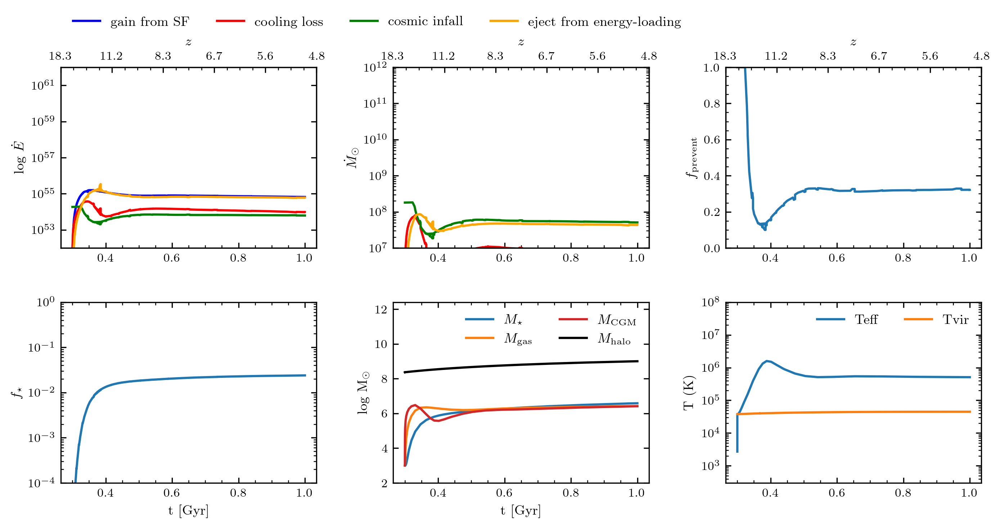

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
y = 0.02  # metallicity enrichment yield (mass in metals produced per solar mass)
fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
C = 0.4

# controls how effective outflowing energy is at preventing inflowing gas
CGM_infall_prevention_constant = 1.0
# ratio of specific energy of ejected gas to CGM gas
CGM_eject_specific_energy_ratio = 1.0
# time, virial temperature, cooling function, depletion time, inflow prevention factor, star formation efficiency
TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list = (
    [],
    [],
    [],
    [],
    [],
    [],
)
#
CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list = ([], [], [], [])
Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list = ([], [], [], [])
Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list = ([], [], [], [])
msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list = ([], [], [], [], [])

time_interval = (0.3, 1.0)
mh1e9t_004_05 = explore_halo(1e9 * u.solMass, 0.3, 0.15, time_interval)
plot_halo_evolution(mh1e9t_004_05)

In [ ]:
time_interval = (0.1, 13.4)
mh1e11t_01_10 = explore_halo(1e11 * u.solMass, 3, 0.3, time_interval)
plot_halo_evolution(mh1e11t_01_10)

Running models from z = 29.69 redshift to z = 0.00 redshift
Halo mass at z=0 = 1.00e+11 solMass  Msol


/home/fabg/.pyenv/versions/3.8.10/lib/python3.8/site-packages/astropy/units/quantity.py:673: RuntimeWarning: invalid value encountered in power
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


0
M_halo = 1.0104e+11  Msol
M_star = 6.9515e+08  Msol
f_star = 4.3001e-02
M_gas = 7.1116e+07 Msol
M_CGM = 3.7173e+08  Msol
CGM Z = 2.94e-02
dict_keys(['TT_list', 'Tvir_list', 'CB_list_1', 'Eg_dot_list', 'El_dot_list', 'Eacc_dot_list', 'Eej_dot_list', 't', 'mgas_t', 'mstar_t', 'mCGM_t', 'mZM_t', 'mhalo_t', 'Eg_t', 'El_t', 'Eej_t', 'Eacc_t', 'ECGM_t', 'Z_cgm', 'z', 'CGM_cool_list', 'CGM_eject_list', 'CGM_gain_list', 'CGM_infall_list', 'fprevent_list', 'fstar_list'])


CosmologyError: Best guess z=999.9999865617187 is very close to the upper z limit 1000.0.
Try re-running with a different zmax.

In [ ]:
time_interval = (0.1, 13.4)
mh1e11t_01_10 = explore_halo(1e11 * u.solMass, 3, 0.3, time_interval)
plot_halo_evolution(mh1e11t_01_10)

Running models from z = 29.69 redshift to z = 0.00 redshift
Halo mass at z=0 = 1.00e+11 solMass  Msol


/home/fabg/.pyenv/versions/3.8.10/lib/python3.8/site-packages/astropy/units/quantity.py:673: RuntimeWarning: invalid value encountered in power
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/home/fabg/.pyenv/versions/3.8.10/lib/python3.8/site-packages/astropy/units/quantity.py:673: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


0
M_halo = 1.0104e+11  Msol
M_star = 6.9515e+08  Msol
f_star = 4.3001e-02
M_gas = 7.1116e+07 Msol
M_CGM = 3.7173e+08  Msol
CGM Z = 2.94e-02
dict_keys(['TT_list', 'Tvir_list', 'CB_list_1', 'Eg_dot_list', 'El_dot_list', 'Eacc_dot_list', 'Eej_dot_list', 't', 'mgas_t', 'mstar_t', 'mCGM_t', 'mZM_t', 'mhalo_t', 'Eg_t', 'El_t', 'Eej_t', 'Eacc_t', 'ECGM_t', 'Z_cgm', 'z', 'CGM_cool_list', 'CGM_eject_list', 'CGM_gain_list', 'CGM_infall_list', 'fprevent_list', 'fstar_list'])


CosmologyError: Best guess z=999.9999865617187 is very close to the upper z limit 1000.0.
Try re-running with a different zmax.

Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+09 solMass  Msol
0
M_halo = 1.0023e+09  Msol
M_star = 3.8381e+06  Msol
f_star = 2.3934e-02
M_gas = 2.6327e+06 Msol
M_CGM = 2.5733e+06  Msol
CGM Z = 4.78e-02
dict_keys(['TT_list', 'Tvir_list', 'CB_list_1', 'Eg_dot_list', 'El_dot_list', 'Eacc_dot_list', 'Eej_dot_list', 't', 'mgas_t', 'mstar_t', 'mCGM_t', 'mZM_t', 'mhalo_t', 'Eg_t', 'El_t', 'Eej_t', 'Eacc_t', 'ECGM_t', 'Z_cgm', 'z', 'CGM_cool_list', 'CGM_eject_list', 'CGM_gain_list', 'CGM_infall_list', 'fprevent_list', 'fstar_list'])


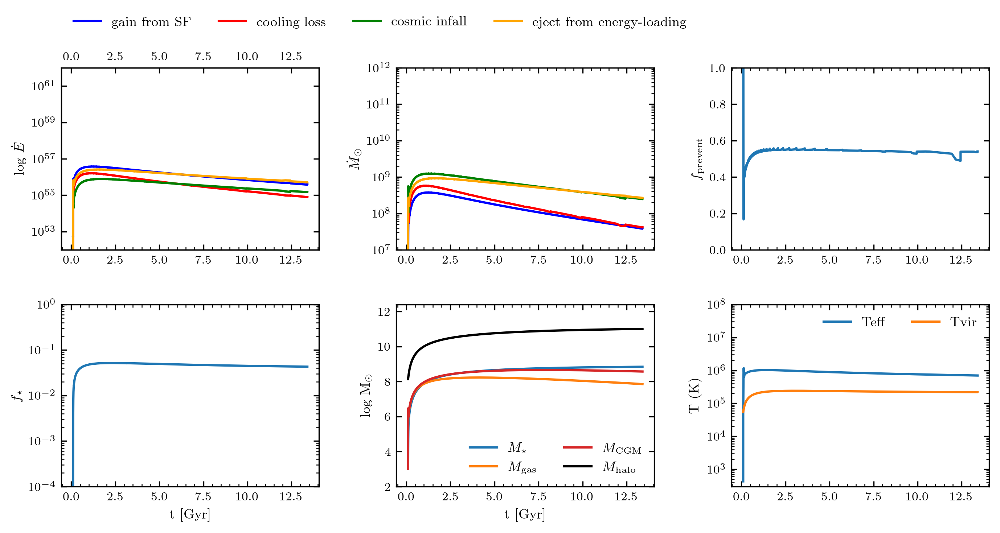

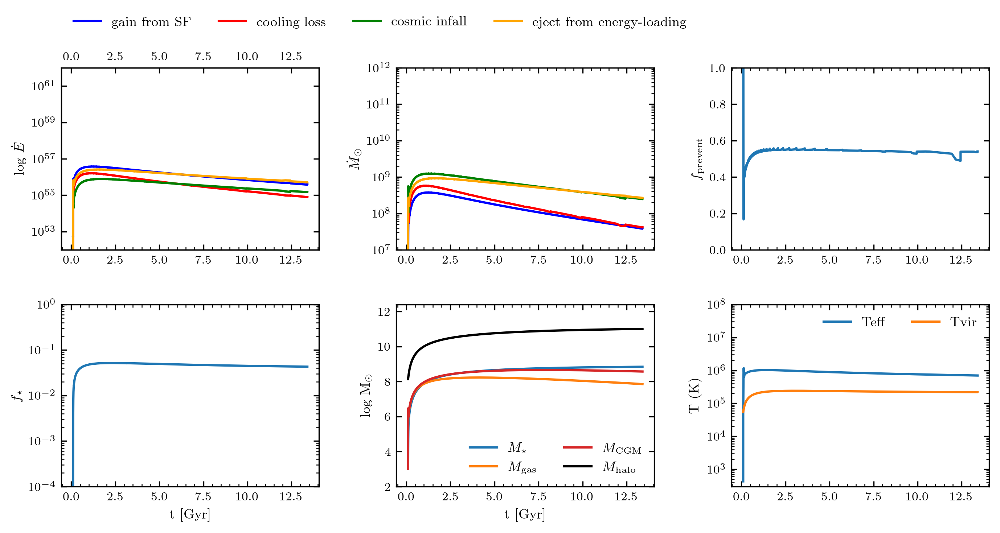

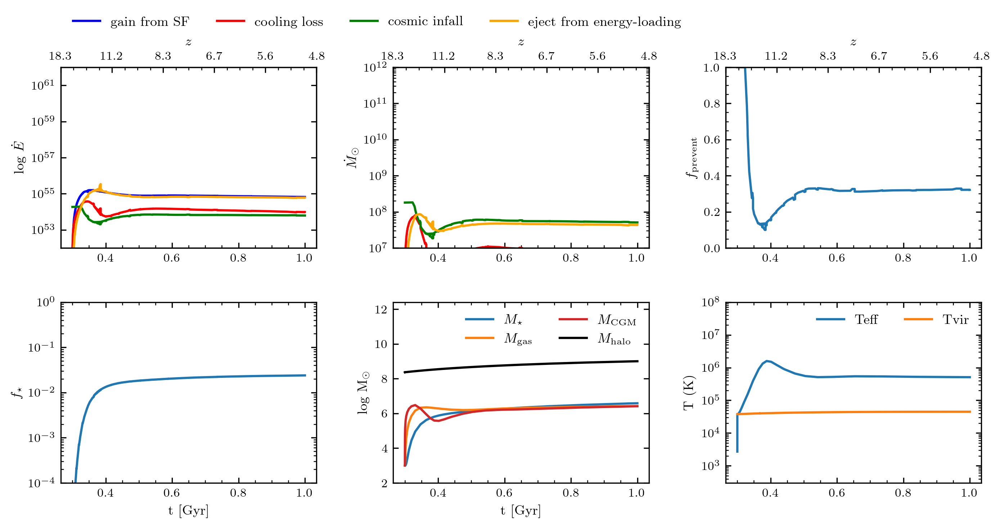

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
y = 0.02  # metallicity enrichment yield (mass in metals produced per solar mass)
fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
C = 0.4

# controls how effective outflowing energy is at preventing inflowing gas
CGM_infall_prevention_constant = 1.0
# ratio of specific energy of ejected gas to CGM gas
CGM_eject_specific_energy_ratio = 1.0
# time, virial temperature, cooling function, depletion time, inflow prevention factor, star formation efficiency
TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list = (
    [],
    [],
    [],
    [],
    [],
    [],
)
#
CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list = ([], [], [], [])
Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list = ([], [], [], [])
Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list = ([], [], [], [])
msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list = ([], [], [], [], [])

time_interval = (0.3, 1.0)
mh1e9t_004_05 = explore_halo(1e9 * u.solMass, 0.3, 0.15, time_interval)
plot_halo_evolution(mh1e9t_004_05)

Running models from z = 13.75 redshift to z = 18.33 redshift
Halo mass at z=0 = 1.00e+09 solMass  Msol


/home/fabg/.pyenv/versions/3.8.10/lib/python3.8/site-packages/astropy/units/quantity.py:673: RuntimeWarning: invalid value encountered in sqrt
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


-1
M_halo = 2.3714e+09  Msol
M_star = 1.0000e+03  Msol
f_star = 2.6356e-06
M_gas = 1.0000e+03 Msol
M_CGM = 7.9037e+02  Msol
CGM Z = 9.42e-01
dict_keys(['TT_list', 'Tvir_list', 'CB_list_1', 'Eg_dot_list', 'El_dot_list', 'Eacc_dot_list', 'Eej_dot_list', 't', 'mgas_t', 'mstar_t', 'mCGM_t', 'mZM_t', 'mhalo_t', 'Eg_t', 'El_t', 'Eej_t', 'Eacc_t', 'ECGM_t', 'Z_cgm', 'z', 'CGM_cool_list', 'CGM_eject_list', 'CGM_gain_list', 'CGM_infall_list', 'fprevent_list', 'fstar_list'])


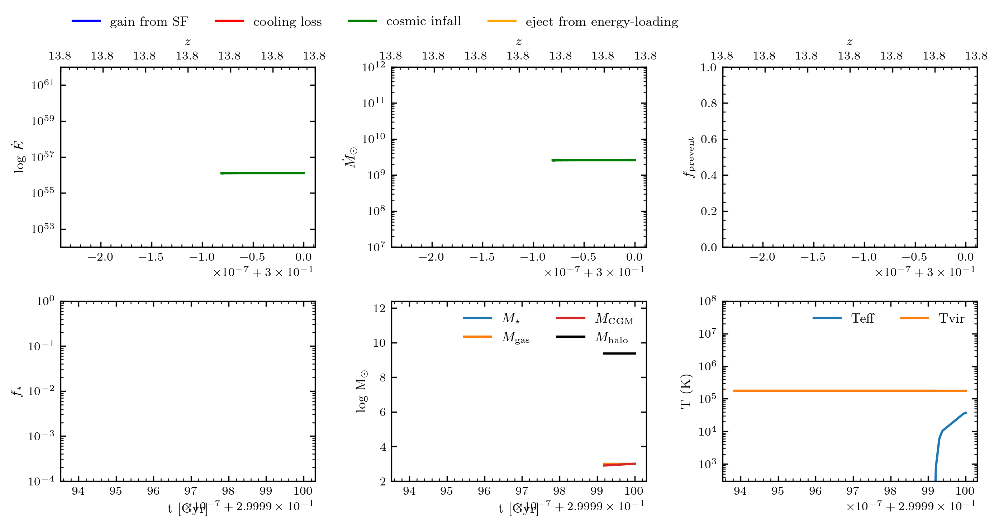

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
y = 0.02  # metallicity enrichment yield (mass in metals produced per solar mass)
fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
C = 0.4

# controls how effective outflowing energy is at preventing inflowing gas
CGM_infall_prevention_constant = 1.0
# ratio of specific energy of ejected gas to CGM gas
CGM_eject_specific_energy_ratio = 1.0
# time, virial temperature, cooling function, depletion time, inflow prevention factor, star formation efficiency
TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list = (
    [],
    [],
    [],
    [],
    [],
    [],
)
#
CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list = ([], [], [], [])
Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list = ([], [], [], [])
Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list = ([], [], [], [])
msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list = ([], [], [], [], [])

time_interval = (0.3, 0.20)
mh1e9t_004_05 = explore_halo(1e9 * u.solMass, 0.3, 0.15, time_interval)
plot_halo_evolution(mh1e9t_004_05)

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
y = 0.02  # metallicity enrichment yield (mass in metals produced per solar mass)
fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
C = 0.4

# controls how effective outflowing energy is at preventing inflowing gas
CGM_infall_prevention_constant = 1.0
# ratio of specific energy of ejected gas to CGM gas
CGM_eject_specific_energy_ratio = 1.0
# time, virial temperature, cooling function, depletion time, inflow prevention factor, star formation efficiency
TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list = (
    [],
    [],
    [],
    [],
    [],
    [],
)
#
CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list = ([], [], [], [])
Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list = ([], [], [], [])
Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list = ([], [], [], [])
msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list = ([], [], [], [], [])

time_interval = (0.3, 2.0)
mh1e9t_004_05 = explore_halo(1e9 * u.solMass, 0.3, 0.15, time_interval)
plot_halo_evolution(mh1e9t_004_05)

Running models from z = 13.75 redshift to z = 3.15 redshift
Halo mass at z=0 = 1.00e+09 solMass  Msol


/home/fabg/.pyenv/versions/3.8.10/lib/python3.8/site-packages/astropy/units/quantity.py:673: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/home/fabg/.pyenv/versions/3.8.10/lib/python3.8/site-packages/astropy/units/quantity.py:673: RuntimeWarning: invalid value encountered in sqrt
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


0
M_halo = 1.0028e+09  Msol
M_star = 2.4871e+06  Msol
f_star = 1.5501e-02
M_gas = 8.2402e+05 Msol
M_CGM = 2.8493e+06  Msol
CGM Z = 2.56e-02
dict_keys(['TT_list', 'Tvir_list', 'CB_list_1', 'Eg_dot_list', 'El_dot_list', 'Eacc_dot_list', 'Eej_dot_list', 't', 'mgas_t', 'mstar_t', 'mCGM_t', 'mZM_t', 'mhalo_t', 'Eg_t', 'El_t', 'Eej_t', 'Eacc_t', 'ECGM_t', 'Z_cgm', 'z', 'CGM_cool_list', 'CGM_eject_list', 'CGM_gain_list', 'CGM_infall_list', 'fprevent_list', 'fstar_list'])


CosmologyError: Best guess z=999.9999865617187 is very close to the upper z limit 1000.0.
Try re-running with a different zmax.

Running models from z = 13.75 redshift to z = 2.15 redshift
Halo mass at z=0 = 1.00e+09 solMass  Msol
-1
M_halo = 1.2620e+08  Msol
M_star = -1.9828e+03  Msol
f_star = -9.8196e-05
M_gas = -1.8348e+05 Msol
M_CGM = 4.4017e+05  Msol
CGM Z = 1.64e-02
dict_keys(['TT_list', 'Tvir_list', 'CB_list_1', 'Eg_dot_list', 'El_dot_list', 'Eacc_dot_list', 'Eej_dot_list', 't', 'mgas_t', 'mstar_t', 'mCGM_t', 'mZM_t', 'mhalo_t', 'Eg_t', 'El_t', 'Eej_t', 'Eacc_t', 'ECGM_t', 'Z_cgm', 'z', 'CGM_cool_list', 'CGM_eject_list', 'CGM_gain_list', 'CGM_infall_list', 'fprevent_list', 'fstar_list'])


<ipython-input-28-71fd21e31285>:74: RuntimeWarning: invalid value encountered in log10
  ax[4].plot(t, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
<ipython-input-28-71fd21e31285>:75: RuntimeWarning: invalid value encountered in log10
  ax[4].plot(t, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])


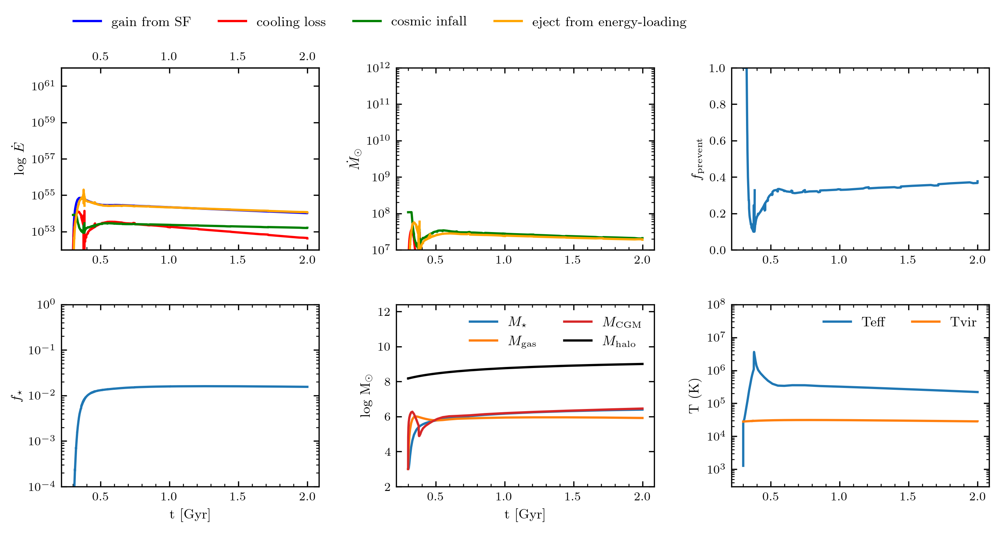

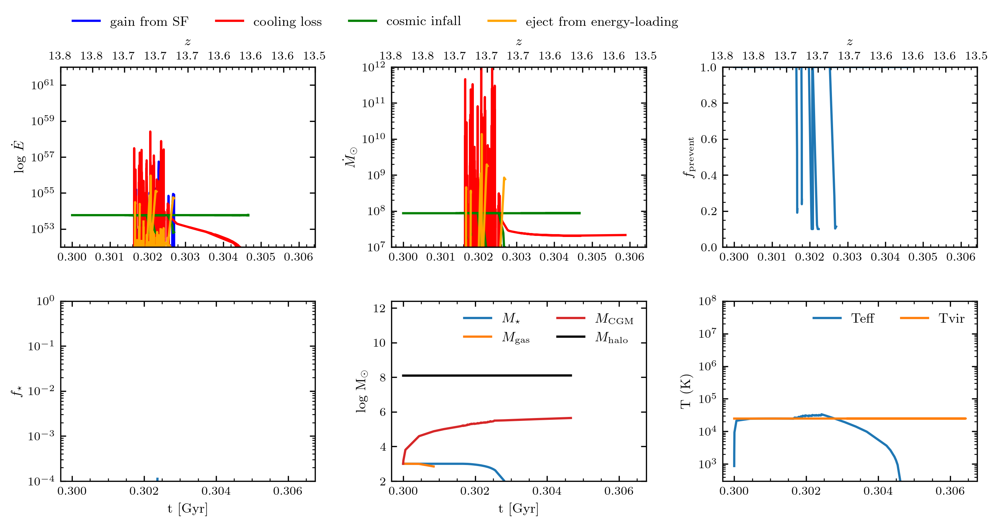

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
y = 0.02  # metallicity enrichment yield (mass in metals produced per solar mass)
fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
C = 0.4

# controls how effective outflowing energy is at preventing inflowing gas
CGM_infall_prevention_constant = 1.0
# ratio of specific energy of ejected gas to CGM gas
CGM_eject_specific_energy_ratio = 1.0
# time, virial temperature, cooling function, depletion time, inflow prevention factor, star formation efficiency
TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list = (
    [],
    [],
    [],
    [],
    [],
    [],
)
#
CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list = ([], [], [], [])
Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list = ([], [], [], [])
Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list = ([], [], [], [])
msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list = ([], [], [], [], [])

time_interval = (0.3, 3.0)
mh1e9t_004_05 = explore_halo(1e9 * u.solMass, 0.3, 0.15, time_interval)
plot_halo_evolution(mh1e9t_004_05)

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
y = 0.02  # metallicity enrichment yield (mass in metals produced per solar mass)
fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
C = 0.4

# controls how effective outflowing energy is at preventing inflowing gas
CGM_infall_prevention_constant = 1.0
# ratio of specific energy of ejected gas to CGM gas
CGM_eject_specific_energy_ratio = 1.0
# time, virial temperature, cooling function, depletion time, inflow prevention factor, star formation efficiency
TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list = (
    [],
    [],
    [],
    [],
    [],
    [],
)
#
CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list = ([], [], [], [])
Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list = ([], [], [], [])
Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list = ([], [], [], [])
msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list = ([], [], [], [], [])

time_interval = (0.3, 3.0)
mh1e9t_004_05 = explore_halo(1e12 * u.solMass, 0.3, 0.15, time_interval)
plot_halo_evolution(mh1e9t_004_05)

Running models from z = 13.75 redshift to z = 2.15 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol


/home/fabg/.pyenv/versions/3.8.10/lib/python3.8/site-packages/astropy/units/quantity.py:673: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


0
M_halo = 1.0071e+12  Msol
M_star = 3.2859e+10  Msol
f_star = 2.0393e-01
M_gas = 2.9804e+10 Msol
M_CGM = 4.0131e+10  Msol
CGM Z = 9.53e-02
dict_keys(['TT_list', 'Tvir_list', 'CB_list_1', 'Eg_dot_list', 'El_dot_list', 'Eacc_dot_list', 'Eej_dot_list', 't', 'mgas_t', 'mstar_t', 'mCGM_t', 'mZM_t', 'mhalo_t', 'Eg_t', 'El_t', 'Eej_t', 'Eacc_t', 'ECGM_t', 'Z_cgm', 'z', 'CGM_cool_list', 'CGM_eject_list', 'CGM_gain_list', 'CGM_infall_list', 'fprevent_list', 'fstar_list'])


CosmologyError: Best guess z=999.9999865617187 is very close to the upper z limit 1000.0.
Try re-running with a different zmax.

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
y = 0.02  # metallicity enrichment yield (mass in metals produced per solar mass)
fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
C = 0.4

# controls how effective outflowing energy is at preventing inflowing gas
CGM_infall_prevention_constant = 1.0
# ratio of specific energy of ejected gas to CGM gas
CGM_eject_specific_energy_ratio = 1.0
# time, virial temperature, cooling function, depletion time, inflow prevention factor, star formation efficiency
TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list = (
    [],
    [],
    [],
    [],
    [],
    [],
)
#
CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list = ([], [], [], [])
Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list = ([], [], [], [])
Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list = ([], [], [], [])
msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list = ([], [], [], [], [])

time_interval = (0.2, 0.10)
mh1e9t_004_05 = explore_halo(1e12 * u.solMass, 0.3, 0.15, time_interval)
plot_halo_evolution(mh1e9t_004_05)

Running models from z = 18.33 redshift to z = 29.69 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol


/home/fabg/.pyenv/versions/3.8.10/lib/python3.8/site-packages/astropy/units/quantity.py:673: RuntimeWarning: invalid value encountered in sqrt
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


-1
M_halo = 1.9610e+16  Msol
M_star = 1.0000e+03  Msol
f_star = 3.1871e-13
M_gas = 1.0000e+03 Msol
M_CGM = 8.8072e+02  Msol
CGM Z = 8.46e-01
dict_keys(['TT_list', 'Tvir_list', 'CB_list_1', 'Eg_dot_list', 'El_dot_list', 'Eacc_dot_list', 'Eej_dot_list', 't', 'mgas_t', 'mstar_t', 'mCGM_t', 'mZM_t', 'mhalo_t', 'Eg_t', 'El_t', 'Eej_t', 'Eacc_t', 'ECGM_t', 'Z_cgm', 'z', 'CGM_cool_list', 'CGM_eject_list', 'CGM_gain_list', 'CGM_infall_list', 'fprevent_list', 'fstar_list'])


KeyboardInterrupt: 

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
y = 0.02  # metallicity enrichment yield (mass in metals produced per solar mass)
fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
C = 0.4

# controls how effective outflowing energy is at preventing inflowing gas
CGM_infall_prevention_constant = 1.0
# ratio of specific energy of ejected gas to CGM gas
CGM_eject_specific_energy_ratio = 1.0
# time, virial temperature, cooling function, depletion time, inflow prevention factor, star formation efficiency
TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list = (
    [],
    [],
    [],
    [],
    [],
    [],
)
#
CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list = ([], [], [], [])
Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list = ([], [], [], [])
Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list = ([], [], [], [])
msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list = ([], [], [], [], [])

time_interval = (0.2, 1.0)
mh1e9t_004_05 = explore_halo(1e12 * u.solMass, 0.3, 0.15, time_interval)
plot_halo_evolution(mh1e9t_004_05)

Running models from z = 18.33 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
0
M_halo = 1.0059e+12  Msol
M_star = 2.9073e+10  Msol
f_star = 1.8065e-01
M_gas = 4.9637e+10 Msol
M_CGM = 6.1314e+10  Msol
CGM Z = 8.78e-02
dict_keys(['TT_list', 'Tvir_list', 'CB_list_1', 'Eg_dot_list', 'El_dot_list', 'Eacc_dot_list', 'Eej_dot_list', 't', 'mgas_t', 'mstar_t', 'mCGM_t', 'mZM_t', 'mhalo_t', 'Eg_t', 'El_t', 'Eej_t', 'Eacc_t', 'ECGM_t', 'Z_cgm', 'z', 'CGM_cool_list', 'CGM_eject_list', 'CGM_gain_list', 'CGM_infall_list', 'fprevent_list', 'fstar_list'])


CosmologyError: Best guess z=999.9999865617187 is very close to the upper z limit 1000.0.
Try re-running with a different zmax.

Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
0
M_halo = 1.0034e+12  Msol
M_star = 2.7784e+10  Msol
f_star = 1.7307e-01
M_gas = 4.9553e+10 Msol
M_CGM = 6.1109e+10  Msol
CGM Z = 8.80e-02
dict_keys(['TT_list', 'Tvir_list', 'CB_list_1', 'Eg_dot_list', 'El_dot_list', 'Eacc_dot_list', 'Eej_dot_list', 't', 'mgas_t', 'mstar_t', 'mCGM_t', 'mZM_t', 'mhalo_t', 'Eg_t', 'El_t', 'Eej_t', 'Eacc_t', 'ECGM_t', 'Z_cgm', 'z', 'CGM_cool_list', 'CGM_eject_list', 'CGM_gain_list', 'CGM_infall_list', 'fprevent_list', 'fstar_list'])


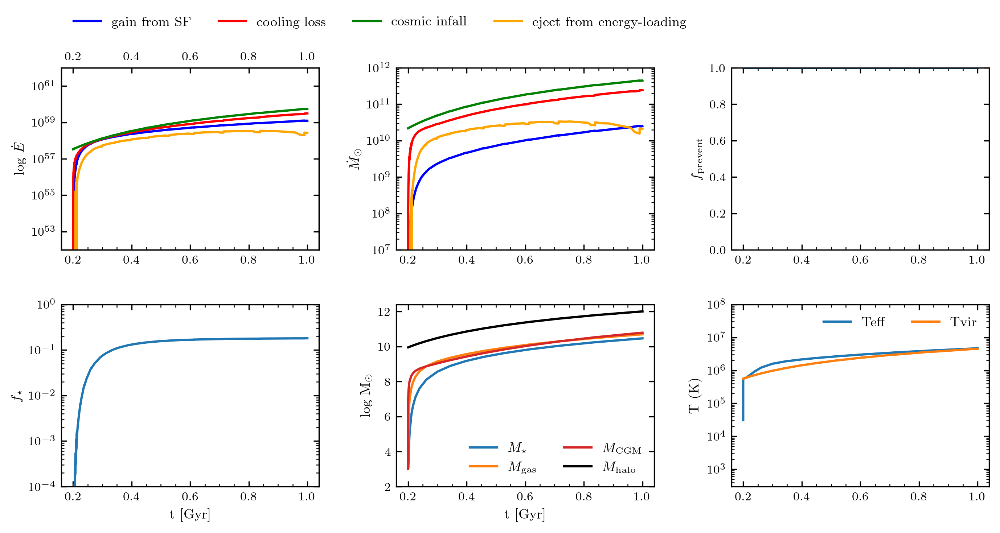

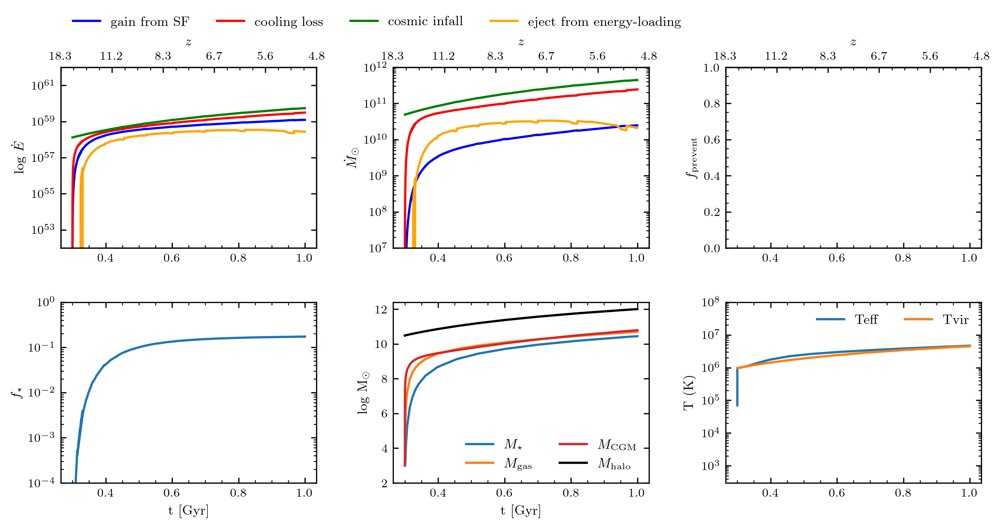

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
y = 0.02  # metallicity enrichment yield (mass in metals produced per solar mass)
fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
C = 0.4

# controls how effective outflowing energy is at preventing inflowing gas
CGM_infall_prevention_constant = 1.0
# ratio of specific energy of ejected gas to CGM gas
CGM_eject_specific_energy_ratio = 1.0
# time, virial temperature, cooling function, depletion time, inflow prevention factor, star formation efficiency
TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list = (
    [],
    [],
    [],
    [],
    [],
    [],
)
#
CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list = ([], [], [], [])
Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list = ([], [], [], [])
Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list = ([], [], [], [])
msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list = ([], [], [], [], [])

time_interval = (0.3, 1.0)
mh1e9t_004_05 = explore_halo(1e12 * u.solMass, 0.3, 0.15, time_interval)
plot_halo_evolution(mh1e9t_004_05)

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
y = 0.02  # metallicity enrichment yield (mass in metals produced per solar mass)
fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
C = 0.4

# controls how effective outflowing energy is at preventing inflowing gas
CGM_infall_prevention_constant = 1.0
# ratio of specific energy of ejected gas to CGM gas
CGM_eject_specific_energy_ratio = 1.0
# time, virial temperature, cooling function, depletion time, inflow prevention factor, star formation efficiency
TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list = (
    [],
    [],
    [],
    [],
    [],
    [],
)
#
CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list = ([], [], [], [])
Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list = ([], [], [], [])
Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list = ([], [], [], [])
msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list = ([], [], [], [], [])

time_interval = (0.3, 2.0)
mh1e9t_004_05 = explore_halo(1e12 * u.solMass, 0.3, 0.15, time_interval)
plot_halo_evolution(mh1e9t_004_05)

Running models from z = 13.75 redshift to z = 3.15 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol


/home/fabg/.pyenv/versions/3.8.10/lib/python3.8/site-packages/astropy/units/quantity.py:673: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


0
M_halo = 1.0053e+12  Msol
M_star = 3.1387e+10  Msol
f_star = 1.9513e-01
M_gas = 3.6422e+10 Msol
M_CGM = 4.8295e+10  Msol
CGM Z = 9.29e-02
dict_keys(['TT_list', 'Tvir_list', 'CB_list_1', 'Eg_dot_list', 'El_dot_list', 'Eacc_dot_list', 'Eej_dot_list', 't', 'mgas_t', 'mstar_t', 'mCGM_t', 'mZM_t', 'mhalo_t', 'Eg_t', 'El_t', 'Eej_t', 'Eacc_t', 'ECGM_t', 'Z_cgm', 'z', 'CGM_cool_list', 'CGM_eject_list', 'CGM_gain_list', 'CGM_infall_list', 'fprevent_list', 'fstar_list'])


CosmologyError: Best guess z=999.9999865617187 is very close to the upper z limit 1000.0.
Try re-running with a different zmax.

In [ ]:
def plot_halo_evolution(model):
    TT_list = model["TT_list"]
    Tvir_list = model["Tvir_list"]
    Eg_dot_list = model["Eg_dot_list"]
    El_dot_list = model["El_dot_list"]
    Eacc_dot_list = model["Eacc_dot_list"]
    Eej_dot_list = model["Eej_dot_list"]

    t = model["t"]
    CGM_cool_list = model["CGM_cool_list"]
    CGM_eject_list = model["CGM_eject_list"]
    CGM_gain_list = model["CGM_gain_list"]
    CGM_infall_list = model["CGM_infall_list"]
    fprevent_list = model["fprevent_list"]
    fstar_list = model["fstar_list"]
    mgas_t = model["mgas_t"]
    mstar_t = model["mstar_t"]
    mCGM_t = model["mCGM_t"]
    mZM_t = model["mZM_t"]
    mhalo_t = model["mhalo_t"]
    ECGM_t = model["ECGM_t"]
    Z_cgm = model["Z_cgm"]
    z = model["z"]
    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(TT_list, Eg_dot_list, label="gain from SF", color="b")
    ax[0].plot(TT_list, El_dot_list, label="cooling loss", color="r")
    ax[0].plot(TT_list, Eacc_dot_list, label=r"cosmic infall", color="g")
    ax[0].plot(
        TT_list, Eej_dot_list, label=r"eject from energy-loading", color="orange"
    )
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(TT_list, CGM_gain_list, label="mass gain from SF", color="b")
    ax[1].plot(TT_list, CGM_cool_list, label="cooling gas", color="r")
    ax[1].plot(TT_list, CGM_infall_list, label=r"cosmic infall", color="g")
    ax[1].plot(
        TT_list, CGM_eject_list, label=r"eject from energy-loading", color="orange"
    )
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(TT_list, fprevent_list)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(TT_list, fstar_list)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t, np.log10(mCGM_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((ECGM_t * u.erg) / (mCGM_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(TT_list, Tvir_list, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):
        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(TT_list, Eg_dot_list, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t * u.Gyr).value for t in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
y = 0.02  # metallicity enrichment yield (mass in metals produced per solar mass)
fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
C = 0.4

# controls how effective outflowing energy is at preventing inflowing gas
CGM_infall_prevention_constant = 1.0
# ratio of specific energy of ejected gas to CGM gas
CGM_eject_specific_energy_ratio = 1.0
# time, virial temperature, cooling function, depletion time, inflow prevention factor, star formation efficiency
TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list = (
    [],
    [],
    [],
    [],
    [],
    [],
)
#
CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list = ([], [], [], [])
Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list = ([], [], [], [])
Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list = ([], [], [], [])
msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list = ([], [], [], [], [])

time_interval = (0.3, 2.0)
mh1e9t_004_05 = explore_halo(1e12 * u.solMass, 0.3, 0.15, time_interval)
plot_halo_evolution(mh1e9t_004_05)

Running models from z = 13.75 redshift to z = 3.15 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
0
M_halo = 1.0053e+12  Msol
M_star = 3.1387e+10  Msol
f_star = 1.9513e-01
M_gas = 3.6422e+10 Msol
M_CGM = 4.8295e+10  Msol
CGM Z = 9.29e-02
dict_keys(['TT_list', 'Tvir_list', 'CB_list_1', 'Eg_dot_list', 'El_dot_list', 'Eacc_dot_list', 'Eej_dot_list', 't', 'mgas_t', 'mstar_t', 'mCGM_t', 'mZM_t', 'mhalo_t', 'Eg_t', 'El_t', 'Eej_t', 'Eacc_t', 'ECGM_t', 'Z_cgm', 'z', 'CGM_cool_list', 'CGM_eject_list', 'CGM_gain_list', 'CGM_infall_list', 'fprevent_list', 'fstar_list'])
[0.  0.5 1.  1.5 2.  2.5]


CosmologyError: Best guess z=999.9999865617187 is very close to the upper z limit 1000.0.
Try re-running with a different zmax.

In [ ]:
def plot_halo_evolution(model):
    TT_list = model["TT_list"]
    Tvir_list = model["Tvir_list"]
    Eg_dot_list = model["Eg_dot_list"]
    El_dot_list = model["El_dot_list"]
    Eacc_dot_list = model["Eacc_dot_list"]
    Eej_dot_list = model["Eej_dot_list"]

    t = model["t"]
    CGM_cool_list = model["CGM_cool_list"]
    CGM_eject_list = model["CGM_eject_list"]
    CGM_gain_list = model["CGM_gain_list"]
    CGM_infall_list = model["CGM_infall_list"]
    fprevent_list = model["fprevent_list"]
    fstar_list = model["fstar_list"]
    mgas_t = model["mgas_t"]
    mstar_t = model["mstar_t"]
    mCGM_t = model["mCGM_t"]
    mZM_t = model["mZM_t"]
    mhalo_t = model["mhalo_t"]
    ECGM_t = model["ECGM_t"]
    Z_cgm = model["Z_cgm"]
    z = model["z"]
    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(TT_list, Eg_dot_list, label="gain from SF", color="b")
    ax[0].plot(TT_list, El_dot_list, label="cooling loss", color="r")
    ax[0].plot(TT_list, Eacc_dot_list, label=r"cosmic infall", color="g")
    ax[0].plot(
        TT_list, Eej_dot_list, label=r"eject from energy-loading", color="orange"
    )
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(TT_list, CGM_gain_list, label="mass gain from SF", color="b")
    ax[1].plot(TT_list, CGM_cool_list, label="cooling gas", color="r")
    ax[1].plot(TT_list, CGM_infall_list, label=r"cosmic infall", color="g")
    ax[1].plot(
        TT_list, CGM_eject_list, label=r"eject from energy-loading", color="orange"
    )
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(TT_list[0], TT_list[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(TT_list, fprevent_list)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(TT_list, fstar_list)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t, np.log10(mCGM_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((ECGM_t * u.erg) / (mCGM_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(TT_list, Tvir_list, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(TT_list, Eg_dot_list, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t * u.Gyr).value for t in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()

Running models from z = 13.75 redshift to z = 3.15 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
0
M_halo = 1.0053e+12  Msol
M_star = 3.1387e+10  Msol
f_star = 1.9513e-01
M_gas = 3.6422e+10 Msol
M_CGM = 4.8295e+10  Msol
CGM Z = 9.29e-02
dict_keys(['TT_list', 'Tvir_list', 'CB_list_1', 'Eg_dot_list', 'El_dot_list', 'Eacc_dot_list', 'Eej_dot_list', 't', 'mgas_t', 'mstar_t', 'mCGM_t', 'mZM_t', 'mhalo_t', 'Eg_t', 'El_t', 'Eej_t', 'Eacc_t', 'ECGM_t', 'Z_cgm', 'z', 'CGM_cool_list', 'CGM_eject_list', 'CGM_gain_list', 'CGM_infall_list', 'fprevent_list', 'fstar_list'])
[0.25 0.5  0.75 1.   1.25 1.5  1.75 2.  ]
[0.25 0.5  0.75 1.   1.25 1.5  1.75 2.  ]
[0.25 0.5  0.75 1.   1.25 1.5  1.75 2.  ]


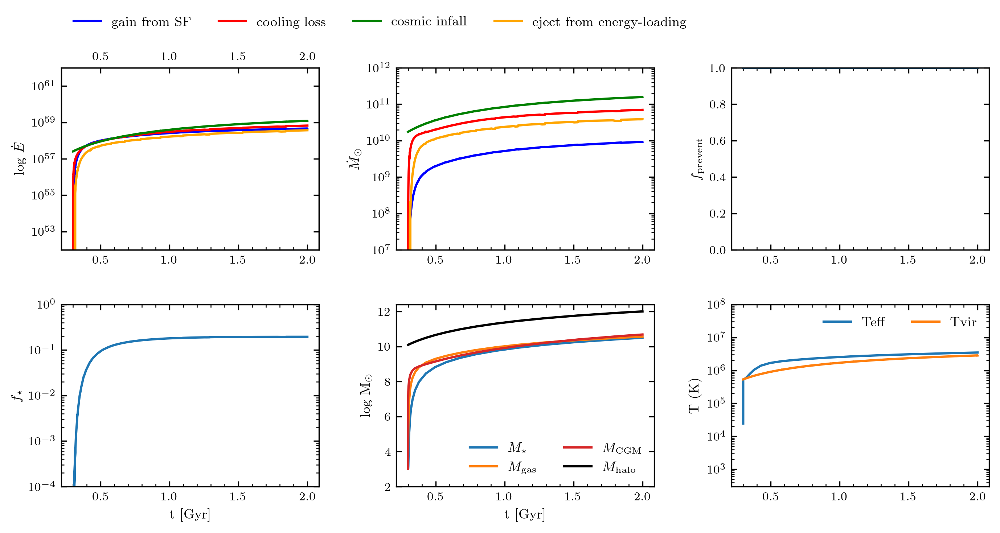

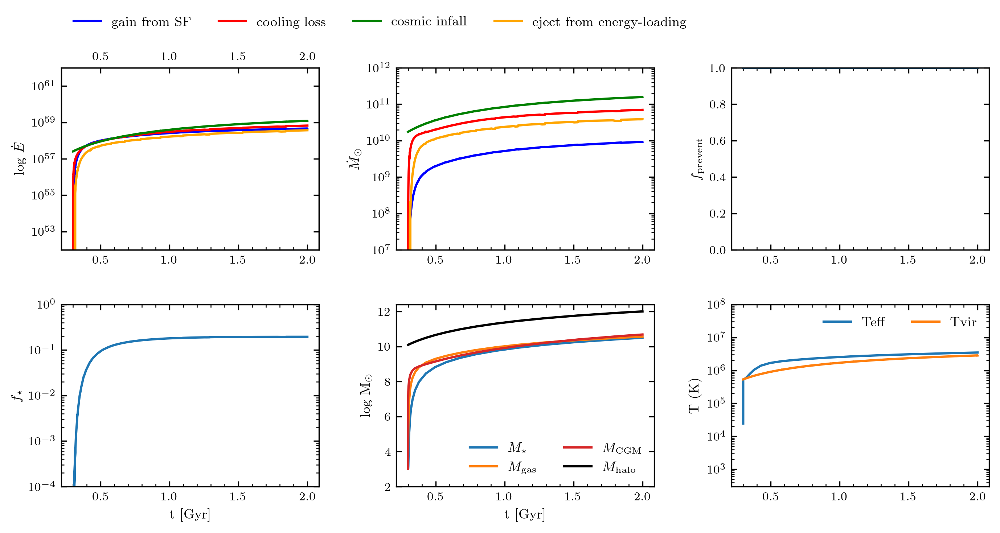

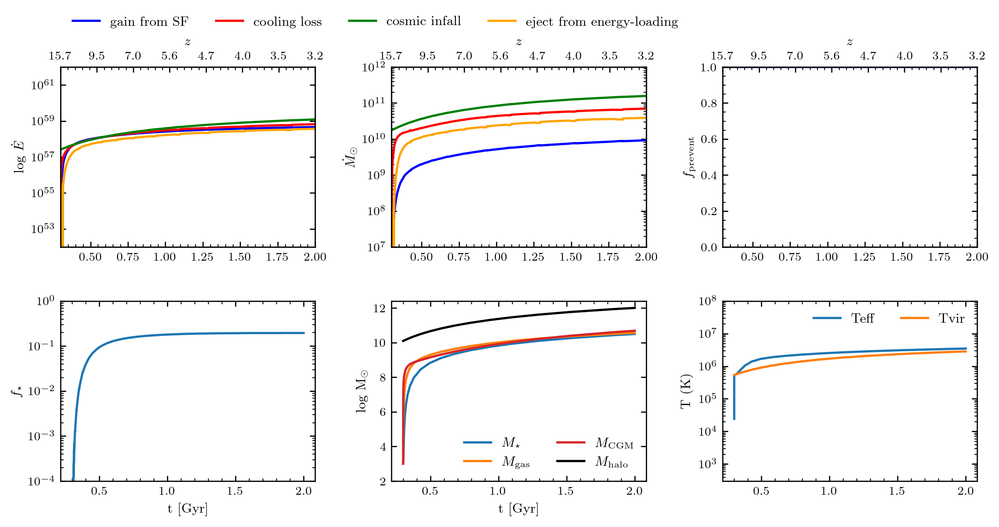

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
y = 0.02  # metallicity enrichment yield (mass in metals produced per solar mass)
fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
C = 0.4

# controls how effective outflowing energy is at preventing inflowing gas
CGM_infall_prevention_constant = 1.0
# ratio of specific energy of ejected gas to CGM gas
CGM_eject_specific_energy_ratio = 1.0
# time, virial temperature, cooling function, depletion time, inflow prevention factor, star formation efficiency
TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list = (
    [],
    [],
    [],
    [],
    [],
    [],
)
#
CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list = ([], [], [], [])
Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list = ([], [], [], [])
Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list = ([], [], [], [])
msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list = ([], [], [], [], [])

time_interval = (0.3, 2.0)
mh1e9t_004_05 = explore_halo(1e12 * u.solMass, 0.3, 0.15, time_interval)
plot_halo_evolution(mh1e9t_004_05)

Running models from z = 11.18 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol


/home/fabg/.pyenv/versions/3.8.10/lib/python3.8/site-packages/astropy/units/quantity.py:673: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


0
M_halo = 1.0027e+12  Msol
M_star = 2.5219e+10  Msol
f_star = 1.5720e-01
M_gas = 4.9921e+10 Msol
M_CGM = 6.1227e+10  Msol
CGM Z = 8.81e-02
dict_keys(['TT_list', 'Tvir_list', 'CB_list_1', 'Eg_dot_list', 'El_dot_list', 'Eacc_dot_list', 'Eej_dot_list', 't', 'mgas_t', 'mstar_t', 'mCGM_t', 'mZM_t', 'mhalo_t', 'Eg_t', 'El_t', 'Eej_t', 'Eacc_t', 'ECGM_t', 'Z_cgm', 'z', 'CGM_cool_list', 'CGM_eject_list', 'CGM_gain_list', 'CGM_infall_list', 'fprevent_list', 'fstar_list'])
[0.4 0.5 0.6 0.7 0.8 0.9 1. ]
[0.4 0.5 0.6 0.7 0.8 0.9 1. ]
[0.4 0.5 0.6 0.7 0.8 0.9 1. ]


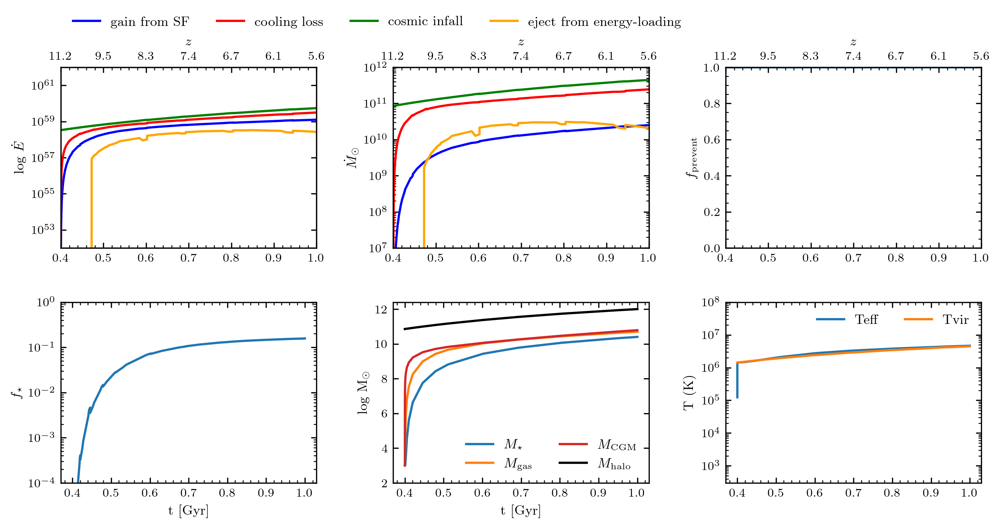

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
y = 0.02  # metallicity enrichment yield (mass in metals produced per solar mass)
fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
C = 0.4

# controls how effective outflowing energy is at preventing inflowing gas
CGM_infall_prevention_constant = 1.0
# ratio of specific energy of ejected gas to CGM gas
CGM_eject_specific_energy_ratio = 1.0
# time, virial temperature, cooling function, depletion time, inflow prevention factor, star formation efficiency
TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list = (
    [],
    [],
    [],
    [],
    [],
    [],
)
#
CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list = ([], [], [], [])
Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list = ([], [], [], [])
Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list = ([], [], [], [])
msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list = ([], [], [], [], [])

time_interval = (0.4, 1.0)
mh1e9t_004_05 = explore_halo(1e12 * u.solMass, 0.3, 0.15, time_interval)
plot_halo_evolution(mh1e9t_004_05)

Running models from z = 11.18 redshift to z = 4.85 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol


/home/fabg/.pyenv/versions/3.8.10/lib/python3.8/site-packages/astropy/units/quantity.py:673: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


0
M_halo = 1.0027e+12  Msol
M_star = 2.7224e+10  Msol
f_star = 1.6970e-01
M_gas = 4.6062e+10 Msol
M_CGM = 5.7845e+10  Msol
CGM Z = 8.98e-02
dict_keys(['TT_list', 'Tvir_list', 'CB_list_1', 'Eg_dot_list', 'El_dot_list', 'Eacc_dot_list', 'Eej_dot_list', 't', 'mgas_t', 'mstar_t', 'mCGM_t', 'mZM_t', 'mhalo_t', 'Eg_t', 'El_t', 'Eej_t', 'Eacc_t', 'ECGM_t', 'Z_cgm', 'z', 'CGM_cool_list', 'CGM_eject_list', 'CGM_gain_list', 'CGM_infall_list', 'fprevent_list', 'fstar_list'])
[0.4 0.6 0.8 1.  1.2]
[0.4 0.6 0.8 1.  1.2]
[0.4 0.6 0.8 1.  1.2]


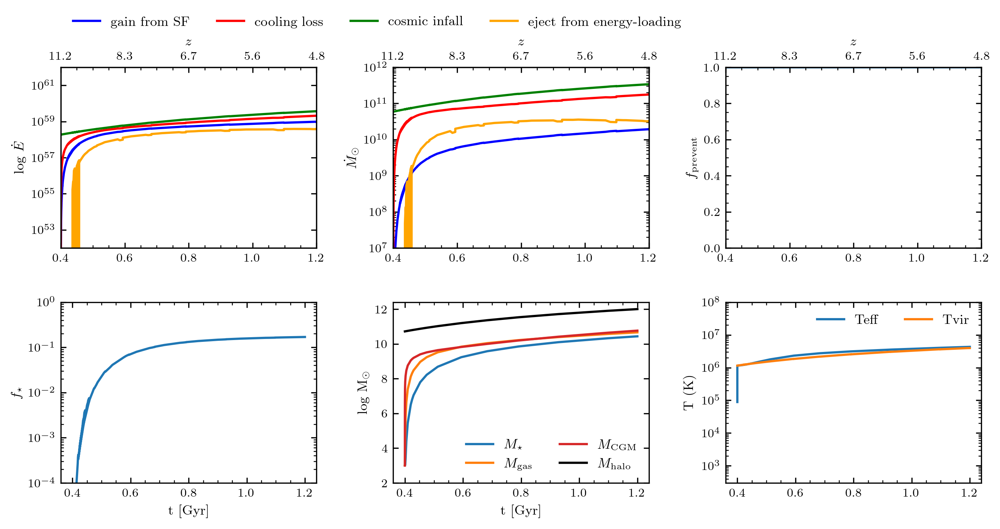

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
y = 0.02  # metallicity enrichment yield (mass in metals produced per solar mass)
fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
C = 0.4

# controls how effective outflowing energy is at preventing inflowing gas
CGM_infall_prevention_constant = 1.0
# ratio of specific energy of ejected gas to CGM gas
CGM_eject_specific_energy_ratio = 1.0
# time, virial temperature, cooling function, depletion time, inflow prevention factor, star formation efficiency
TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list = (
    [],
    [],
    [],
    [],
    [],
    [],
)
#
CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list = ([], [], [], [])
Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list = ([], [], [], [])
Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list = ([], [], [], [])
msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list = ([], [], [], [], [])

time_interval = (0.4, 1.2)
mh1e9t_004_05 = explore_halo(1e12 * u.solMass, 0.3, 0.15, time_interval)
plot_halo_evolution(mh1e9t_004_05)

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        np.max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * np.max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print("Running models from z = {:.2f} to z = {:.2f}".format(zinit, zfinal))
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

        def mass_evolution(self, t, mass):
            """Ode to solve the mass evolution of the galaxy

            Args:
            t (_type_): _description_
            mass (_type_): _description_

            Returns:
            _type_: _description_
            """

            #  t: time (units: Gyr)
            #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
            #  energy [5-9] (units: erg): 5 vector of energy of each component/term

            # get current redshift
            z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

            m_gas = mass[0] * u.solMass
            m_star = mass[1] * u.solMass
            m_cgm = mass[2] * u.solMass  # Total CGM mass
            m_metals = mass[3] * u.solMass
            m_halo = mass[4] * u.solMass  # total halo mass

            e_ism_wind = (
                mass[5] * u.erg
            )  # Energy gained from energy-loaded galactic winds
            e_cgm_cool = (
                mass[6] * u.erg
            )  # Energy loss from gas precipitation onto the Galaxy
            e_cgm_out = (
                mass[7] * u.erg
            )  # Energy loss from mass ejected from the CGM into IGM
            e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
            e_cgm = mass[9] * u.erg  # Total CGM energy

            # now, derive relevant quantities
            t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
            halo_rvir = virial_radius(z, m_halo).to(u.kpc)
            halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
            t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
            rho_crit = LCDM.critical_density(z)
            cgm_metallicity = m_metals / m_cgm
            cgm_metallicity_sol = cgm_metallicity / self.Z_sol

            # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

            # cooling function value at this timestep
            cooling_lambda = self.cooling_fn(
                (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
            ) * (u.erg * u.cm**3 * u.s**-1)

            # compute density normalization for power-law density model from CGM mass
            r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

            ## Another possible definition of inner radius of CGM
            # r1 = 10.0*u.kpc

            # get the central density in units of kpc^-3 ?
            rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

            # estimate energy ejection loss timescale and limitit to dynamical time
            c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
            t_ejection = halo_rvir / c_sound  # ejection time of hot gas
            t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

            # outflow rate assuming that gas flows out at the sound speed
            # eq. 18 from Carr+ 2023
            # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
            dot_e_cgm_out = (
                np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
                / t_ejection
            ).to(u.erg / u.Gyr)

            # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
            dot_e_cgm_cool = energy_loss(
                Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
            ).to(u.erg / u.Gyr)

            # speceific energy of eject gas
            cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
                e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
            )

            # (effective) cooling time of CGM
            tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
            #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
            #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
            tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
            dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

            ##################### moving on to mass evolution
            # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
            # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

            # CGM mass loss due to cooling, eq. 7 from Carr 2023
            dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
            # eq. 12, m_gas is kinda the ism
            dot_m_sfr = m_gas / t_depletion
            # eq 11 ish
            dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
                u.solMass / u.Gyr
            )
            dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

            dot_m_halo = halo_infall(z, m_halo)
            dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

            # CGM eject loss term, eq 10
            dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

            ################## calculate the energies that depend on the mass changes

            # ratio of dot ECGM_in / ECGM_out
            e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
                dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
            ).to(u.dimensionless_unscaled)
            # equation 19 CGM infall prevention factor
            f_prevent = np.min(
                np.max(e_ejection_to_infall_ratio, 0.1), 1.0
            )  # 0.1 < f < 1
            dot_m_cgm_in *= f_prevent

            # energy input from SF
            dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

            # energy due to accretion, eq 16
            dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
                u.erg * u.Gyr**-1
            )

            # CGM feedback gain term, eq 9
            dot_m_ism_wind = dot_m_sfr * self.eta_m

            ##################  total Mass, Energy, and Metallicity derivatives
            dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
            dot_m_metal = (
                self.metal_yield * self.eta_z * dot_m_sfr
                + self.Z_IGM * self.Z_sol * dot_m_cgm_in
                - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
            )
            dot_e_cgm = (
                dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
            )

            # limiter
            if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
                dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

            # fill the values
            self.sim_time_out.append(t)
            self.tvir_out.append(halo_vir_temp)
            self.dot_e_cgm_out_out.append(dot_e_cgm_out)
            self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
            self.dot_e_cgm_in_out.append(dot_e_cgm_in)
            self.dot_e_ism_wind_out.append(dot_e_ism_wind)
            self.dot_m_cgm_out_out.append(dot_m_cgm_out)
            self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
            self.dot_m_cgm_in_out.append(dot_m_cgm_in)
            self.dot_m_ism_wind_out.append(dot_m_ism_wind)

            self.f_prevent_out.append(f_prevent)
            self.f_star_out.append(t_depletion)
            self.t_depletion_out.append(t_depletion)

            derivs = np.array(
                [
                    dot_m_gas.value,
                    dot_m_sfr.value,
                    dot_m_cgm.value,
                    dot_m_metal.value,
                    dot_m_halo.value,
                    dot_e_ism_wind.value,
                    dot_e_cgm_cool.value,
                    dot_e_cgm_out.value,
                    dot_e_cgm_in.value,
                    dot_e_cgm.value,
                ]
            )
            return derivs

        def run_halo(self):
            mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
            rvir = virial_radius(z=zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
            tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

            print(
                "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                    self.time_interval[0], mhalo_t0
                )
            )

            mass_cgm_0 = 1e3
            e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
                u.erg
            )

            masses_initial = np.array(
                [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
            )

            solution = solve_ivp(
                mass_evolution,
                self.time_interval,
                masses_initial,
                method="RK45",
                rtol=1e-6,
                # atol=1e-6,
            )

            adaptive_tsteps = solution.t
            adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
            mgas_t = solution.y[0]
            mstar_t = solution.y[1]
            mcgm_t = solution.y[2]
            mmetals_t = solution.y[3]
            mhalo_t = solution.y[4]

            egy_t = solution.y[5]
            egy_radloss_t = solution.y[6]
            egy_eject_t = solution.y[7]
            egy_accrete_t = solution.y[8]
            egy_cgm_t = solution.y[9]  # total cgm energy

            metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
            metal_cgm_mass_sol = (
                metal_cgm_mass / self.Z_sol
            )  # CGM metallicity ratio in solar units

            # diagnose the solution status
            print(
                "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                    solution.status
                )
            ),
            print("Number of function evaluations: ", solution.nfev)

            # the final values
            print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
            print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
            print(
                "Peak halo scale efficiency = {:.2e}".format(
                    np.max(mstar_t / (mhalo_t * self.fb))
                )
            )
            print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
            print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
            print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

            # fill the ode_results with the results
            self.ode_results["z"] = adaptive_z
            self.ode_results["t"] = adaptive_tsteps
            self.ode_results["m_gas"] = mgas_t
            self.ode_results["m_star"] = mstar_t
            self.ode_results["m_cgm"] = mcgm_t
            self.ode_results["m_metals"] = mmetals_t
            self.ode_results["m_halo"] = mhalo_t
            self.ode_results["egy"] = egy_t
            self.ode_results["egy_radloss"] = egy_radloss_t
            self.ode_results["egy_eject"] = egy_eject_t
            self.ode_results["egy_accrete"] = egy_accrete_t
            self.ode_results["egy_cgm"] = egy_cgm_t
            self.ode_results["metal_cgm_mass"] = metal_cgm_mass
            self.ode_results["metal_cgm_mass"] = metal_cgm_mass_sol

        def get_results(self):
            """
            main results of the ODE
            """
            return self.ode_results

        def get_derived_quantities(self):
            """get either some of the derived quantities or derivatives

            Returns:
                _type_: _description_
            """

            # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
            return {
                "sim_time_out": self.sim_time_out,
                "tvir_out": self.tvir_out,
                "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
                "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
                "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
                "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
                "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
                "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
                "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
                "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
                "f_prevent_out": self.f_prevent_out,
                "f_star_out": self.f_star_out,
                "t_depletion_out": self.t_depletion_out,
            }

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        np.max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * np.max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print("Running models from z = {:.2f} to z = {:.2f}".format(zinit, zfinal))
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

        def mass_evolution(self, t, mass):
            """Ode to solve the mass evolution of the galaxy

            Args:
            t (_type_): _description_
            mass (_type_): _description_

            Returns:
            _type_: _description_
            """

            #  t: time (units: Gyr)
            #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
            #  energy [5-9] (units: erg): 5 vector of energy of each component/term

            # get current redshift
            z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

            m_gas = mass[0] * u.solMass
            m_star = mass[1] * u.solMass
            m_cgm = mass[2] * u.solMass  # Total CGM mass
            m_metals = mass[3] * u.solMass
            m_halo = mass[4] * u.solMass  # total halo mass

            e_ism_wind = (
                mass[5] * u.erg
            )  # Energy gained from energy-loaded galactic winds
            e_cgm_cool = (
                mass[6] * u.erg
            )  # Energy loss from gas precipitation onto the Galaxy
            e_cgm_out = (
                mass[7] * u.erg
            )  # Energy loss from mass ejected from the CGM into IGM
            e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
            e_cgm = mass[9] * u.erg  # Total CGM energy

            # now, derive relevant quantities
            t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
            halo_rvir = virial_radius(z, m_halo).to(u.kpc)
            halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
            t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
            rho_crit = LCDM.critical_density(z)
            cgm_metallicity = m_metals / m_cgm
            cgm_metallicity_sol = cgm_metallicity / self.Z_sol

            # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

            # cooling function value at this timestep
            cooling_lambda = self.cooling_fn(
                (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
            ) * (u.erg * u.cm**3 * u.s**-1)

            # compute density normalization for power-law density model from CGM mass
            r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

            ## Another possible definition of inner radius of CGM
            # r1 = 10.0*u.kpc

            # get the central density in units of kpc^-3 ?
            rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

            # estimate energy ejection loss timescale and limitit to dynamical time
            c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
            t_ejection = halo_rvir / c_sound  # ejection time of hot gas
            t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

            # outflow rate assuming that gas flows out at the sound speed
            # eq. 18 from Carr+ 2023
            # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
            dot_e_cgm_out = (
                np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
                / t_ejection
            ).to(u.erg / u.Gyr)

            # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
            dot_e_cgm_cool = energy_loss(
                Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
            ).to(u.erg / u.Gyr)

            # speceific energy of eject gas
            cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
                e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
            )

            # (effective) cooling time of CGM
            tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
            #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
            #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
            tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
            dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

            ##################### moving on to mass evolution
            # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
            # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

            # CGM mass loss due to cooling, eq. 7 from Carr 2023
            dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
            # eq. 12, m_gas is kinda the ism
            dot_m_sfr = m_gas / t_depletion
            # eq 11 ish
            dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
                u.solMass / u.Gyr
            )
            dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

            dot_m_halo = halo_infall(z, m_halo)
            dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

            # CGM eject loss term, eq 10
            dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

            ################## calculate the energies that depend on the mass changes

            # ratio of dot ECGM_in / ECGM_out
            e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
                dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
            ).to(u.dimensionless_unscaled)
            # equation 19 CGM infall prevention factor
            f_prevent = np.min(
                np.max(e_ejection_to_infall_ratio, 0.1), 1.0
            )  # 0.1 < f < 1
            dot_m_cgm_in *= f_prevent

            # energy input from SF
            dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

            # energy due to accretion, eq 16
            dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
                u.erg * u.Gyr**-1
            )

            # CGM feedback gain term, eq 9
            dot_m_ism_wind = dot_m_sfr * self.eta_m

            ##################  total Mass, Energy, and Metallicity derivatives
            dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
            dot_m_metal = (
                self.metal_yield * self.eta_z * dot_m_sfr
                + self.Z_IGM * self.Z_sol * dot_m_cgm_in
                - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
            )
            dot_e_cgm = (
                dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
            )

            # limiter
            if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
                dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

            # fill the values
            self.sim_time_out.append(t)
            self.tvir_out.append(halo_vir_temp)
            self.dot_e_cgm_out_out.append(dot_e_cgm_out)
            self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
            self.dot_e_cgm_in_out.append(dot_e_cgm_in)
            self.dot_e_ism_wind_out.append(dot_e_ism_wind)
            self.dot_m_cgm_out_out.append(dot_m_cgm_out)
            self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
            self.dot_m_cgm_in_out.append(dot_m_cgm_in)
            self.dot_m_ism_wind_out.append(dot_m_ism_wind)

            self.f_prevent_out.append(f_prevent)
            self.f_star_out.append(t_depletion)
            self.t_depletion_out.append(t_depletion)

            derivs = np.array(
                [
                    dot_m_gas.value,
                    dot_m_sfr.value,
                    dot_m_cgm.value,
                    dot_m_metal.value,
                    dot_m_halo.value,
                    dot_e_ism_wind.value,
                    dot_e_cgm_cool.value,
                    dot_e_cgm_out.value,
                    dot_e_cgm_in.value,
                    dot_e_cgm.value,
                ]
            )
            return derivs

        def run_halo(self):
            mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
            rvir = virial_radius(z=zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
            tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

            print(
                "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                    self.time_interval[0], mhalo_t0
                )
            )

            mass_cgm_0 = 1e3
            e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
                u.erg
            )

            masses_initial = np.array(
                [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
            )

            solution = solve_ivp(
                mass_evolution,
                self.time_interval,
                masses_initial,
                method="RK45",
                rtol=1e-6,
                # atol=1e-6,
            )

            adaptive_tsteps = solution.t
            adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
            mgas_t = solution.y[0]
            mstar_t = solution.y[1]
            mcgm_t = solution.y[2]
            mmetals_t = solution.y[3]
            mhalo_t = solution.y[4]

            egy_t = solution.y[5]
            egy_radloss_t = solution.y[6]
            egy_eject_t = solution.y[7]
            egy_accrete_t = solution.y[8]
            egy_cgm_t = solution.y[9]  # total cgm energy

            metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
            metal_cgm_mass_sol = (
                metal_cgm_mass / self.Z_sol
            )  # CGM metallicity ratio in solar units

            # diagnose the solution status
            print(
                "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                    solution.status
                )
            ),
            print("Number of function evaluations: ", solution.nfev)

            # the final values
            print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
            print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
            print(
                "Peak halo scale efficiency = {:.2e}".format(
                    np.max(mstar_t / (mhalo_t * self.fb))
                )
            )
            print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
            print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
            print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

            # fill the ode_results with the results
            self.ode_results["z"] = adaptive_z
            self.ode_results["t"] = adaptive_tsteps
            self.ode_results["m_gas"] = mgas_t
            self.ode_results["m_star"] = mstar_t
            self.ode_results["m_cgm"] = mcgm_t
            self.ode_results["m_metals"] = mmetals_t
            self.ode_results["m_halo"] = mhalo_t
            self.ode_results["egy"] = egy_t
            self.ode_results["egy_radloss"] = egy_radloss_t
            self.ode_results["egy_eject"] = egy_eject_t
            self.ode_results["egy_accrete"] = egy_accrete_t
            self.ode_results["egy_cgm"] = egy_cgm_t
            self.ode_results["metal_cgm_mass"] = metal_cgm_mass
            self.ode_results["metal_cgm_mass"] = metal_cgm_mass_sol

        def get_results(self):
            """
            main results of the ODE
            """
            return self.ode_results

        def get_derived_quantities(self):
            """get either some of the derived quantities or derivatives

            Returns:
                _type_: _description_
            """

            # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
            return {
                "sim_time_out": self.sim_time_out,
                "tvir_out": self.tvir_out,
                "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
                "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
                "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
                "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
                "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
                "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
                "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
                "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
                "f_prevent_out": self.f_prevent_out,
                "f_star_out": self.f_star_out,
                "t_depletion_out": self.t_depletion_out,
            }


# run a test model
mhalo_z0 = 1e12
t_span = [0.1, 1.0]  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 29.69 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12  Msol


AttributeError: 'CGM_regulator' object has no attribute 'run_halo'

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        np.max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * np.max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print("Running models from z = {:.2f} to z = {:.2f}".format(zinit, zfinal))
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

        def mass_evolution(self, t, mass):
            """Ode to solve the mass evolution of the galaxy

            Args:
            t (_type_): _description_
            mass (_type_): _description_

            Returns:
            _type_: _description_
            """

            #  t: time (units: Gyr)
            #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
            #  energy [5-9] (units: erg): 5 vector of energy of each component/term

            # get current redshift
            z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

            m_gas = mass[0] * u.solMass
            m_star = mass[1] * u.solMass
            m_cgm = mass[2] * u.solMass  # Total CGM mass
            m_metals = mass[3] * u.solMass
            m_halo = mass[4] * u.solMass  # total halo mass

            e_ism_wind = (
                mass[5] * u.erg
            )  # Energy gained from energy-loaded galactic winds
            e_cgm_cool = (
                mass[6] * u.erg
            )  # Energy loss from gas precipitation onto the Galaxy
            e_cgm_out = (
                mass[7] * u.erg
            )  # Energy loss from mass ejected from the CGM into IGM
            e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
            e_cgm = mass[9] * u.erg  # Total CGM energy

            # now, derive relevant quantities
            t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
            halo_rvir = virial_radius(z, m_halo).to(u.kpc)
            halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
            t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
            rho_crit = LCDM.critical_density(z)
            cgm_metallicity = m_metals / m_cgm
            cgm_metallicity_sol = cgm_metallicity / self.Z_sol

            # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

            # cooling function value at this timestep
            cooling_lambda = self.cooling_fn(
                (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
            ) * (u.erg * u.cm**3 * u.s**-1)

            # compute density normalization for power-law density model from CGM mass
            r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

            ## Another possible definition of inner radius of CGM
            # r1 = 10.0*u.kpc

            # get the central density in units of kpc^-3 ?
            rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

            # estimate energy ejection loss timescale and limitit to dynamical time
            c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
            t_ejection = halo_rvir / c_sound  # ejection time of hot gas
            t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

            # outflow rate assuming that gas flows out at the sound speed
            # eq. 18 from Carr+ 2023
            # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
            dot_e_cgm_out = (
                np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
                / t_ejection
            ).to(u.erg / u.Gyr)

            # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
            dot_e_cgm_cool = energy_loss(
                Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
            ).to(u.erg / u.Gyr)

            # speceific energy of eject gas
            cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
                e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
            )

            # (effective) cooling time of CGM
            tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
            #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
            #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
            tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
            dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

            ##################### moving on to mass evolution
            # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
            # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

            # CGM mass loss due to cooling, eq. 7 from Carr 2023
            dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
            # eq. 12, m_gas is kinda the ism
            dot_m_sfr = m_gas / t_depletion
            # eq 11 ish
            dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
                u.solMass / u.Gyr
            )
            dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

            dot_m_halo = halo_infall(z, m_halo)
            dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

            # CGM eject loss term, eq 10
            dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

            ################## calculate the energies that depend on the mass changes

            # ratio of dot ECGM_in / ECGM_out
            e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
                dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
            ).to(u.dimensionless_unscaled)
            # equation 19 CGM infall prevention factor
            f_prevent = np.min(
                np.max(e_ejection_to_infall_ratio, 0.1), 1.0
            )  # 0.1 < f < 1
            dot_m_cgm_in *= f_prevent

            # energy input from SF
            dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

            # energy due to accretion, eq 16
            dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
                u.erg * u.Gyr**-1
            )

            # CGM feedback gain term, eq 9
            dot_m_ism_wind = dot_m_sfr * self.eta_m

            ##################  total Mass, Energy, and Metallicity derivatives
            dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
            dot_m_metal = (
                self.metal_yield * self.eta_z * dot_m_sfr
                + self.Z_IGM * self.Z_sol * dot_m_cgm_in
                - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
            )
            dot_e_cgm = (
                dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
            )

            # limiter
            if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
                dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

            # fill the values
            self.sim_time_out.append(t)
            self.tvir_out.append(halo_vir_temp)
            self.dot_e_cgm_out_out.append(dot_e_cgm_out)
            self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
            self.dot_e_cgm_in_out.append(dot_e_cgm_in)
            self.dot_e_ism_wind_out.append(dot_e_ism_wind)
            self.dot_m_cgm_out_out.append(dot_m_cgm_out)
            self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
            self.dot_m_cgm_in_out.append(dot_m_cgm_in)
            self.dot_m_ism_wind_out.append(dot_m_ism_wind)

            self.f_prevent_out.append(f_prevent)
            self.f_star_out.append(t_depletion)
            self.t_depletion_out.append(t_depletion)

            derivs = np.array(
                [
                    dot_m_gas.value,
                    dot_m_sfr.value,
                    dot_m_cgm.value,
                    dot_m_metal.value,
                    dot_m_halo.value,
                    dot_e_ism_wind.value,
                    dot_e_cgm_cool.value,
                    dot_e_cgm_out.value,
                    dot_e_cgm_in.value,
                    dot_e_cgm.value,
                ]
            )
            return derivs

        def run_halo(self):
            mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
            rvir = virial_radius(z=zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
            tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

            print(
                "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                    self.time_interval[0], mhalo_t0
                )
            )

            mass_cgm_0 = 1e3
            e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
                u.erg
            )

            masses_initial = np.array(
                [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
            )

            solution = solve_ivp(
                mass_evolution,
                self.time_interval,
                masses_initial,
                method="RK45",
                rtol=1e-6,
                # atol=1e-6,
            )

            adaptive_tsteps = solution.t
            adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
            mgas_t = solution.y[0]
            mstar_t = solution.y[1]
            mcgm_t = solution.y[2]
            mmetals_t = solution.y[3]
            mhalo_t = solution.y[4]

            egy_t = solution.y[5]
            egy_radloss_t = solution.y[6]
            egy_eject_t = solution.y[7]
            egy_accrete_t = solution.y[8]
            egy_cgm_t = solution.y[9]  # total cgm energy

            metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
            metal_cgm_mass_sol = (
                metal_cgm_mass / self.Z_sol
            )  # CGM metallicity ratio in solar units

            # diagnose the solution status
            print(
                "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                    solution.status
                )
            ),
            print("Number of function evaluations: ", solution.nfev)

            # the final values
            print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
            print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
            print(
                "Peak halo scale efficiency = {:.2e}".format(
                    np.max(mstar_t / (mhalo_t * self.fb))
                )
            )
            print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
            print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
            print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

            # fill the ode_results with the results
            self.ode_results["z"] = adaptive_z
            self.ode_results["t"] = adaptive_tsteps
            self.ode_results["m_gas"] = mgas_t
            self.ode_results["m_star"] = mstar_t
            self.ode_results["m_cgm"] = mcgm_t
            self.ode_results["m_metals"] = mmetals_t
            self.ode_results["m_halo"] = mhalo_t
            self.ode_results["egy"] = egy_t
            self.ode_results["egy_radloss"] = egy_radloss_t
            self.ode_results["egy_eject"] = egy_eject_t
            self.ode_results["egy_accrete"] = egy_accrete_t
            self.ode_results["egy_cgm"] = egy_cgm_t
            self.ode_results["metal_cgm_mass"] = metal_cgm_mass
            self.ode_results["metal_cgm_mass"] = metal_cgm_mass_sol

        def get_results(self):
            """
            main results of the ODE
            """
            return self.ode_results

        def get_derived_quantities(self):
            """get either some of the derived quantities or derivatives

            Returns:
                _type_: _description_
            """

            # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
            return {
                "sim_time_out": self.sim_time_out,
                "tvir_out": self.tvir_out,
                "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
                "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
                "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
                "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
                "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
                "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
                "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
                "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
                "f_prevent_out": self.f_prevent_out,
                "f_star_out": self.f_star_out,
                "t_depletion_out": self.t_depletion_out,
            }


# run a test model
mhalo_z0 = 1e12
t_span = [0.1, 1.0]  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 29.69 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12  Msol


AttributeError: 'CGM_regulator' object has no attribute 'run_halo'

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        np.max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * np.max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print("Running models from z = {:.2f} to z = {:.2f}".format(zinit, zfinal))
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            mass_evolution,
            self.time_interval,
            masses_initial,
            method="RK45",
            rtol=1e-6,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


# run a test model
mhalo_z0 = 1e12
t_span = [0.1, 1.0]  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 29.69 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12  Msol


AttributeError: 'float' object has no attribute 'value'

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        np.max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * np.max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print("Running models from z = {:.2f} to z = {:.2f}".format(zinit, zfinal))
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            mass_evolution,
            self.time_interval,
            masses_initial,
            method="RK45",
            rtol=1e-6,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = [0.1, 1.0]  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 29.69 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol


/home/fabg/.pyenv/versions/3.8.10/lib/python3.8/site-packages/astropy/units/quantity.py:673: RuntimeWarning: invalid value encountered in power
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


NameError: name 'zfinal' is not defined

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        np.max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * np.max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print("Running models from z = {:.2f} to z = {:.2f}".format(zinit, zfinal))
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            mass_evolution,
            self.time_interval,
            masses_initial,
            method="RK45",
            rtol=1e-6,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = [0.1, 1.0]  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()

reading file ['./tables/Lambda_tab_redshifts.npz']


NameError: name 'zinit' is not defined

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        np.max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * np.max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            mass_evolution,
            self.time_interval,
            masses_initial,
            method="RK45",
            rtol=1e-6,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = [0.1, 1.0]  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 29.69 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.10) = 1.04e+09 Msol


TypeError: only integer dimensionless scalar quantities can be converted to a Python index

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        np.max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * np.max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            mass_evolution,
            self.time_interval,
            masses_initial,
            method="RK45",
            rtol=1e-6,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.1, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 29.69 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.10) = 1.04e+09 Msol


TypeError: only integer dimensionless scalar quantities can be converted to a Python index

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)
    print(t_ejection)
    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        np.max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * np.max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            mass_evolution,
            self.time_interval,
            masses_initial,
            method="RK45",
            rtol=1e-6,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.1, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 29.69 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.10) = 1.04e+09 Msol


TypeError: only integer dimensionless scalar quantities can be converted to a Python index

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    print(t_ejection)
    t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        np.max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * np.max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            mass_evolution,
            self.time_interval,
            masses_initial,
            method="RK45",
            rtol=1e-6,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.1, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 29.69 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.10) = 1.04e+09 Msol
2.267326801848975e-23 kpc solMass(1/2) / erg(1/2)


TypeError: only integer dimensionless scalar quantities can be converted to a Python index

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    print(t_ejection,t_dynamical))
    t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)
  
    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        np.max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * np.max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print("Running models from z = {:.2f} to z = {:.2f}".format(self.zinit, self.zfinal))
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = (
            mass[5] * u.erg
        )  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(
            np.max(e_ejection_to_infall_ratio, 0.1), 1.0
        )  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            mass_evolution,
            self.time_interval,
            masses_initial,
            method="RK45",
            rtol=1e-6,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """
        
        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }

# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.1, 1.0) # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()

IndentationError: unindent does not match any outer indentation level (<tokenize>, line 448)

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    print(t_ejection, t_dynamical)
    t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        np.max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * np.max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            mass_evolution,
            self.time_interval,
            masses_initial,
            method="RK45",
            rtol=1e-6,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.1, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 29.69 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.10) = 1.04e+09 Msol
2.267326801848975e-23 kpc solMass(1/2) / erg(1/2) 0.011538151003563537 Gyr


TypeError: only integer dimensionless scalar quantities can be converted to a Python index

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    print(t_ejection, t_dynamical)
    t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)
    print(t_ejection)
    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        np.max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * np.max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            mass_evolution,
            self.time_interval,
            masses_initial,
            method="RK45",
            rtol=1e-6,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.1, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 29.69 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.10) = 1.04e+09 Msol
2.267326801848975e-23 kpc solMass(1/2) / erg(1/2) 0.011538151003563537 Gyr


TypeError: only integer dimensionless scalar quantities can be converted to a Python index

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    print(np.max(t_ejection, 0.1 * t_dynamical))

    t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)
    print(t_ejection)
    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        np.max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * np.max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            mass_evolution,
            self.time_interval,
            masses_initial,
            method="RK45",
            rtol=1e-6,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.1, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 29.69 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.10) = 1.04e+09 Msol


TypeError: only integer dimensionless scalar quantities can be converted to a Python index

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
    # print(t_ejection)
    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            mass_evolution,
            self.time_interval,
            masses_initial,
            method="RK45",
            rtol=1e-6,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.1, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 29.69 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.10) = 1.04e+09 Msol


TypeError: 'float' object cannot be interpreted as an integer

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
    # print(t_ejection)
    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            mass_evolution,
            self.time_interval,
            masses_initial,
            method="RK45",
            rtol=1e-6,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.1, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 29.69 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.10) = 1.04e+09 Msol
Solution status: -1 (0: succes, -1: Integration step failed, 1: A termination event occurred)
Number of function evaluations:  596
Final halo mass = 1.10e+09 Msol
Final stellar mass = 8.62e+03 Msol
Peak halo scale efficiency = 4.89e-05
Final CGM mass = 9.28e+06 Msol
Final CGM metallicity = 1.04e-02
Final CGM energy = 5.55e+53 erg


In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
    # print(t_ejection)
    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            mass_evolution,
            self.time_interval,
            masses_initial,
            method="RK45",
            rtol=1e-6,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]

    adaptive_z = results["z"]
    t = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.1, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 29.69 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.10) = 1.04e+09 Msol
Solution status: -1 (0: succes, -1: Integration step failed, 1: A termination event occurred)
Number of function evaluations:  596
Final halo mass = 1.10e+09 Msol
Final stellar mass = 8.62e+03 Msol
Peak halo scale efficiency = 4.89e-05
Final CGM mass = 9.28e+06 Msol
Final CGM metallicity = 1.04e-02
Final CGM energy = 5.55e+53 erg


KeyError: 'metal_cgm_mass_sol'

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
    # print(t_ejection)
    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            mass_evolution,
            self.time_interval,
            masses_initial,
            method="RK45",
            rtol=1e-6,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]

    adaptive_z = results["z"]
    t = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.1, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 29.69 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.10) = 1.04e+09 Msol
Solution status: -1 (0: succes, -1: Integration step failed, 1: A termination event occurred)
Number of function evaluations:  596
Final halo mass = 1.10e+09 Msol
Final stellar mass = 8.62e+03 Msol
Peak halo scale efficiency = 4.89e-05
Final CGM mass = 9.28e+06 Msol
Final CGM metallicity = 1.04e-02
Final CGM energy = 5.55e+53 erg


ValueError: x and y must have same first dimension, but have shapes (59,) and (0,)

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
    # print(t_ejection)
    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            mass_evolution,
            self.time_interval,
            masses_initial,
            method="RK45",
            rtol=1e-6,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.1, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 29.69 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.10) = 1.04e+09 Msol
Solution status: -1 (0: succes, -1: Integration step failed, 1: A termination event occurred)
Number of function evaluations:  596
Final halo mass = 1.10e+09 Msol
Final stellar mass = 8.62e+03 Msol
Peak halo scale efficiency = 4.89e-05
Final CGM mass = 9.28e+06 Msol
Final CGM metallicity = 1.04e-02
Final CGM energy = 5.55e+53 erg


NameError: name 'dot_m_cgm_in' is not defined

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
    # print(t_ejection)
    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            mass_evolution,
            self.time_interval,
            masses_initial,
            method="RK45",
            rtol=1e-6,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.1, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 29.69 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.10) = 1.04e+09 Msol
Solution status: -1 (0: succes, -1: Integration step failed, 1: A termination event occurred)
Number of function evaluations:  596
Final halo mass = 1.10e+09 Msol
Final stellar mass = 8.62e+03 Msol
Peak halo scale efficiency = 4.89e-05
Final CGM mass = 9.28e+06 Msol
Final CGM metallicity = 1.04e-02
Final CGM energy = 5.55e+53 erg


IndexError: list index out of range

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
    # print(t_ejection)
    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            mass_evolution,
            self.time_interval,
            masses_initial,
            method="RK45",
            rtol=1e-6,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]
    print(t)

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.1, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 29.69 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.10) = 1.04e+09 Msol
Solution status: -1 (0: succes, -1: Integration step failed, 1: A termination event occurred)
Number of function evaluations:  596
Final halo mass = 1.10e+09 Msol
Final stellar mass = 8.62e+03 Msol
Peak halo scale efficiency = 4.89e-05
Final CGM mass = 9.28e+06 Msol
Final CGM metallicity = 1.04e-02
Final CGM energy = 5.55e+53 erg
[]


IndexError: list index out of range

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
    # print(t_ejection)
    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            mass_evolution,
            self.time_interval,
            masses_initial,
            method="RK45",
            rtol=1e-6,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]
    print(t)

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.1, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
# plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 29.69 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.10) = 1.04e+09 Msol
Solution status: -1 (0: succes, -1: Integration step failed, 1: A termination event occurred)
Number of function evaluations:  596
Final halo mass = 1.10e+09 Msol
Final stellar mass = 8.62e+03 Msol
Peak halo scale efficiency = 4.89e-05
Final CGM mass = 9.28e+06 Msol
Final CGM metallicity = 1.04e-02
Final CGM energy = 5.55e+53 erg


In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
    # print(t_ejection)
    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            mass_evolution,
            self.time_interval,
            masses_initial,
            method="RK45",
            rtol=1e-6,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]
    print(t)

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.1, 2.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
# plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 29.69 redshift to z = 3.15 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.10) = 5.96e+08 Msol
Solution status: -1 (0: succes, -1: Integration step failed, 1: A termination event occurred)
Number of function evaluations:  692
Final halo mass = 6.16e+08 Msol
Final stellar mass = 1.93e+03 Msol
Peak halo scale efficiency = 1.96e-05
Final CGM mass = 3.02e+06 Msol
Final CGM metallicity = 1.04e-02
Final CGM energy = 1.23e+53 erg


In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
    # print(t_ejection)
    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            mass_evolution,
            self.time_interval,
            masses_initial,
            method="RK45",
            rtol=1e-6,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]
    print(t)

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.3, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
# plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.30) = 3.05e+10 Msol
Solution status: -1 (0: succes, -1: Integration step failed, 1: A termination event occurred)
Number of function evaluations:  692
Final halo mass = 4.43e+10 Msol
Final stellar mass = 4.45e+07 Msol
Peak halo scale efficiency = 6.27e-03
Final CGM mass = 1.54e+09 Msol
Final CGM metallicity = 2.04e-02
Final CGM energy = 4.84e+56 erg


In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
    # print(t_ejection)
    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            mass_evolution,
            self.time_interval,
            masses_initial,
            # method="RK45",
            rtol=1e-6,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]
    print(t)

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.3, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
# plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.30) = 3.05e+10 Msol
Solution status: -1 (0: succes, -1: Integration step failed, 1: A termination event occurred)
Number of function evaluations:  692
Final halo mass = 4.43e+10 Msol
Final stellar mass = 4.45e+07 Msol
Peak halo scale efficiency = 6.27e-03
Final CGM mass = 1.54e+09 Msol
Final CGM metallicity = 2.04e-02
Final CGM energy = 4.84e+56 erg


In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
    # print(t_ejection)
    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            mass_evolution,
            self.time_interval,
            masses_initial,
            # method="RK45",
            rtol=1e-3,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]
    print(t)

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.3, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
# plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.30) = 3.05e+10 Msol
Solution status: 0 (0: succes, -1: Integration step failed, 1: A termination event occurred)
Number of function evaluations:  170
Final halo mass = 1.00e+12 Msol
Final stellar mass = 3.08e+10 Msol
Peak halo scale efficiency = 1.92e-01
Final CGM mass = 6.58e+10 Msol
Final CGM metallicity = 9.31e-02
Final CGM energy = 7.59e+58 erg


In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
    # print(t_ejection)
    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            mass_evolution,
            self.time_interval,
            masses_initial,
            # method="RK45",
            rtol=1e-3,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]
    print(t)

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.3, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.30) = 3.05e+10 Msol
Solution status: 0 (0: succes, -1: Integration step failed, 1: A termination event occurred)
Number of function evaluations:  170
Final halo mass = 1.00e+12 Msol
Final stellar mass = 3.08e+10 Msol
Peak halo scale efficiency = 1.92e-01
Final CGM mass = 6.58e+10 Msol
Final CGM metallicity = 9.31e-02
Final CGM energy = 7.59e+58 erg
[]


IndexError: list index out of range

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
    # print(t_ejection)
    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            mass_evolution,
            self.time_interval,
            masses_initial,
            # method="RK45",
            rtol=1e-3,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]
    print(tvir)

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.3, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.30) = 3.05e+10 Msol
Solution status: 0 (0: succes, -1: Integration step failed, 1: A termination event occurred)
Number of function evaluations:  170
Final halo mass = 1.00e+12 Msol
Final stellar mass = 3.08e+10 Msol
Peak halo scale efficiency = 1.92e-01
Final CGM mass = 6.58e+10 Msol
Final CGM metallicity = 9.31e-02
Final CGM energy = 7.59e+58 erg
[]


IndexError: list index out of range

In [ ]:
results

{'z': <Quantity [13.75305204, 13.75305204, 13.75305204, 13.75305204, 13.75305204,
            13.75305204, 13.75305204, 13.75305202, 13.75305184, 13.75304998,
            13.75303189, 13.75284984, 13.75102986, 13.74206847, 13.72676948,
            13.6975363 , 13.64130157, 13.53135837, 13.28500665, 12.82721923,
            12.22261188, 11.66806818, 10.61632205,  9.68060013,  8.74546949,
             7.84753973,  6.99898622,  6.20077464,  5.60604744] redshift>,
 't': array([0.3       , 0.3       , 0.3       , 0.3       , 0.3       ,
        0.3       , 0.3       , 0.3       , 0.30000001, 0.30000006,
        0.30000062, 0.30000617, 0.30006168, 0.30033525, 0.30080327,
        0.30170094, 0.30344035, 0.30688969, 0.31486041, 0.33062106,
        0.35354748, 0.37700579, 0.42932482, 0.48692788, 0.55861192,
        0.64568293, 0.75095651, 0.87897497, 1.        ]),
 'm_gas': array([1.00000000e+03, 1.00000000e+03, 1.00000000e+03, 1.00000000e+03,
        1.00000000e+03, 1.00000000e+03, 9.99999999e

In [ ]:
derived

{'sim_time_out': [],
 'tvir_out': [],
 'dot_e_cgm_out_out': [],
 'dot_e_cgm_cool_out': [],
 'dot_e_cgm_in_out': [],
 'dot_e_ism_wind_out': [],
 'dot_m_cgm_out_out': [],
 'dot_m_cgm_cool_out': [],
 'dot_m_cgm_in_out': [],
 'dot_m_ism_wind_out': [],
 'f_prevent_out': [],
 'f_star_out': [],
 't_depletion_out': []}

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
    # print(t_ejection)
    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            mass_evolution,
            self.time_interval,
            masses_initial,
            # method="RK45",
            rtol=1e-3,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.3, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = run.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.30) = 3.05e+10 Msol
Solution status: 0 (0: succes, -1: Integration step failed, 1: A termination event occurred)
Number of function evaluations:  170
Final halo mass = 1.00e+12 Msol
Final stellar mass = 3.08e+10 Msol
Peak halo scale efficiency = 1.92e-01
Final CGM mass = 6.58e+10 Msol
Final CGM metallicity = 9.31e-02
Final CGM energy = 7.59e+58 erg


AttributeError: 'NoneType' object has no attribute 'get_results'

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
    # print(t_ejection)
    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)
        print(self.t_depletion_out)
        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            mass_evolution,
            self.time_interval,
            masses_initial,
            # method="RK45",
            rtol=1e-3,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.3, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.30) = 3.05e+10 Msol
Solution status: 0 (0: succes, -1: Integration step failed, 1: A termination event occurred)
Number of function evaluations:  170
Final halo mass = 1.00e+12 Msol
Final stellar mass = 3.08e+10 Msol
Peak halo scale efficiency = 1.92e-01
Final CGM mass = 6.58e+10 Msol
Final CGM metallicity = 9.31e-02
Final CGM energy = 7.59e+58 erg


IndexError: list index out of range

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    # get current redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

    m_gas = mass[0] * u.solMass
    m_star = mass[1] * u.solMass
    m_cgm = mass[2] * u.solMass  # Total CGM mass
    m_metals = mass[3] * u.solMass
    m_halo = mass[4] * u.solMass  # total halo mass

    e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
    e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
    e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
    e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
    e_cgm = mass[9] * u.erg  # Total CGM energy

    # now, derive relevant quantities
    t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
    halo_rvir = virial_radius(z, m_halo).to(u.kpc)
    halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
    t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
    rho_crit = LCDM.critical_density(z)
    cgm_metallicity = m_metals / m_cgm
    cgm_metallicity_sol = cgm_metallicity / Z_sol

    # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

    # cooling function value at this timestep
    cooling_lambda = cooling_fn(
        (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
    ) * (u.erg * u.cm**3 * u.s**-1)

    # compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

    ## Another possible definition of inner radius of CGM
    # r1 = 10.0*u.kpc

    # get the central density in units of kpc^-3 ?
    rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

    # estimate energy ejection loss timescale and limitit to dynamical time
    c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
    t_ejection = halo_rvir / c_sound  # ejection time of hot gas
    t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
    # print(t_ejection)
    # outflow rate assuming that gas flows out at the sound speed
    # eq. 18 from Carr+ 2023
    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    dot_e_cgm_out = (
        max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
    ).to(u.erg / u.Gyr)

    # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
    dot_e_cgm_cool = energy_loss(
        Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
    ).to(u.erg / u.Gyr)

    # speceific energy of eject gas
    cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
        e_cgm / m_cgm, kb * halo_vir_temp / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
    tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
    dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

    ##################### moving on to mass evolution
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

    # CGM mass loss due to cooling, eq. 7 from Carr 2023
    dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
    # eq. 12, m_gas is kinda the ism
    dot_m_sfr = m_gas / t_depletion
    # eq 11 ish
    dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
    dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

    dot_m_halo = halo_infall(z, m_halo)
    dot_m_cgm_in = fb * dot_m_halo  # eq. 6

    # CGM eject loss term, eq 10
    dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

    ################## calculate the energies that depend on the mass changes

    # ratio of dot ECGM_in / ECGM_out
    e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
        dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
    ).to(u.dimensionless_unscaled)
    # equation 19 CGM infall prevention factor
    f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
    dot_m_cgm_in *= f_prevent

    # energy input from SF
    dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

    # energy due to accretion, eq 16
    dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

    # CGM feedback gain term, eq 9
    dot_m_ism_wind = dot_m_sfr * eta_m

    ##################  total Mass, Energy, and Metallicity derivatives
    dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
    dot_m_metal = (
        metal_yield * eta_z * dot_m_sfr
        + Z_IGM * Z_sol * dot_m_cgm_in
        - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
    )
    dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

    # limiter
    if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
        dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

    # t_dep_list.append(t_dep.value)

    derivs = np.array(
        [
            dot_m_gas.value,
            dot_m_sfr.value,
            dot_m_cgm.value,
            dot_m_metal.value,
            dot_m_halo.value,
            dot_e_ism_wind.value,
            dot_e_cgm_cool.value,
            dot_e_cgm_out.value,
            dot_e_cgm_in.value,
            dot_e_cgm.value,
        ]
    )
    return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = np.min(np.max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            self.mass_evolution,
            self.time_interval,
            masses_initial,
            # method="RK45",
            rtol=1e-3,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.3, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.30) = 3.05e+10 Msol


TypeError: only integer dimensionless scalar quantities can be converted to a Python index

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


# def mass_evolution(t, mass):
#     """Ode to solve the mass evolution of the galaxy

#     Args:
#         t (_type_): _description_
#         mass (_type_): _description_

#     Returns:
#         _type_: _description_
#     """

#     #  t: time (units: Gyr)
#     #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
#     #  energy [5-9] (units: erg): 5 vector of energy of each component/term

#     # get current redshift
#     z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

#     m_gas = mass[0] * u.solMass
#     m_star = mass[1] * u.solMass
#     m_cgm = mass[2] * u.solMass  # Total CGM mass
#     m_metals = mass[3] * u.solMass
#     m_halo = mass[4] * u.solMass  # total halo mass

#     e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
#     e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
#     e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
#     e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
#     e_cgm = mass[9] * u.erg  # Total CGM energy

#     # now, derive relevant quantities
#     t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
#     halo_rvir = virial_radius(z, m_halo).to(u.kpc)
#     halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
#     t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
#     rho_crit = LCDM.critical_density(z)
#     cgm_metallicity = m_metals / m_cgm
#     cgm_metallicity_sol = cgm_metallicity / Z_sol

#     # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

#     # cooling function value at this timestep
#     cooling_lambda = cooling_fn(
#         (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
#     ) * (u.erg * u.cm**3 * u.s**-1)

#     # compute density normalization for power-law density model from CGM mass
#     r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

#     ## Another possible definition of inner radius of CGM
#     # r1 = 10.0*u.kpc

#     # get the central density in units of kpc^-3 ?
#     rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

#     # estimate energy ejection loss timescale and limitit to dynamical time
#     c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
#     t_ejection = halo_rvir / c_sound  # ejection time of hot gas
#     t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
#     # print(t_ejection)
#     # outflow rate assuming that gas flows out at the sound speed
#     # eq. 18 from Carr+ 2023
#     # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
#     dot_e_cgm_out = (
#         max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
#     ).to(u.erg / u.Gyr)

#     # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
#     dot_e_cgm_cool = energy_loss(
#         Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
#     ).to(u.erg / u.Gyr)

#     # speceific energy of eject gas
#     cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
#         e_cgm / m_cgm, kb * halo_vir_temp / mu
#     )

#     # (effective) cooling time of CGM
#     tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
#     #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
#     #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
#     tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
#     dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

#     ##################### moving on to mass evolution
#     # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
#     # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

#     # CGM mass loss due to cooling, eq. 7 from Carr 2023
#     dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
#     # eq. 12, m_gas is kinda the ism
#     dot_m_sfr = m_gas / t_depletion
#     # eq 11 ish
#     dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
#     dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

#     dot_m_halo = halo_infall(z, m_halo)
#     dot_m_cgm_in = fb * dot_m_halo  # eq. 6

#     # CGM eject loss term, eq 10
#     dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

#     ################## calculate the energies that depend on the mass changes

#     # ratio of dot ECGM_in / ECGM_out
#     e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
#         dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
#     ).to(u.dimensionless_unscaled)
#     # equation 19 CGM infall prevention factor
#     f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
#     dot_m_cgm_in *= f_prevent

#     # energy input from SF
#     dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

#     # energy due to accretion, eq 16
#     dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

#     # CGM feedback gain term, eq 9
#     dot_m_ism_wind = dot_m_sfr * eta_m

#     ##################  total Mass, Energy, and Metallicity derivatives
#     dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
#     dot_m_metal = (
#         metal_yield * eta_z * dot_m_sfr
#         + Z_IGM * Z_sol * dot_m_cgm_in
#         - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
#     )
#     dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

#     # limiter
#     if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
#         dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

#     # t_dep_list.append(t_dep.value)

#     derivs = np.array(
#         [
#             dot_m_gas.value,
#             dot_m_sfr.value,
#             dot_m_cgm.value,
#             dot_m_metal.value,
#             dot_m_halo.value,
#             dot_e_ism_wind.value,
#             dot_e_cgm_cool.value,
#             dot_e_cgm_out.value,
#             dot_e_cgm_in.value,
#             dot_e_cgm.value,
#         ]
#     )
#     return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = np.min(np.max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            np.max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * np.max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            self.mass_evolution,
            self.time_interval,
            masses_initial,
            # method="RK45",
            rtol=1e-3,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.3, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.30) = 3.05e+10 Msol


TypeError: only integer dimensionless scalar quantities can be converted to a Python index

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


# def mass_evolution(t, mass):
#     """Ode to solve the mass evolution of the galaxy

#     Args:
#         t (_type_): _description_
#         mass (_type_): _description_

#     Returns:
#         _type_: _description_
#     """

#     #  t: time (units: Gyr)
#     #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
#     #  energy [5-9] (units: erg): 5 vector of energy of each component/term

#     # get current redshift
#     z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

#     m_gas = mass[0] * u.solMass
#     m_star = mass[1] * u.solMass
#     m_cgm = mass[2] * u.solMass  # Total CGM mass
#     m_metals = mass[3] * u.solMass
#     m_halo = mass[4] * u.solMass  # total halo mass

#     e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
#     e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
#     e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
#     e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
#     e_cgm = mass[9] * u.erg  # Total CGM energy

#     # now, derive relevant quantities
#     t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
#     halo_rvir = virial_radius(z, m_halo).to(u.kpc)
#     halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
#     t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
#     rho_crit = LCDM.critical_density(z)
#     cgm_metallicity = m_metals / m_cgm
#     cgm_metallicity_sol = cgm_metallicity / Z_sol

#     # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

#     # cooling function value at this timestep
#     cooling_lambda = cooling_fn(
#         (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
#     ) * (u.erg * u.cm**3 * u.s**-1)

#     # compute density normalization for power-law density model from CGM mass
#     r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

#     ## Another possible definition of inner radius of CGM
#     # r1 = 10.0*u.kpc

#     # get the central density in units of kpc^-3 ?
#     rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

#     # estimate energy ejection loss timescale and limitit to dynamical time
#     c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
#     t_ejection = halo_rvir / c_sound  # ejection time of hot gas
#     t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
#     # print(t_ejection)
#     # outflow rate assuming that gas flows out at the sound speed
#     # eq. 18 from Carr+ 2023
#     # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
#     dot_e_cgm_out = (
#         max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
#     ).to(u.erg / u.Gyr)

#     # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
#     dot_e_cgm_cool = energy_loss(
#         Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
#     ).to(u.erg / u.Gyr)

#     # speceific energy of eject gas
#     cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
#         e_cgm / m_cgm, kb * halo_vir_temp / mu
#     )

#     # (effective) cooling time of CGM
#     tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
#     #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
#     #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
#     tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
#     dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

#     ##################### moving on to mass evolution
#     # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
#     # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

#     # CGM mass loss due to cooling, eq. 7 from Carr 2023
#     dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
#     # eq. 12, m_gas is kinda the ism
#     dot_m_sfr = m_gas / t_depletion
#     # eq 11 ish
#     dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
#     dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

#     dot_m_halo = halo_infall(z, m_halo)
#     dot_m_cgm_in = fb * dot_m_halo  # eq. 6

#     # CGM eject loss term, eq 10
#     dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

#     ################## calculate the energies that depend on the mass changes

#     # ratio of dot ECGM_in / ECGM_out
#     e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
#         dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
#     ).to(u.dimensionless_unscaled)
#     # equation 19 CGM infall prevention factor
#     f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
#     dot_m_cgm_in *= f_prevent

#     # energy input from SF
#     dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

#     # energy due to accretion, eq 16
#     dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

#     # CGM feedback gain term, eq 9
#     dot_m_ism_wind = dot_m_sfr * eta_m

#     ##################  total Mass, Energy, and Metallicity derivatives
#     dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
#     dot_m_metal = (
#         metal_yield * eta_z * dot_m_sfr
#         + Z_IGM * Z_sol * dot_m_cgm_in
#         - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
#     )
#     dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

#     # limiter
#     if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
#         dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

#     # t_dep_list.append(t_dep.value)

#     derivs = np.array(
#         [
#             dot_m_gas.value,
#             dot_m_sfr.value,
#             dot_m_cgm.value,
#             dot_m_metal.value,
#             dot_m_halo.value,
#             dot_e_ism_wind.value,
#             dot_e_cgm_cool.value,
#             dot_e_cgm_out.value,
#             dot_e_cgm_in.value,
#             dot_e_cgm.value,
#         ]
#     )
#     return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)
        # equation 19 CGM infall prevention factor
        f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            self.mass_evolution,
            self.time_interval,
            masses_initial,
            # method="RK45",
            rtol=1e-3,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.3, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.30) = 3.05e+10 Msol
Solution status: 0 (0: succes, -1: Integration step failed, 1: A termination event occurred)
Number of function evaluations:  170
Final halo mass = 1.00e+12 Msol
Final stellar mass = 3.08e+10 Msol
Peak halo scale efficiency = 1.92e-01
Final CGM mass = 6.58e+10 Msol
Final CGM metallicity = 9.31e-02
Final CGM energy = 7.59e+58 erg


TypeError: only dimensionless scalar quantities can be converted to Python scalars

In [ ]:
def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    mgas = mass[0] * u.solMass
    mstar = mass[1] * u.solMass
    mCGM = mass[2] * u.solMass  # Total CGM mass
    mZM = mass[3] * u.solMass
    mhalo = mass[4] * u.solMass

    E_g = mass[5] * (u.erg)  # Energy gained from energy-loaded galactic winds
    E_l = mass[6] * (u.erg)  # Energy loss from gas precipitation onto the Galaxy
    E_ej = mass[7] * (u.erg)  # Energy loss from mass enjected from the CGM
    E_acc = mass[8] * (u.erg)  # Energy gained from mass accretion from the IGM
    E_CGM = mass[9] * (u.erg)  # Total CGM energy

    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift

    t_dep = depletion_time(z, mstar, exp, C)  # estimate of depletion time
    # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr
    t_dep_list.append(t_dep.value)

    Rvir = virial_radius(z, mhalo).to(u.kpc)  # virial radius
    Tvir = virial_T(mhalo, Rvir).to(u.K)  # Virial Temperature
    rho_crit = LCDM.critical_density(z)  # critical density
    t_dyn = t_ff(Rvir, Rvir, mhalo).to(u.Gyr)  # dynamical time
    # t_cool = 10 * t_ff(Rvir,Rvir, mhalo).to(u.Gyr) # cooling time from precipitation
    Z_m = mZM / mCGM  # CGM metallicity
    Z = Z_m / Z_sol  # CGM metallicity with respect to solar metallicity
    Lamb = cooling_fn((-4, np.log10(Tvir.value), Z, 0)) * (
        u.erg * u.cm**3 * u.s**-1
    )  # cooling function value

    # Compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * Rvir  # our definition of inner radius of CGM
    # r1 = 10.0*u.kpc # Another possible definition of inner radius of CGM

    rho0 = density0(mCGM=mCGM, alpha=alpha, r1=r1, Rvir=Rvir)  # central density of CGM

    # Energy ejection loss timescale
    cs = np.sqrt(E_CGM / mCGM)  # specific energy of CGM (approximate sound speed)
    t_ej = Rvir / cs  # ejection time of hot gas
    t_ej = min(max(t_ej, 0.1 * t_dyn), t_dyn)  # clip to range 0.1-1 t_dyn

    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    Eej_dot = (max(E_CGM - kb * Tvir * mCGM / mu, 0.0 * u.erg) / t_ej).to(u.erg / u.Gyr)

    # Energy radiative loss
    # integrated radiative loss rate
    El_dot = energy_loss(Lamb, Rvir, r1, rho0).to(u.erg / u.Gyr)

    # specific energy of ejected gas
    CGM_specific_energy = CGM_eject_specific_energy_ratio * max(
        E_CGM / mCGM, kb * Tvir / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (CGM_specific_energy / El_dot) * mCGM
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling

    # include dynamical time?
    tcool_eff = tcool_eff + 1 * t_dyn
    El_dot = (E_CGM / tcool_eff).to(u.erg / u.Gyr)

    # CGM mass loss due to cooling (using effective cooling time)
    CGM_cool_dot = (mCGM / tcool_eff).to(u.solMass / u.Gyr)

    # Mass Terms
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)
    mstar_dot = (mgas / t_dep).to(u.solMass / u.Gyr)
    mgas_dot = (-(mgas / t_dep) * (1 + eta_m) + CGM_cool_dot).to(u.solMass / u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)

    # CGM eject loss term
    CGM_eject_dot = ((1 / CGM_specific_energy) * Eej_dot).to(u.solMass / u.Gyr)

    # CGM infall terms
    CGM_infall_dot = fb * mhalo_dot

    # CGM infall prevention factor: ratio of ejection energy / infall energy
    Eej_infall_ratio = CGM_infall_prevention_constant / (
        Eej_dot / ((kb * Tvir / mu) * CGM_infall_dot)
    ).to(u.dimensionless_unscaled)
    print(Eej_infall_ratio)
    fprevent = min(max(Eej_infall_ratio, 0.1), 1.0)  # clip to 0.1-1.0
    CGM_infall_dot *= fprevent

    # CGM feedback gain term
    CGM_gain_dot = mstar_dot * eta_m

    # Energy gain due to star formation
    Eg_dot = energy_gain(eta_e, mstar_dot)

    # Energy loss due to ejection
    Eacc_dot = ((kb * Tvir) / mu * CGM_infall_dot).to(u.erg * u.Gyr**-1)

    # totaol Mass, energy, and metallicity derivatives
    mCGM_dot = CGM_infall_dot + CGM_gain_dot - CGM_cool_dot - CGM_eject_dot
    #    print(mCGM_dot, CGM_infall_dot, CGM_gain_dot, CGM_cool_dot, CGM_eject_dot)
    mZM_dot = (
        eta_z * y * mstar_dot
        + Z_IGM * Z_sol * CGM_infall_dot
        - Z_m * (CGM_cool_dot + CGM_eject_dot)
    )
    ECGM_dot = Eg_dot + 1 * Eacc_dot - Eej_dot - 1 * El_dot

    if (mCGM.value < 3e5) & (mCGM_dot < 0):
        mCGM_dot *= max((mCGM.value - 5e3) / 5e3, 0)
    #        mCGM_dot = 0.0 * u.solMass/u.Gyr

    # Record some quantities for plotting later
    TT_list.append(t)  # Time [Gyr]
    Tvir_list.append(Tvir.value)

    Eej_dot_list.append(Eej_dot.value)
    El_dot_list.append(El_dot.value)
    Eacc_dot_list.append(Eacc_dot.value)
    Eg_dot_list.append(Eg_dot.value)

    CGM_eject_list.append(CGM_eject_dot.value)
    CGM_cool_list.append(CGM_cool_dot.value)
    CGM_infall_list.append(CGM_infall_dot.value)
    CGM_gain_list.append(CGM_gain_dot.value)

    fprevent_list.append(fprevent)
    fstar_list.append(mstar / (fb * mhalo))

    grad_array = np.array(
        [
            mgas_dot.value,
            mstar_dot.value,
            mCGM_dot.value,
            mZM_dot.value,
            mhalo_dot.value,
            Eg_dot.value,
            El_dot.value,
            Eej_dot.value,
            Eacc_dot.value,
            ECGM_dot.value,
        ]
    )

    #    plot_list.append( (t,grad_array,Tvir_list,fprevent))

    return grad_array


def bathtub(time_interval, mhalo_z0):
    """run the model for a given halo mass at z=0

    Args:
        time_interval (float): tuple, time interval for the model (units: Gyr)
        mhalo_z0 (float): stellar mass at z=0 (units: solar mass)

    Returns:
        (array): time, redshift, gas mass, stellar mass, CGM mass, halo mass, CGM metallicity, energy gain, energy loss, energy ejection, energy accretion, CGM energy
    """

    mhalo0 = initial_mhalo(mhalo_z0, time_interval)
    Rvir = virial_radius(0, mhalo0 * u.solMass).to(u.kpc)  # virial radius
    Tvir = virial_T(mhalo0 * u.solMass, Rvir).to(u.K)  # Virial Temperature
    mcgm0 = 1e3
    ecgm0 = (1e3 * u.solMass * fb * kb * Tvir / mu).to(u.erg)
    mass_initial = np.array(
        [1e3, 1e3, mcgm0, 1e1, mhalo0, 1e3, 1e3, 1e3, 1e3, ecgm0.value]
    )

    sol = solve_ivp(mass_evolution, time_interval, mass_initial, rtol=1e-3)
    t = sol.t
    mgas_t = sol.y[0]
    mstar_t = sol.y[1]
    mCGM_t = sol.y[2]
    mZM_t = sol.y[3]
    mhalo_t = sol.y[4]

    Eg_t = sol.y[5]
    El_t = sol.y[6]
    Eej_t = sol.y[7]
    Eacc_t = sol.y[8]
    ECGM_t = sol.y[9]

    Z_m = mZM_t / mCGM_t  # CGM metallicity ratio
    Z_cgm = Z_m / Z_sol  # CGM metallicity with respect to solar metallicity
    #   z = np.sqrt((28/t) - 1) - 1 # cosmological redshift rough approx
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    return (
        t,
        z,
        mgas_t,
        mstar_t,
        mCGM_t,
        mhalo_t,
        Z_cgm,
        Eg_t,
        El_t,
        Eej_t,
        Eacc_t,
        ECGM_t,
    )

In [ ]:
def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    mgas = mass[0] * u.solMass
    mstar = mass[1] * u.solMass
    mCGM = mass[2] * u.solMass  # Total CGM mass
    mZM = mass[3] * u.solMass
    mhalo = mass[4] * u.solMass

    E_g = mass[5] * (u.erg)  # Energy gained from energy-loaded galactic winds
    E_l = mass[6] * (u.erg)  # Energy loss from gas precipitation onto the Galaxy
    E_ej = mass[7] * (u.erg)  # Energy loss from mass enjected from the CGM
    E_acc = mass[8] * (u.erg)  # Energy gained from mass accretion from the IGM
    E_CGM = mass[9] * (u.erg)  # Total CGM energy

    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift

    t_dep = depletion_time(z, mstar, exp, C)  # estimate of depletion time
    # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr
    t_dep_list.append(t_dep.value)

    Rvir = virial_radius(z, mhalo).to(u.kpc)  # virial radius
    Tvir = virial_T(mhalo, Rvir).to(u.K)  # Virial Temperature
    rho_crit = LCDM.critical_density(z)  # critical density
    t_dyn = t_ff(Rvir, Rvir, mhalo).to(u.Gyr)  # dynamical time
    # t_cool = 10 * t_ff(Rvir,Rvir, mhalo).to(u.Gyr) # cooling time from precipitation
    Z_m = mZM / mCGM  # CGM metallicity
    Z = Z_m / Z_sol  # CGM metallicity with respect to solar metallicity
    Lamb = cooling_fn((-4, np.log10(Tvir.value), Z, 0)) * (
        u.erg * u.cm**3 * u.s**-1
    )  # cooling function value

    # Compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * Rvir  # our definition of inner radius of CGM
    # r1 = 10.0*u.kpc # Another possible definition of inner radius of CGM

    rho0 = density0(mCGM=mCGM, alpha=alpha, r1=r1, Rvir=Rvir)  # central density of CGM

    # Energy ejection loss timescale
    cs = np.sqrt(E_CGM / mCGM)  # specific energy of CGM (approximate sound speed)
    t_ej = Rvir / cs  # ejection time of hot gas
    t_ej = min(max(t_ej, 0.1 * t_dyn), t_dyn)  # clip to range 0.1-1 t_dyn

    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    Eej_dot = (max(E_CGM - kb * Tvir * mCGM / mu, 0.0 * u.erg) / t_ej).to(u.erg / u.Gyr)

    # Energy radiative loss
    # integrated radiative loss rate
    El_dot = energy_loss(Lamb, Rvir, r1, rho0).to(u.erg / u.Gyr)

    # specific energy of ejected gas
    CGM_specific_energy = CGM_eject_specific_energy_ratio * max(
        E_CGM / mCGM, kb * Tvir / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (CGM_specific_energy / El_dot) * mCGM
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling

    # include dynamical time?
    tcool_eff = tcool_eff + 1 * t_dyn
    El_dot = (E_CGM / tcool_eff).to(u.erg / u.Gyr)

    # CGM mass loss due to cooling (using effective cooling time)
    CGM_cool_dot = (mCGM / tcool_eff).to(u.solMass / u.Gyr)

    # Mass Terms
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)
    mstar_dot = (mgas / t_dep).to(u.solMass / u.Gyr)
    mgas_dot = (-(mgas / t_dep) * (1 + eta_m) + CGM_cool_dot).to(u.solMass / u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)

    # CGM eject loss term
    CGM_eject_dot = ((1 / CGM_specific_energy) * Eej_dot).to(u.solMass / u.Gyr)

    # CGM infall terms
    CGM_infall_dot = fb * mhalo_dot

    # CGM infall prevention factor: ratio of ejection energy / infall energy
    Eej_infall_ratio = CGM_infall_prevention_constant / (
        Eej_dot / ((kb * Tvir / mu) * CGM_infall_dot)
    ).to(u.dimensionless_unscaled)
    print(Eej_infall_ratio)
    fprevent = min(max(Eej_infall_ratio, 0.1), 1.0)  # clip to 0.1-1.0
    CGM_infall_dot *= fprevent

    # CGM feedback gain term
    CGM_gain_dot = mstar_dot * eta_m

    # Energy gain due to star formation
    Eg_dot = energy_gain(eta_e, mstar_dot)

    # Energy loss due to ejection
    Eacc_dot = ((kb * Tvir) / mu * CGM_infall_dot).to(u.erg * u.Gyr**-1)

    # totaol Mass, energy, and metallicity derivatives
    mCGM_dot = CGM_infall_dot + CGM_gain_dot - CGM_cool_dot - CGM_eject_dot
    #    print(mCGM_dot, CGM_infall_dot, CGM_gain_dot, CGM_cool_dot, CGM_eject_dot)
    mZM_dot = (
        eta_z * y * mstar_dot
        + Z_IGM * Z_sol * CGM_infall_dot
        - Z_m * (CGM_cool_dot + CGM_eject_dot)
    )
    ECGM_dot = Eg_dot + 1 * Eacc_dot - Eej_dot - 1 * El_dot

    if (mCGM.value < 3e5) & (mCGM_dot < 0):
        mCGM_dot *= max((mCGM.value - 5e3) / 5e3, 0)
    #        mCGM_dot = 0.0 * u.solMass/u.Gyr

    # Record some quantities for plotting later
    TT_list.append(t)  # Time [Gyr]
    Tvir_list.append(Tvir.value)

    Eej_dot_list.append(Eej_dot.value)
    El_dot_list.append(El_dot.value)
    Eacc_dot_list.append(Eacc_dot.value)
    Eg_dot_list.append(Eg_dot.value)

    CGM_eject_list.append(CGM_eject_dot.value)
    CGM_cool_list.append(CGM_cool_dot.value)
    CGM_infall_list.append(CGM_infall_dot.value)
    CGM_gain_list.append(CGM_gain_dot.value)

    fprevent_list.append(fprevent)
    fstar_list.append(mstar / (fb * mhalo))

    grad_array = np.array(
        [
            mgas_dot.value,
            mstar_dot.value,
            mCGM_dot.value,
            mZM_dot.value,
            mhalo_dot.value,
            Eg_dot.value,
            El_dot.value,
            Eej_dot.value,
            Eacc_dot.value,
            ECGM_dot.value,
        ]
    )

    #    plot_list.append( (t,grad_array,Tvir_list,fprevent))

    return grad_array


def bathtub(time_interval, mhalo_z0):
    """run the model for a given halo mass at z=0

    Args:
        time_interval (float): tuple, time interval for the model (units: Gyr)
        mhalo_z0 (float): stellar mass at z=0 (units: solar mass)

    Returns:
        (array): time, redshift, gas mass, stellar mass, CGM mass, halo mass, CGM metallicity, energy gain, energy loss, energy ejection, energy accretion, CGM energy
    """

    mhalo0 = initial_mhalo(mhalo_z0, time_interval)
    Rvir = virial_radius(0, mhalo0 * u.solMass).to(u.kpc)  # virial radius
    Tvir = virial_T(mhalo0 * u.solMass, Rvir).to(u.K)  # Virial Temperature
    mcgm0 = 1e3
    ecgm0 = (1e3 * u.solMass * fb * kb * Tvir / mu).to(u.erg)
    mass_initial = np.array(
        [1e3, 1e3, mcgm0, 1e1, mhalo0, 1e3, 1e3, 1e3, 1e3, ecgm0.value]
    )

    sol = solve_ivp(mass_evolution, time_interval, mass_initial, rtol=1e-3)
    t = sol.t
    mgas_t = sol.y[0]
    mstar_t = sol.y[1]
    mCGM_t = sol.y[2]
    mZM_t = sol.y[3]
    mhalo_t = sol.y[4]

    Eg_t = sol.y[5]
    El_t = sol.y[6]
    Eej_t = sol.y[7]
    Eacc_t = sol.y[8]
    ECGM_t = sol.y[9]

    Z_m = mZM_t / mCGM_t  # CGM metallicity ratio
    Z_cgm = Z_m / Z_sol  # CGM metallicity with respect to solar metallicity
    #   z = np.sqrt((28/t) - 1) - 1 # cosmological redshift rough approx
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    return (
        t,
        z,
        mgas_t,
        mstar_t,
        mCGM_t,
        mhalo_t,
        Z_cgm,
        Eg_t,
        El_t,
        Eej_t,
        Eacc_t,
        ECGM_t,
    )

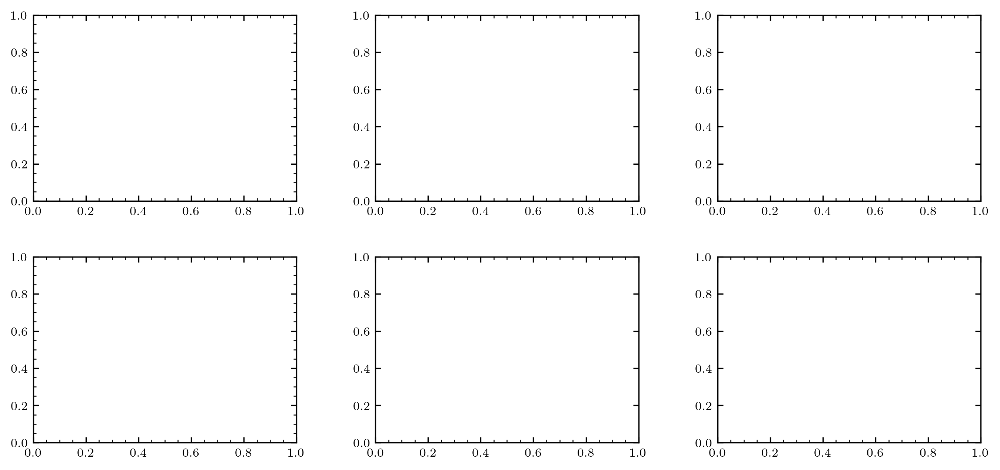

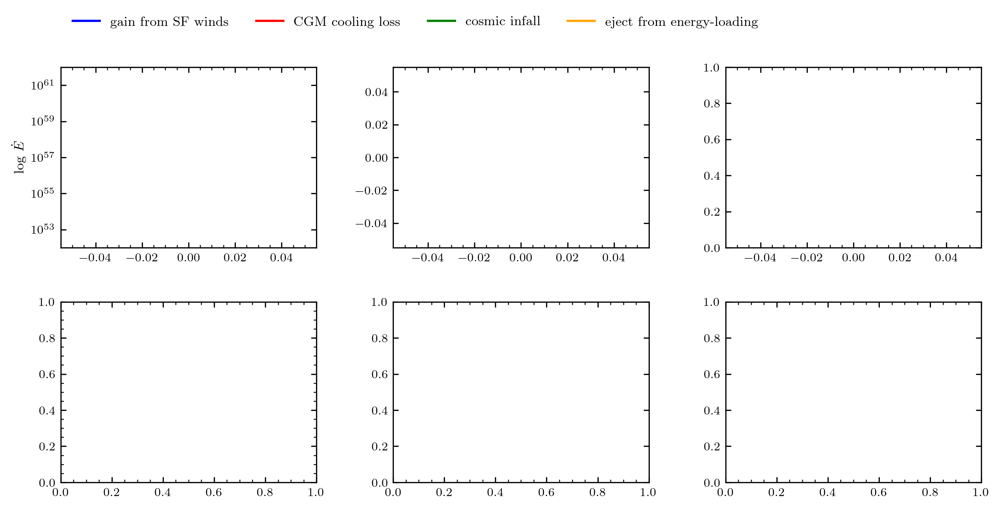

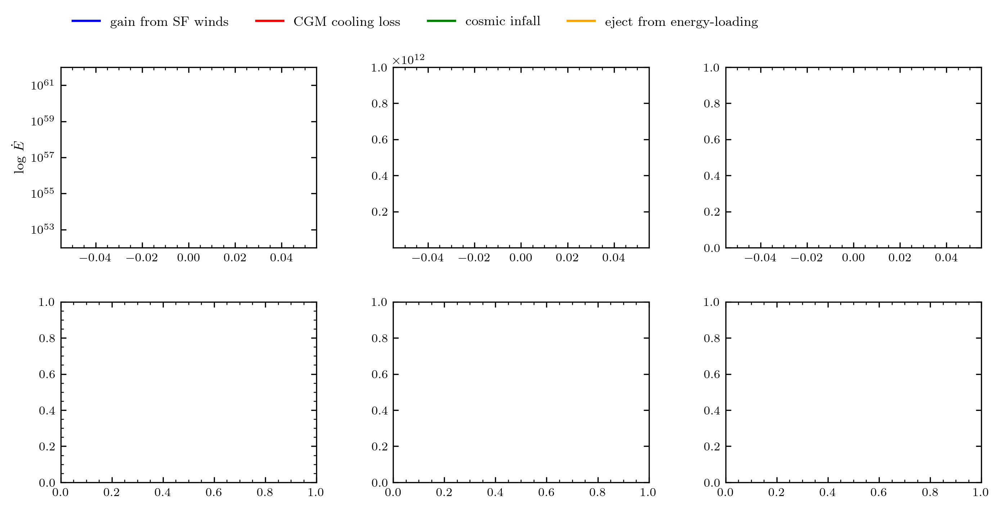

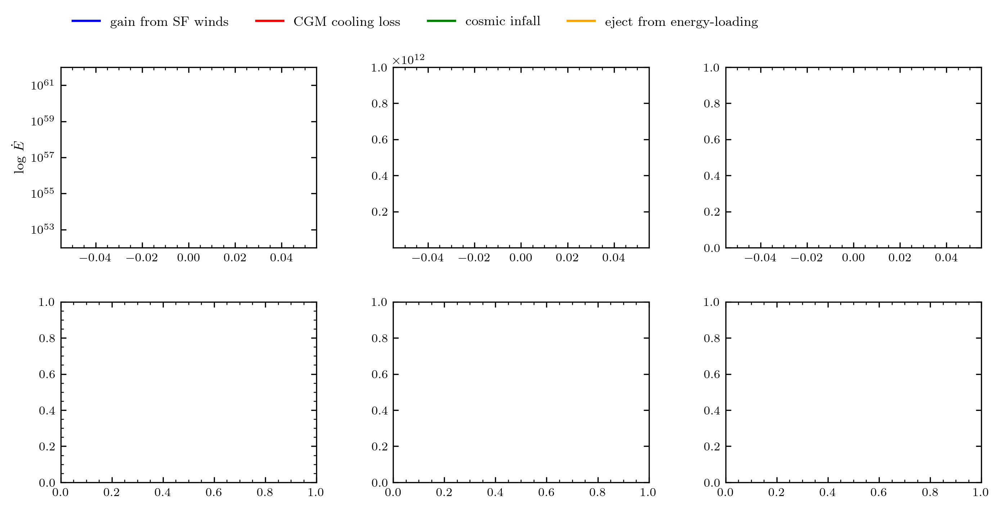

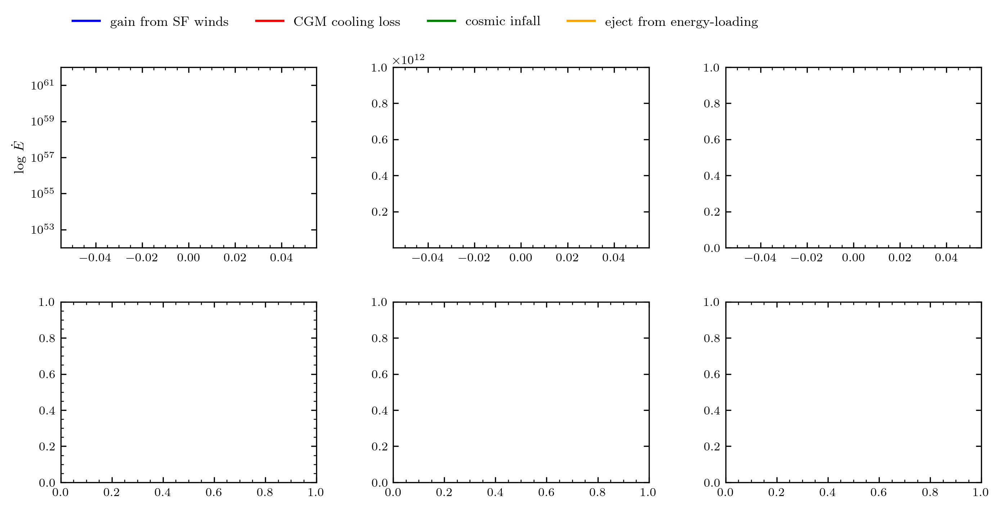

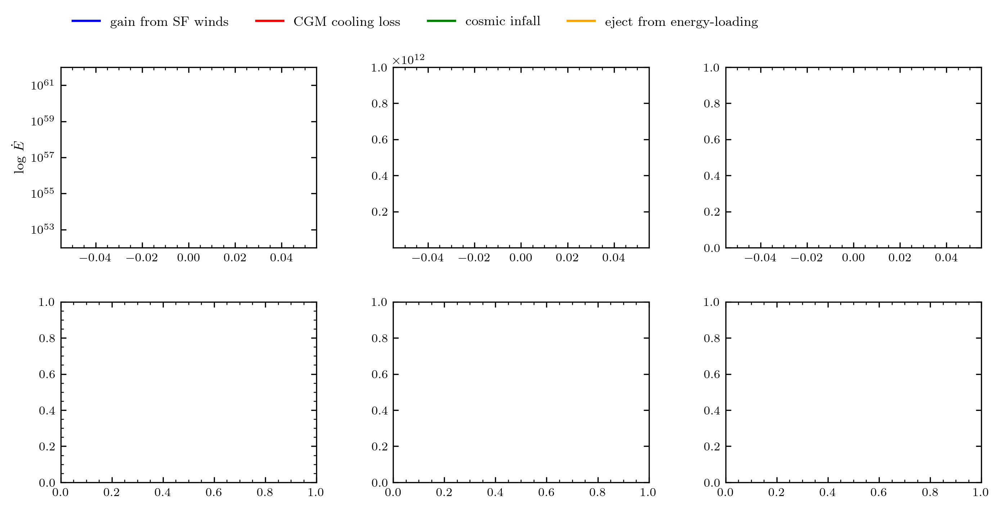

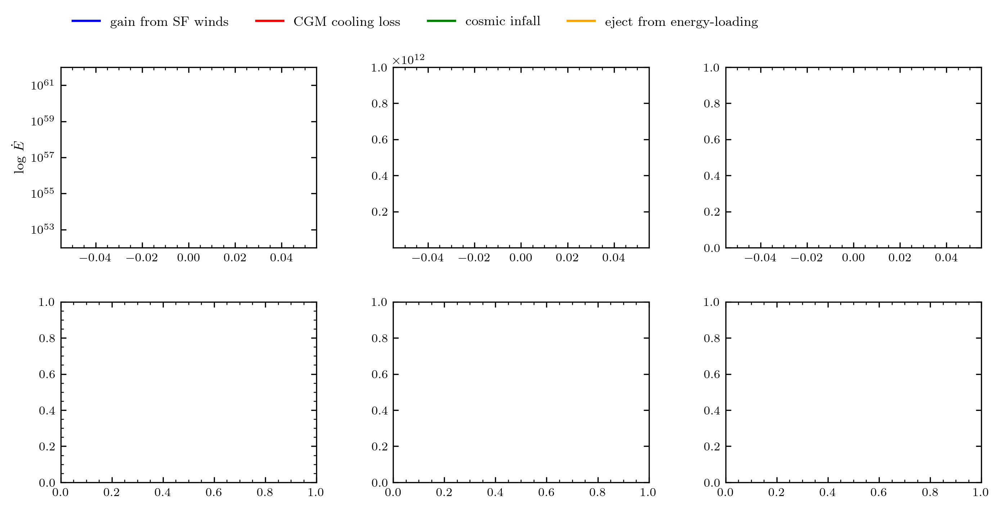

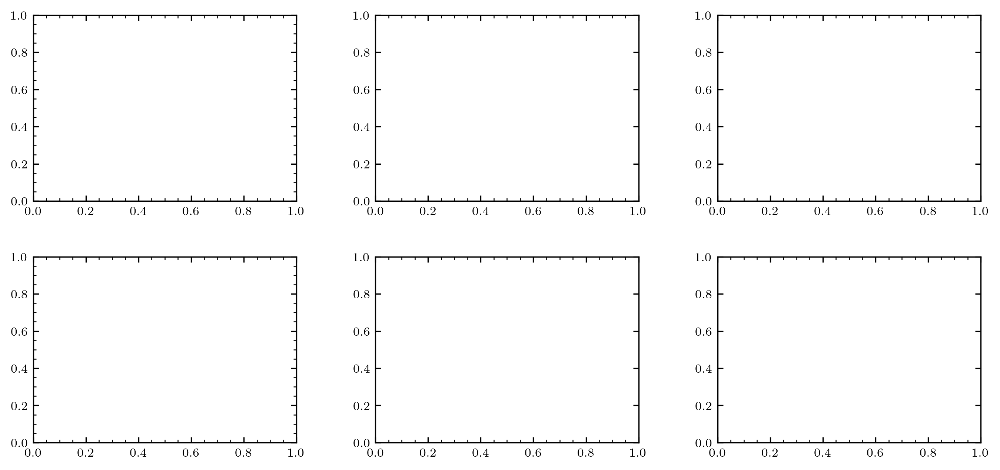

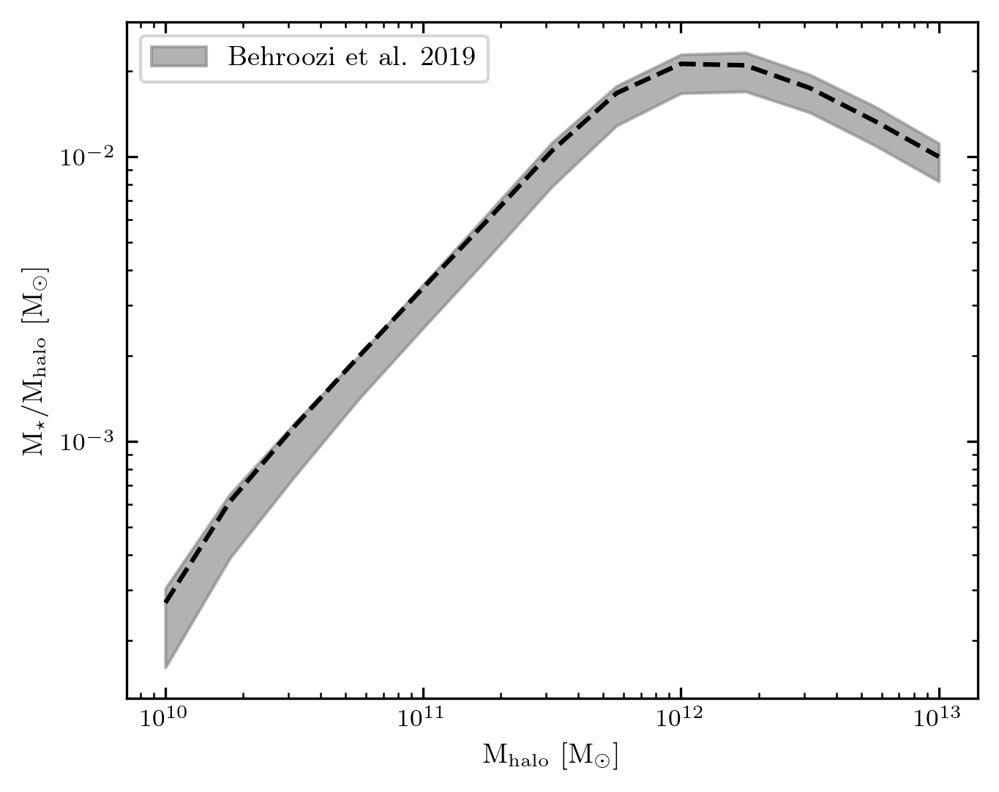

In [ ]:
smmr = np.loadtxt("./data/sm_averages_a1.002310.dat")
loghm = smmr[8:21, 0]  # halo mass
hm = 10**loghm * u.solMass

logSM = smmr[8:21, 7]  # stellar mass
sm = 10 ** logSM[8:21] * u.solMass

SMerr = np.vstack([smmr[8:21, 3], smmr[8:21, 2]])  # error array
logSMHM = smmr[8:21, 10]  # stellar mass / halo mass
SMHMerr = np.vstack([smmr[8:21, 12], smmr[8:21, 11]])  # error array
fig, ax = plt.subplots(1, 1, figsize=(5, 4), sharey="all", dpi=300)
ax.plot(10**loghm, 10**logSMHM, color="k", ls="--")
ax.fill_between(
    10**loghm,
    10 ** (logSMHM + SMHMerr[1, :]),
    10 ** (logSMHM - SMHMerr[0, :]),
    color="gray",
    alpha=0.6,
    label="Behroozi et al. 2019",
)
ax.set(
    xlabel=r"M$_{\rm halo}$ [M$_\odot$]",
    ylabel=r"M$_\star$/M$_{\rm halo}$ [M$_\odot$]",
    yscale="log",
    xscale="log",
)
ax.legend()
plt.show()

In [ ]:
def plot_halo_evolution(model):
    TT_list = model["TT_list"]
    Tvir_list = model["Tvir_list"]
    Eg_dot_list = model["Eg_dot_list"]
    El_dot_list = model["El_dot_list"]
    Eacc_dot_list = model["Eacc_dot_list"]
    Eej_dot_list = model["Eej_dot_list"]

    t = model["t"]
    CGM_cool_list = model["CGM_cool_list"]
    CGM_eject_list = model["CGM_eject_list"]
    CGM_gain_list = model["CGM_gain_list"]
    CGM_infall_list = model["CGM_infall_list"]
    fprevent_list = model["fprevent_list"]
    fstar_list = model["fstar_list"]
    mgas_t = model["mgas_t"]
    mstar_t = model["mstar_t"]
    mCGM_t = model["mCGM_t"]
    mZM_t = model["mZM_t"]
    mhalo_t = model["mhalo_t"]
    ECGM_t = model["ECGM_t"]
    Z_cgm = model["Z_cgm"]
    z = model["z"]
    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(TT_list, Eg_dot_list, label="gain from SF", color="b")
    ax[0].plot(TT_list, El_dot_list, label="cooling loss", color="r")
    ax[0].plot(TT_list, Eacc_dot_list, label=r"cosmic infall", color="g")
    ax[0].plot(
        TT_list, Eej_dot_list, label=r"eject from energy-loading", color="orange"
    )
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(TT_list, CGM_gain_list, label="mass gain from SF", color="b")
    ax[1].plot(TT_list, CGM_cool_list, label="cooling gas", color="r")
    ax[1].plot(TT_list, CGM_infall_list, label=r"cosmic infall", color="g")
    ax[1].plot(
        TT_list, CGM_eject_list, label=r"eject from energy-loading", color="orange"
    )
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(TT_list[0], TT_list[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(TT_list, fprevent_list)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(TT_list, fstar_list)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t, np.log10(mCGM_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((ECGM_t * u.erg) / (mCGM_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(TT_list, Tvir_list, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(TT_list, Eg_dot_list, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t * u.Gyr).value for t in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()

Running models from z = 11.18 redshift to z = 4.85 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf


/home/fabg/.pyenv/versions/3.8.10/lib/python3.8/site-packages/astropy/units/quantity.py:673: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
1049.7289647830744
131.01280111788273
100.84683199232173
385.77988999670555
inf
inf
inf
1409.1962765879348
512.497437940825
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
inf
73.45249790728091
47.1253473263298
38.71528288331769
51.4010265197319
inf
inf
117.92771563282398
74.13737598613959
59.41738761423263
76.36516892172823
54.31468533686401
43.9325751537484
24.09045859474356
22.21464772486803
20.10308426562573
20.076760159609456
15.97893235326428
13.896121324222872
9.398534825659379
9.224148256713242
8.573106385919633
8.176197108244365
6.8406705978335225
6.17519002118713
5.281666994598083
6.241886610216722
5.9940431752155705
4.622019877374504
4.458244391417229
4

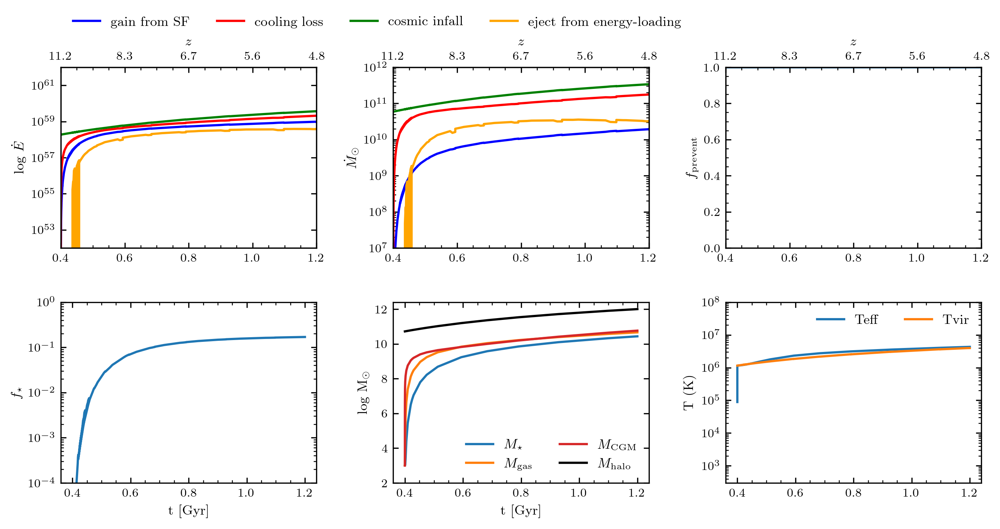

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
y = 0.02  # metallicity enrichment yield (mass in metals produced per solar mass)
fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
C = 0.4

# controls how effective outflowing energy is at preventing inflowing gas
CGM_infall_prevention_constant = 1.0
# ratio of specific energy of ejected gas to CGM gas
CGM_eject_specific_energy_ratio = 1.0
# time, virial temperature, cooling function, depletion time, inflow prevention factor, star formation efficiency
TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list = (
    [],
    [],
    [],
    [],
    [],
    [],
)
#
CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list = ([], [], [], [])
Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list = ([], [], [], [])
Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list = ([], [], [], [])
msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list = ([], [], [], [], [])

time_interval = (0.4, 1.2)
mh1e9t_004_05 = explore_halo(1e12 * u.solMass, 0.3, 0.15, time_interval)
plot_halo_evolution(mh1e9t_004_05)

In [ ]:
def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    mgas = mass[0] * u.solMass
    mstar = mass[1] * u.solMass
    mCGM = mass[2] * u.solMass  # Total CGM mass
    mZM = mass[3] * u.solMass
    mhalo = mass[4] * u.solMass

    E_g = mass[5] * (u.erg)  # Energy gained from energy-loaded galactic winds
    E_l = mass[6] * (u.erg)  # Energy loss from gas precipitation onto the Galaxy
    E_ej = mass[7] * (u.erg)  # Energy loss from mass enjected from the CGM
    E_acc = mass[8] * (u.erg)  # Energy gained from mass accretion from the IGM
    E_CGM = mass[9] * (u.erg)  # Total CGM energy

    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift

    t_dep = depletion_time(z, mstar, exp, C)  # estimate of depletion time
    # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr
    t_dep_list.append(t_dep.value)

    Rvir = virial_radius(z, mhalo).to(u.kpc)  # virial radius
    Tvir = virial_T(mhalo, Rvir).to(u.K)  # Virial Temperature
    rho_crit = LCDM.critical_density(z)  # critical density
    t_dyn = t_ff(Rvir, Rvir, mhalo).to(u.Gyr)  # dynamical time
    # t_cool = 10 * t_ff(Rvir,Rvir, mhalo).to(u.Gyr) # cooling time from precipitation
    Z_m = mZM / mCGM  # CGM metallicity
    Z = Z_m / Z_sol  # CGM metallicity with respect to solar metallicity
    Lamb = cooling_fn((-4, np.log10(Tvir.value), Z, 0)) * (
        u.erg * u.cm**3 * u.s**-1
    )  # cooling function value

    # Compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * Rvir  # our definition of inner radius of CGM
    # r1 = 10.0*u.kpc # Another possible definition of inner radius of CGM

    rho0 = density0(mCGM=mCGM, alpha=alpha, r1=r1, Rvir=Rvir)  # central density of CGM

    # Energy ejection loss timescale
    cs = np.sqrt(E_CGM / mCGM)  # specific energy of CGM (approximate sound speed)
    t_ej = Rvir / cs  # ejection time of hot gas
    t_ej = min(max(t_ej, 0.1 * t_dyn), t_dyn)  # clip to range 0.1-1 t_dyn

    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    Eej_dot = (max(E_CGM - kb * Tvir * mCGM / mu, 0.0 * u.erg) / t_ej).to(u.erg / u.Gyr)

    # Energy radiative loss
    # integrated radiative loss rate
    El_dot = energy_loss(Lamb, Rvir, r1, rho0).to(u.erg / u.Gyr)

    # specific energy of ejected gas
    CGM_specific_energy = CGM_eject_specific_energy_ratio * max(
        E_CGM / mCGM, kb * Tvir / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (CGM_specific_energy / El_dot) * mCGM
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling

    # include dynamical time?
    tcool_eff = tcool_eff + 1 * t_dyn
    El_dot = (E_CGM / tcool_eff).to(u.erg / u.Gyr)

    # CGM mass loss due to cooling (using effective cooling time)
    CGM_cool_dot = (mCGM / tcool_eff).to(u.solMass / u.Gyr)

    # Mass Terms
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)
    mstar_dot = (mgas / t_dep).to(u.solMass / u.Gyr)
    mgas_dot = (-(mgas / t_dep) * (1 + eta_m) + CGM_cool_dot).to(u.solMass / u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)

    # CGM eject loss term
    CGM_eject_dot = ((1 / CGM_specific_energy) * Eej_dot).to(u.solMass / u.Gyr)

    # CGM infall terms
    CGM_infall_dot = fb * mhalo_dot

    # CGM infall prevention factor: ratio of ejection energy / infall energy
    Eej_infall_ratio = CGM_infall_prevention_constant / (
        Eej_dot / ((kb * Tvir / mu) * CGM_infall_dot)
    ).to(u.dimensionless_unscaled)
    print("e", Eej_infall_ratio)
    fprevent = min(max(Eej_infall_ratio, 0.1), 1.0)  # clip to 0.1-1.0
    CGM_infall_dot *= fprevent

    # CGM feedback gain term
    CGM_gain_dot = mstar_dot * eta_m

    # Energy gain due to star formation
    Eg_dot = energy_gain(eta_e, mstar_dot)

    # Energy loss due to ejection
    Eacc_dot = ((kb * Tvir) / mu * CGM_infall_dot).to(u.erg * u.Gyr**-1)

    # totaol Mass, energy, and metallicity derivatives
    mCGM_dot = CGM_infall_dot + CGM_gain_dot - CGM_cool_dot - CGM_eject_dot
    #    print(mCGM_dot, CGM_infall_dot, CGM_gain_dot, CGM_cool_dot, CGM_eject_dot)
    mZM_dot = (
        eta_z * y * mstar_dot
        + Z_IGM * Z_sol * CGM_infall_dot
        - Z_m * (CGM_cool_dot + CGM_eject_dot)
    )
    ECGM_dot = Eg_dot + 1 * Eacc_dot - Eej_dot - 1 * El_dot

    if (mCGM.value < 3e5) & (mCGM_dot < 0):
        mCGM_dot *= max((mCGM.value - 5e3) / 5e3, 0)
    #        mCGM_dot = 0.0 * u.solMass/u.Gyr

    # Record some quantities for plotting later
    TT_list.append(t)  # Time [Gyr]
    Tvir_list.append(Tvir.value)

    Eej_dot_list.append(Eej_dot.value)
    El_dot_list.append(El_dot.value)
    Eacc_dot_list.append(Eacc_dot.value)
    Eg_dot_list.append(Eg_dot.value)

    CGM_eject_list.append(CGM_eject_dot.value)
    CGM_cool_list.append(CGM_cool_dot.value)
    CGM_infall_list.append(CGM_infall_dot.value)
    CGM_gain_list.append(CGM_gain_dot.value)

    fprevent_list.append(fprevent)
    fstar_list.append(mstar / (fb * mhalo))

    grad_array = np.array(
        [
            mgas_dot.value,
            mstar_dot.value,
            mCGM_dot.value,
            mZM_dot.value,
            mhalo_dot.value,
            Eg_dot.value,
            El_dot.value,
            Eej_dot.value,
            Eacc_dot.value,
            ECGM_dot.value,
        ]
    )

    #    plot_list.append( (t,grad_array,Tvir_list,fprevent))

    return grad_array


def bathtub(time_interval, mhalo_z0):
    """run the model for a given halo mass at z=0

    Args:
        time_interval (float): tuple, time interval for the model (units: Gyr)
        mhalo_z0 (float): stellar mass at z=0 (units: solar mass)

    Returns:
        (array): time, redshift, gas mass, stellar mass, CGM mass, halo mass, CGM metallicity, energy gain, energy loss, energy ejection, energy accretion, CGM energy
    """

    mhalo0 = initial_mhalo(mhalo_z0, time_interval)
    Rvir = virial_radius(0, mhalo0 * u.solMass).to(u.kpc)  # virial radius
    Tvir = virial_T(mhalo0 * u.solMass, Rvir).to(u.K)  # Virial Temperature
    mcgm0 = 1e3
    ecgm0 = (1e3 * u.solMass * fb * kb * Tvir / mu).to(u.erg)
    mass_initial = np.array(
        [1e3, 1e3, mcgm0, 1e1, mhalo0, 1e3, 1e3, 1e3, 1e3, ecgm0.value]
    )

    sol = solve_ivp(mass_evolution, time_interval, mass_initial, rtol=1e-3)
    t = sol.t
    mgas_t = sol.y[0]
    mstar_t = sol.y[1]
    mCGM_t = sol.y[2]
    mZM_t = sol.y[3]
    mhalo_t = sol.y[4]

    Eg_t = sol.y[5]
    El_t = sol.y[6]
    Eej_t = sol.y[7]
    Eacc_t = sol.y[8]
    ECGM_t = sol.y[9]

    Z_m = mZM_t / mCGM_t  # CGM metallicity ratio
    Z_cgm = Z_m / Z_sol  # CGM metallicity with respect to solar metallicity
    #   z = np.sqrt((28/t) - 1) - 1 # cosmological redshift rough approx
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    return (
        t,
        z,
        mgas_t,
        mstar_t,
        mCGM_t,
        mhalo_t,
        Z_cgm,
        Eg_t,
        El_t,
        Eej_t,
        Eacc_t,
        ECGM_t,
    )

Running models from z = 11.18 redshift to z = 4.85 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e 1049.7289647830744
e 131.01280111788273
e 100.84683199232173
e 385.77988999670555
e inf
e inf
e inf
e 1409.1962765879348
e 512.497437940825
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf


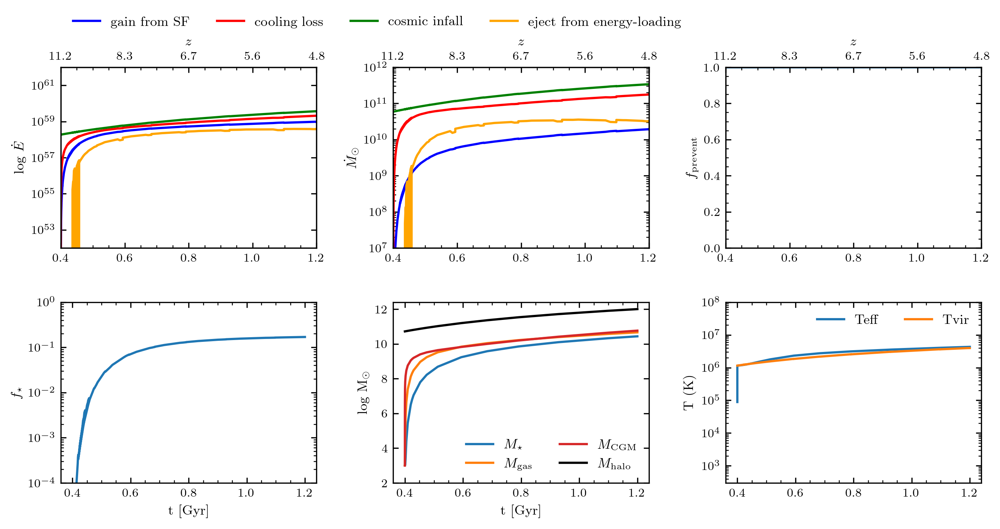

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
y = 0.02  # metallicity enrichment yield (mass in metals produced per solar mass)
fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
C = 0.4

# controls how effective outflowing energy is at preventing inflowing gas
CGM_infall_prevention_constant = 1.0
# ratio of specific energy of ejected gas to CGM gas
CGM_eject_specific_energy_ratio = 1.0
# time, virial temperature, cooling function, depletion time, inflow prevention factor, star formation efficiency
TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list = (
    [],
    [],
    [],
    [],
    [],
    [],
)
#
CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list = ([], [], [], [])
Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list = ([], [], [], [])
Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list = ([], [], [], [])
msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list = ([], [], [], [], [])

time_interval = (0.4, 1.2)
mh1e9t_004_05 = explore_halo(1e12 * u.solMass, 0.3, 0.15, time_interval)
plot_halo_evolution(mh1e9t_004_05)

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


# def mass_evolution(t, mass):
#     """Ode to solve the mass evolution of the galaxy

#     Args:
#         t (_type_): _description_
#         mass (_type_): _description_

#     Returns:
#         _type_: _description_
#     """

#     #  t: time (units: Gyr)
#     #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
#     #  energy [5-9] (units: erg): 5 vector of energy of each component/term

#     # get current redshift
#     z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

#     m_gas = mass[0] * u.solMass
#     m_star = mass[1] * u.solMass
#     m_cgm = mass[2] * u.solMass  # Total CGM mass
#     m_metals = mass[3] * u.solMass
#     m_halo = mass[4] * u.solMass  # total halo mass

#     e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
#     e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
#     e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
#     e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
#     e_cgm = mass[9] * u.erg  # Total CGM energy

#     # now, derive relevant quantities
#     t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
#     halo_rvir = virial_radius(z, m_halo).to(u.kpc)
#     halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
#     t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
#     rho_crit = LCDM.critical_density(z)
#     cgm_metallicity = m_metals / m_cgm
#     cgm_metallicity_sol = cgm_metallicity / Z_sol

#     # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

#     # cooling function value at this timestep
#     cooling_lambda = cooling_fn(
#         (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
#     ) * (u.erg * u.cm**3 * u.s**-1)

#     # compute density normalization for power-law density model from CGM mass
#     r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

#     ## Another possible definition of inner radius of CGM
#     # r1 = 10.0*u.kpc

#     # get the central density in units of kpc^-3 ?
#     rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

#     # estimate energy ejection loss timescale and limitit to dynamical time
#     c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
#     t_ejection = halo_rvir / c_sound  # ejection time of hot gas
#     t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
#     # print(t_ejection)
#     # outflow rate assuming that gas flows out at the sound speed
#     # eq. 18 from Carr+ 2023
#     # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
#     dot_e_cgm_out = (
#         max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
#     ).to(u.erg / u.Gyr)

#     # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
#     dot_e_cgm_cool = energy_loss(
#         Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
#     ).to(u.erg / u.Gyr)

#     # speceific energy of eject gas
#     cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
#         e_cgm / m_cgm, kb * halo_vir_temp / mu
#     )

#     # (effective) cooling time of CGM
#     tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
#     #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
#     #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
#     tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
#     dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

#     ##################### moving on to mass evolution
#     # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
#     # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

#     # CGM mass loss due to cooling, eq. 7 from Carr 2023
#     dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
#     # eq. 12, m_gas is kinda the ism
#     dot_m_sfr = m_gas / t_depletion
#     # eq 11 ish
#     dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
#     dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

#     dot_m_halo = halo_infall(z, m_halo)
#     dot_m_cgm_in = fb * dot_m_halo  # eq. 6

#     # CGM eject loss term, eq 10
#     dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

#     ################## calculate the energies that depend on the mass changes

#     # ratio of dot ECGM_in / ECGM_out
#     e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
#         dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
#     ).to(u.dimensionless_unscaled)
#     # equation 19 CGM infall prevention factor
#     f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
#     dot_m_cgm_in *= f_prevent

#     # energy input from SF
#     dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

#     # energy due to accretion, eq 16
#     dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

#     # CGM feedback gain term, eq 9
#     dot_m_ism_wind = dot_m_sfr * eta_m

#     ##################  total Mass, Energy, and Metallicity derivatives
#     dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
#     dot_m_metal = (
#         metal_yield * eta_z * dot_m_sfr
#         + Z_IGM * Z_sol * dot_m_cgm_in
#         - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
#     )
#     dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

#     # limiter
#     if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
#         dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

#     # t_dep_list.append(t_dep.value)

#     derivs = np.array(
#         [
#             dot_m_gas.value,
#             dot_m_sfr.value,
#             dot_m_cgm.value,
#             dot_m_metal.value,
#             dot_m_halo.value,
#             dot_e_ism_wind.value,
#             dot_e_cgm_cool.value,
#             dot_e_cgm_out.value,
#             dot_e_cgm_in.value,
#             dot_e_cgm.value,
#         ]
#     )
#     return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes
        print(dot_m_cgm_in)
        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        ).to(u.dimensionless_unscaled)

        # equation 19 CGM infall prevention factor
        f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            self.mass_evolution,
            self.time_interval,
            masses_initial,
            # method="RK45",
            rtol=1e-3,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.3, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.30) = 3.05e+10 Msol
48890489173.71013 solMass / Gyr
48890489173.71013 solMass / Gyr
48890489173.71017 solMass / Gyr
48890489173.710175 solMass / Gyr
48890489173.710266 solMass / Gyr
48890489173.71028 solMass / Gyr
48890489173.71032 solMass / Gyr
48890489173.71032 solMass / Gyr
48890489173.71066 solMass / Gyr
48890489173.71086 solMass / Gyr
48890489173.71176 solMass / Gyr
48890489173.711914 solMass / Gyr
48890489173.71214 solMass / Gyr
48890489173.71214 solMass / Gyr
48890489173.715775 solMass / Gyr
48890489173.71759 solMass / Gyr
48890489173.72668 solMass / Gyr
48890489173.728294 solMass / Gyr
48890489173.730316 solMass / Gyr
48890489173.730316 solMass / Gyr
48890489173.76668 solMass / Gyr
48890489173.78487 solMass / Gyr
48890489173.87576 solMass / Gyr
48890489173.891945 solMass / Gyr
48890489173.91215 solMass 

TypeError: only dimensionless scalar quantities can be converted to Python scalars

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


# def mass_evolution(t, mass):
#     """Ode to solve the mass evolution of the galaxy

#     Args:
#         t (_type_): _description_
#         mass (_type_): _description_

#     Returns:
#         _type_: _description_
#     """

#     #  t: time (units: Gyr)
#     #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
#     #  energy [5-9] (units: erg): 5 vector of energy of each component/term

#     # get current redshift
#     z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

#     m_gas = mass[0] * u.solMass
#     m_star = mass[1] * u.solMass
#     m_cgm = mass[2] * u.solMass  # Total CGM mass
#     m_metals = mass[3] * u.solMass
#     m_halo = mass[4] * u.solMass  # total halo mass

#     e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
#     e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
#     e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
#     e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
#     e_cgm = mass[9] * u.erg  # Total CGM energy

#     # now, derive relevant quantities
#     t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
#     halo_rvir = virial_radius(z, m_halo).to(u.kpc)
#     halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
#     t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
#     rho_crit = LCDM.critical_density(z)
#     cgm_metallicity = m_metals / m_cgm
#     cgm_metallicity_sol = cgm_metallicity / Z_sol

#     # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

#     # cooling function value at this timestep
#     cooling_lambda = cooling_fn(
#         (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
#     ) * (u.erg * u.cm**3 * u.s**-1)

#     # compute density normalization for power-law density model from CGM mass
#     r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

#     ## Another possible definition of inner radius of CGM
#     # r1 = 10.0*u.kpc

#     # get the central density in units of kpc^-3 ?
#     rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

#     # estimate energy ejection loss timescale and limitit to dynamical time
#     c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
#     t_ejection = halo_rvir / c_sound  # ejection time of hot gas
#     t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
#     # print(t_ejection)
#     # outflow rate assuming that gas flows out at the sound speed
#     # eq. 18 from Carr+ 2023
#     # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
#     dot_e_cgm_out = (
#         max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
#     ).to(u.erg / u.Gyr)

#     # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
#     dot_e_cgm_cool = energy_loss(
#         Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
#     ).to(u.erg / u.Gyr)

#     # speceific energy of eject gas
#     cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
#         e_cgm / m_cgm, kb * halo_vir_temp / mu
#     )

#     # (effective) cooling time of CGM
#     tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
#     #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
#     #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
#     tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
#     dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

#     ##################### moving on to mass evolution
#     # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
#     # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

#     # CGM mass loss due to cooling, eq. 7 from Carr 2023
#     dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
#     # eq. 12, m_gas is kinda the ism
#     dot_m_sfr = m_gas / t_depletion
#     # eq 11 ish
#     dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
#     dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

#     dot_m_halo = halo_infall(z, m_halo)
#     dot_m_cgm_in = fb * dot_m_halo  # eq. 6

#     # CGM eject loss term, eq 10
#     dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

#     ################## calculate the energies that depend on the mass changes

#     # ratio of dot ECGM_in / ECGM_out
#     e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
#         dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
#     ).to(u.dimensionless_unscaled)
#     # equation 19 CGM infall prevention factor
#     f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
#     dot_m_cgm_in *= f_prevent

#     # energy input from SF
#     dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

#     # energy due to accretion, eq 16
#     dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

#     # CGM feedback gain term, eq 9
#     dot_m_ism_wind = dot_m_sfr * eta_m

#     ##################  total Mass, Energy, and Metallicity derivatives
#     dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
#     dot_m_metal = (
#         metal_yield * eta_z * dot_m_sfr
#         + Z_IGM * Z_sol * dot_m_cgm_in
#         - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
#     )
#     dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

#     # limiter
#     if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
#         dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

#     # t_dep_list.append(t_dep.value)

#     derivs = np.array(
#         [
#             dot_m_gas.value,
#             dot_m_sfr.value,
#             dot_m_cgm.value,
#             dot_m_metal.value,
#             dot_m_halo.value,
#             dot_e_ism_wind.value,
#             dot_e_cgm_cool.value,
#             dot_e_cgm_out.value,
#             dot_e_cgm_in.value,
#             dot_e_cgm.value,
#         ]
#     )
#     return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes
        print(dot_m_cgm_in)
        # ratio of dot ECGM_in / ECGM_out
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / ((self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in)
        )
        print(e_ejection_to_infall_ratio)

        # equation 19 CGM infall prevention factor
        f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            self.mass_evolution,
            self.time_interval,
            masses_initial,
            # method="RK45",
            rtol=1e-3,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.3, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.30) = 3.05e+10 Msol
48890489173.71013 solMass / Gyr
inf J solMass / (erg kg)
48890489173.71013 solMass / Gyr
inf J solMass / (erg kg)
48890489173.71017 solMass / Gyr
inf J solMass / (erg kg)
48890489173.710175 solMass / Gyr
inf J solMass / (erg kg)
48890489173.710266 solMass / Gyr
inf J solMass / (erg kg)
48890489173.71028 solMass / Gyr
inf J solMass / (erg kg)
48890489173.71032 solMass / Gyr
inf J solMass / (erg kg)
48890489173.71032 solMass / Gyr
inf J solMass / (erg kg)
48890489173.71066 solMass / Gyr
inf J solMass / (erg kg)
48890489173.71086 solMass / Gyr
inf J solMass / (erg kg)
48890489173.71176 solMass / Gyr
inf J solMass / (erg kg)
48890489173.711914 solMass / Gyr
inf J solMass / (erg kg)
48890489173.71214 solMass / Gyr
inf J solMass / (erg kg)
48890489173.71214 solMass / Gyr
inf J solMass / (erg kg)
4

TypeError: only dimensionless scalar quantities can be converted to Python scalars

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


# def mass_evolution(t, mass):
#     """Ode to solve the mass evolution of the galaxy

#     Args:
#         t (_type_): _description_
#         mass (_type_): _description_

#     Returns:
#         _type_: _description_
#     """

#     #  t: time (units: Gyr)
#     #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
#     #  energy [5-9] (units: erg): 5 vector of energy of each component/term

#     # get current redshift
#     z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

#     m_gas = mass[0] * u.solMass
#     m_star = mass[1] * u.solMass
#     m_cgm = mass[2] * u.solMass  # Total CGM mass
#     m_metals = mass[3] * u.solMass
#     m_halo = mass[4] * u.solMass  # total halo mass

#     e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
#     e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
#     e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
#     e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
#     e_cgm = mass[9] * u.erg  # Total CGM energy

#     # now, derive relevant quantities
#     t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
#     halo_rvir = virial_radius(z, m_halo).to(u.kpc)
#     halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
#     t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
#     rho_crit = LCDM.critical_density(z)
#     cgm_metallicity = m_metals / m_cgm
#     cgm_metallicity_sol = cgm_metallicity / Z_sol

#     # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

#     # cooling function value at this timestep
#     cooling_lambda = cooling_fn(
#         (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
#     ) * (u.erg * u.cm**3 * u.s**-1)

#     # compute density normalization for power-law density model from CGM mass
#     r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

#     ## Another possible definition of inner radius of CGM
#     # r1 = 10.0*u.kpc

#     # get the central density in units of kpc^-3 ?
#     rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

#     # estimate energy ejection loss timescale and limitit to dynamical time
#     c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
#     t_ejection = halo_rvir / c_sound  # ejection time of hot gas
#     t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
#     # print(t_ejection)
#     # outflow rate assuming that gas flows out at the sound speed
#     # eq. 18 from Carr+ 2023
#     # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
#     dot_e_cgm_out = (
#         max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
#     ).to(u.erg / u.Gyr)

#     # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
#     dot_e_cgm_cool = energy_loss(
#         Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
#     ).to(u.erg / u.Gyr)

#     # speceific energy of eject gas
#     cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
#         e_cgm / m_cgm, kb * halo_vir_temp / mu
#     )

#     # (effective) cooling time of CGM
#     tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
#     #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
#     #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
#     tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
#     dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

#     ##################### moving on to mass evolution
#     # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
#     # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

#     # CGM mass loss due to cooling, eq. 7 from Carr 2023
#     dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
#     # eq. 12, m_gas is kinda the ism
#     dot_m_sfr = m_gas / t_depletion
#     # eq 11 ish
#     dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
#     dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

#     dot_m_halo = halo_infall(z, m_halo)
#     dot_m_cgm_in = fb * dot_m_halo  # eq. 6

#     # CGM eject loss term, eq 10
#     dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

#     ################## calculate the energies that depend on the mass changes

#     # ratio of dot ECGM_in / ECGM_out
#     e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
#         dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
#     ).to(u.dimensionless_unscaled)
#     # equation 19 CGM infall prevention factor
#     f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
#     dot_m_cgm_in *= f_prevent

#     # energy input from SF
#     dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

#     # energy due to accretion, eq 16
#     dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

#     # CGM feedback gain term, eq 9
#     dot_m_ism_wind = dot_m_sfr * eta_m

#     ##################  total Mass, Energy, and Metallicity derivatives
#     dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
#     dot_m_metal = (
#         metal_yield * eta_z * dot_m_sfr
#         + Z_IGM * Z_sol * dot_m_cgm_in
#         - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
#     )
#     dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

#     # limiter
#     if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
#         dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

#     # t_dep_list.append(t_dep.value)

#     derivs = np.array(
#         [
#             dot_m_gas.value,
#             dot_m_sfr.value,
#             dot_m_cgm.value,
#             dot_m_metal.value,
#             dot_m_halo.value,
#             dot_e_ism_wind.value,
#             dot_e_cgm_cool.value,
#             dot_e_cgm_out.value,
#             dot_e_cgm_in.value,
#             dot_e_cgm.value,
#         ]
#     )
#     return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        dot_energy_from_infall = (self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in
        print(dot_energy_from_infall)
        print(dot_m_cgm_in)
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / dot_energy_from_infall
        ).to(u.dimensionless_unscaled)

        # equation 19 CGM infall prevention factor
        f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            self.mass_evolution,
            self.time_interval,
            masses_initial,
            # method="RK45",
            rtol=1e-3,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.3, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.30) = 3.05e+10 Msol
6.549902877451147e+20 J solMass / (Gyr kg)
48890489173.71013 solMass / Gyr
6.549902877451147e+20 J solMass / (Gyr kg)
48890489173.71013 solMass / Gyr
6.549902877451155e+20 J solMass / (Gyr kg)
48890489173.71017 solMass / Gyr
6.549902877451159e+20 J solMass / (Gyr kg)
48890489173.710175 solMass / Gyr
6.54990287745118e+20 J solMass / (Gyr kg)
48890489173.710266 solMass / Gyr
6.549902877451181e+20 J solMass / (Gyr kg)
48890489173.71028 solMass / Gyr
6.54990287745119e+20 J solMass / (Gyr kg)
48890489173.71032 solMass / Gyr
6.54990287745119e+20 J solMass / (Gyr kg)
48890489173.71032 solMass / Gyr
6.54990287745127e+20 J solMass / (Gyr kg)
48890489173.71066 solMass / Gyr
6.549902877451311e+20 J solMass / (Gyr kg)
48890489173.71086 solMass / Gyr
6.549902877451513e+20 J solMass / (Gyr kg)
48890489173

TypeError: only dimensionless scalar quantities can be converted to Python scalars

In [ ]:
def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    mgas = mass[0] * u.solMass
    mstar = mass[1] * u.solMass
    mCGM = mass[2] * u.solMass  # Total CGM mass
    mZM = mass[3] * u.solMass
    mhalo = mass[4] * u.solMass

    E_g = mass[5] * (u.erg)  # Energy gained from energy-loaded galactic winds
    E_l = mass[6] * (u.erg)  # Energy loss from gas precipitation onto the Galaxy
    E_ej = mass[7] * (u.erg)  # Energy loss from mass enjected from the CGM
    E_acc = mass[8] * (u.erg)  # Energy gained from mass accretion from the IGM
    E_CGM = mass[9] * (u.erg)  # Total CGM energy

    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift

    t_dep = depletion_time(z, mstar, exp, C)  # estimate of depletion time
    # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr
    t_dep_list.append(t_dep.value)

    Rvir = virial_radius(z, mhalo).to(u.kpc)  # virial radius
    Tvir = virial_T(mhalo, Rvir).to(u.K)  # Virial Temperature
    rho_crit = LCDM.critical_density(z)  # critical density
    t_dyn = t_ff(Rvir, Rvir, mhalo).to(u.Gyr)  # dynamical time
    # t_cool = 10 * t_ff(Rvir,Rvir, mhalo).to(u.Gyr) # cooling time from precipitation
    Z_m = mZM / mCGM  # CGM metallicity
    Z = Z_m / Z_sol  # CGM metallicity with respect to solar metallicity
    Lamb = cooling_fn((-4, np.log10(Tvir.value), Z, 0)) * (
        u.erg * u.cm**3 * u.s**-1
    )  # cooling function value

    # Compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * Rvir  # our definition of inner radius of CGM
    # r1 = 10.0*u.kpc # Another possible definition of inner radius of CGM

    rho0 = density0(mCGM=mCGM, alpha=alpha, r1=r1, Rvir=Rvir)  # central density of CGM

    # Energy ejection loss timescale
    cs = np.sqrt(E_CGM / mCGM)  # specific energy of CGM (approximate sound speed)
    t_ej = Rvir / cs  # ejection time of hot gas
    t_ej = min(max(t_ej, 0.1 * t_dyn), t_dyn)  # clip to range 0.1-1 t_dyn

    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    Eej_dot = (max(E_CGM - kb * Tvir * mCGM / mu, 0.0 * u.erg) / t_ej).to(u.erg / u.Gyr)

    # Energy radiative loss
    # integrated radiative loss rate
    El_dot = energy_loss(Lamb, Rvir, r1, rho0).to(u.erg / u.Gyr)

    # specific energy of ejected gas
    CGM_specific_energy = CGM_eject_specific_energy_ratio * max(
        E_CGM / mCGM, kb * Tvir / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (CGM_specific_energy / El_dot) * mCGM
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling

    # include dynamical time?
    tcool_eff = tcool_eff + 1 * t_dyn
    El_dot = (E_CGM / tcool_eff).to(u.erg / u.Gyr)

    # CGM mass loss due to cooling (using effective cooling time)
    CGM_cool_dot = (mCGM / tcool_eff).to(u.solMass / u.Gyr)

    # Mass Terms
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)
    mstar_dot = (mgas / t_dep).to(u.solMass / u.Gyr)
    mgas_dot = (-(mgas / t_dep) * (1 + eta_m) + CGM_cool_dot).to(u.solMass / u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)

    # CGM eject loss term
    CGM_eject_dot = ((1 / CGM_specific_energy) * Eej_dot).to(u.solMass / u.Gyr)

    # CGM infall terms
    CGM_infall_dot = fb * mhalo_dot

    # CGM infall prevention factor: ratio of ejection energy / infall energy
    Eej_infall_ratio = CGM_infall_prevention_constant / (
        Eej_dot / ((kb * Tvir / mu) * CGM_infall_dot)
    ).to(u.dimensionless_unscaled)
    print("e", Eej_infall_ratio)
    fprevent = min(max(Eej_infall_ratio, 0.1), 1.0)  # clip to 0.1-1.0
    CGM_infall_dot *= fprevent

    # CGM feedback gain term
    CGM_gain_dot = mstar_dot * eta_m

    # Energy gain due to star formation
    Eg_dot = energy_gain(eta_e, mstar_dot)

    # Energy loss due to ejection
    Eacc_dot = ((kb * Tvir) / mu * CGM_infall_dot).to(u.erg * u.Gyr**-1)

    # totaol Mass, energy, and metallicity derivatives
    mCGM_dot = CGM_infall_dot + CGM_gain_dot - CGM_cool_dot - CGM_eject_dot
    #    print(mCGM_dot, CGM_infall_dot, CGM_gain_dot, CGM_cool_dot, CGM_eject_dot)
    mZM_dot = (
        eta_z * y * mstar_dot
        + Z_IGM * Z_sol * CGM_infall_dot
        - Z_m * (CGM_cool_dot + CGM_eject_dot)
    )
    ECGM_dot = Eg_dot + 1 * Eacc_dot - Eej_dot - 1 * El_dot

    if (mCGM.value < 3e5) & (mCGM_dot < 0):
        mCGM_dot *= max((mCGM.value - 5e3) / 5e3, 0)
    #        mCGM_dot = 0.0 * u.solMass/u.Gyr

    # Record some quantities for plotting later
    TT_list.append(t)  # Time [Gyr]
    Tvir_list.append(Tvir.value)

    Eej_dot_list.append(Eej_dot.value)
    El_dot_list.append(El_dot.value)
    Eacc_dot_list.append(Eacc_dot.value)
    Eg_dot_list.append(Eg_dot.value)

    CGM_eject_list.append(CGM_eject_dot.value)
    CGM_cool_list.append(CGM_cool_dot.value)
    CGM_infall_list.append(CGM_infall_dot.value)
    CGM_gain_list.append(CGM_gain_dot.value)

    fprevent_list.append(fprevent)
    fstar_list.append(mstar / (fb * mhalo))

    grad_array = np.array(
        [
            mgas_dot.value,
            mstar_dot.value,
            mCGM_dot.value,
            mZM_dot.value,
            mhalo_dot.value,
            Eg_dot.value,
            El_dot.value,
            Eej_dot.value,
            Eacc_dot.value,
            ECGM_dot.value,
        ]
    )

    #    plot_list.append( (t,grad_array,Tvir_list,fprevent))

    return grad_array


def bathtub(time_interval, mhalo_z0):
    """run the model for a given halo mass at z=0

    Args:
        time_interval (float): tuple, time interval for the model (units: Gyr)
        mhalo_z0 (float): stellar mass at z=0 (units: solar mass)

    Returns:
        (array): time, redshift, gas mass, stellar mass, CGM mass, halo mass, CGM metallicity, energy gain, energy loss, energy ejection, energy accretion, CGM energy
    """

    mhalo0 = initial_mhalo(mhalo_z0, time_interval)
    Rvir = virial_radius(0, mhalo0 * u.solMass).to(u.kpc)  # virial radius
    Tvir = virial_T(mhalo0 * u.solMass, Rvir).to(u.K)  # Virial Temperature
    mcgm0 = 1e3
    ecgm0 = (1e3 * u.solMass * fb * kb * Tvir / mu).to(u.erg)
    mass_initial = np.array(
        [1e3, 1e3, mcgm0, 1e1, mhalo0, 1e3, 1e3, 1e3, 1e3, ecgm0.value]
    )

    sol = solve_ivp(mass_evolution, time_interval, mass_initial, rtol=1e-3)
    t = sol.t
    mgas_t = sol.y[0]
    mstar_t = sol.y[1]
    mCGM_t = sol.y[2]
    mZM_t = sol.y[3]
    mhalo_t = sol.y[4]

    Eg_t = sol.y[5]
    El_t = sol.y[6]
    Eej_t = sol.y[7]
    Eacc_t = sol.y[8]
    ECGM_t = sol.y[9]

    Z_m = mZM_t / mCGM_t  # CGM metallicity ratio
    Z_cgm = Z_m / Z_sol  # CGM metallicity with respect to solar metallicity
    #   z = np.sqrt((28/t) - 1) - 1 # cosmological redshift rough approx
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    return (
        t,
        z,
        mgas_t,
        mstar_t,
        mCGM_t,
        mhalo_t,
        Z_cgm,
        Eg_t,
        El_t,
        Eej_t,
        Eacc_t,
        ECGM_t,
    )

Running models from z = 11.18 redshift to z = 4.85 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e 1049.7289647830744
e 131.01280111788273
e 100.84683199232173
e 385.77988999670555
e inf
e inf
e inf
e 1409.1962765879348
e 512.497437940825
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf


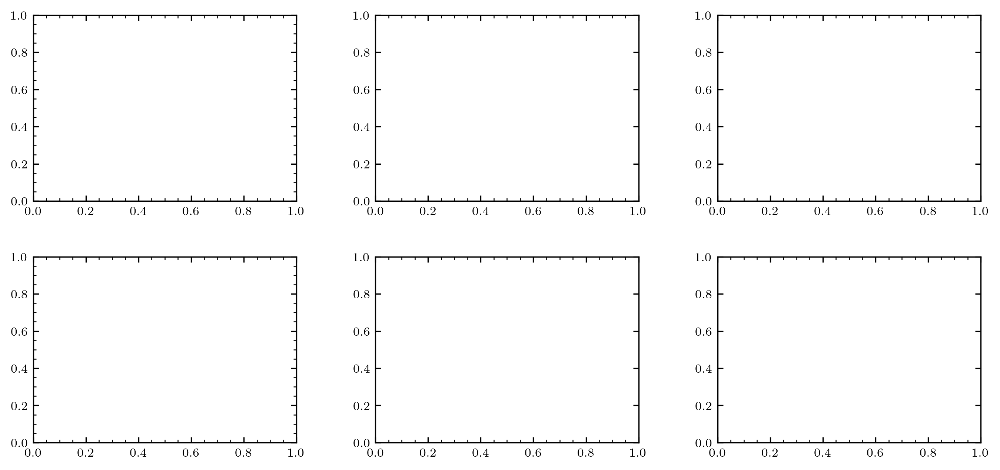

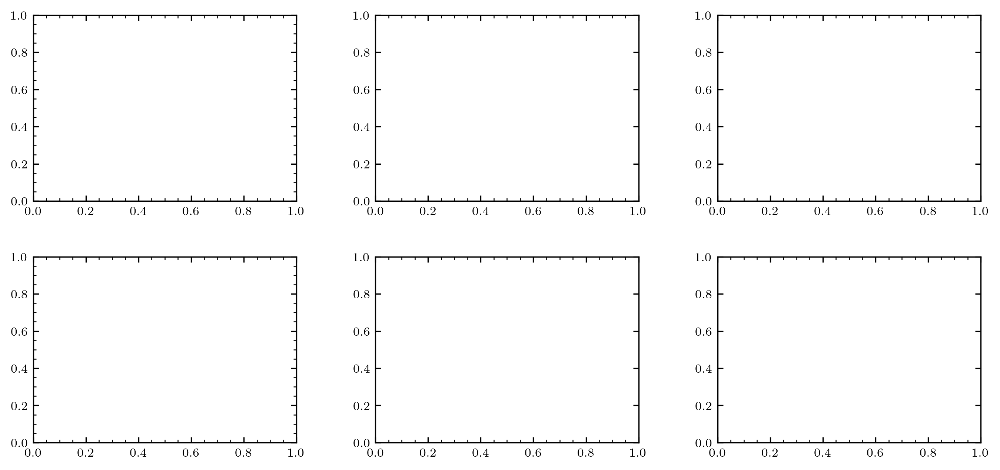

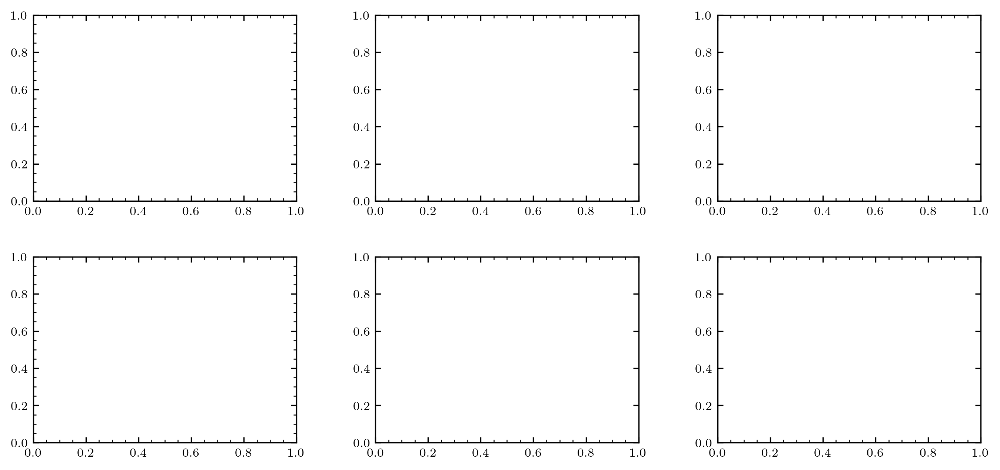

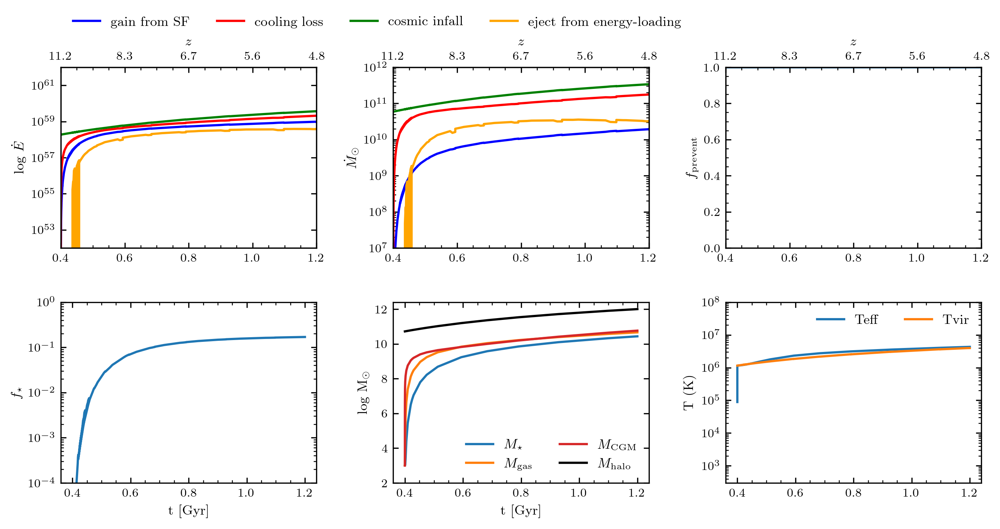

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
y = 0.02  # metallicity enrichment yield (mass in metals produced per solar mass)
fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
C = 0.4

# controls how effective outflowing energy is at preventing inflowing gas
CGM_infall_prevention_constant = 1.0
# ratio of specific energy of ejected gas to CGM gas
CGM_eject_specific_energy_ratio = 1.0
# time, virial temperature, cooling function, depletion time, inflow prevention factor, star formation efficiency
TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list = (
    [],
    [],
    [],
    [],
    [],
    [],
)
#
CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list = ([], [], [], [])
Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list = ([], [], [], [])
Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list = ([], [], [], [])
msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list = ([], [], [], [], [])

time_interval = (0.4, 1.2)
mh1e9t_004_05 = explore_halo(1e12 * u.solMass, 0.3, 0.15, time_interval)
plot_halo_evolution(mh1e9t_004_05)

Running models from z = 11.18 redshift to z = 4.85 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e 1049.7289647830744
e 131.01280111788273
e 100.84683199232173
e 385.77988999670555
e inf
e inf
e inf
e 1409.1962765879348
e 512.497437940825
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf


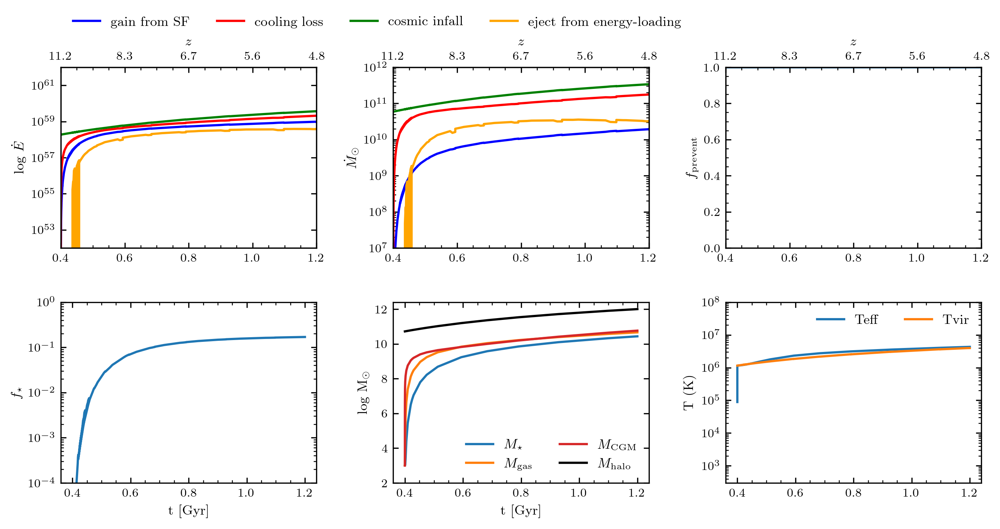

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
y = 0.02  # metallicity enrichment yield (mass in metals produced per solar mass)
fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
C = 0.4

# controls how effective outflowing energy is at preventing inflowing gas
CGM_infall_prevention_constant = 1.0
# ratio of specific energy of ejected gas to CGM gas
CGM_eject_specific_energy_ratio = 1.0
# time, virial temperature, cooling function, depletion time, inflow prevention factor, star formation efficiency
TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list = (
    [],
    [],
    [],
    [],
    [],
    [],
)
#
CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list = ([], [], [], [])
Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list = ([], [], [], [])
Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list = ([], [], [], [])
msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list = ([], [], [], [], [])

time_interval = (0.4, 1.2)
mh1e9t_004_05 = explore_halo(1e12 * u.solMass, 0.3, 0.15, time_interval)
plot_halo_evolution(mh1e9t_004_05)

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


# def mass_evolution(t, mass):
#     """Ode to solve the mass evolution of the galaxy

#     Args:
#         t (_type_): _description_
#         mass (_type_): _description_

#     Returns:
#         _type_: _description_
#     """

#     #  t: time (units: Gyr)
#     #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
#     #  energy [5-9] (units: erg): 5 vector of energy of each component/term

#     # get current redshift
#     z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

#     m_gas = mass[0] * u.solMass
#     m_star = mass[1] * u.solMass
#     m_cgm = mass[2] * u.solMass  # Total CGM mass
#     m_metals = mass[3] * u.solMass
#     m_halo = mass[4] * u.solMass  # total halo mass

#     e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
#     e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
#     e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
#     e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
#     e_cgm = mass[9] * u.erg  # Total CGM energy

#     # now, derive relevant quantities
#     t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
#     halo_rvir = virial_radius(z, m_halo).to(u.kpc)
#     halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
#     t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
#     rho_crit = LCDM.critical_density(z)
#     cgm_metallicity = m_metals / m_cgm
#     cgm_metallicity_sol = cgm_metallicity / Z_sol

#     # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

#     # cooling function value at this timestep
#     cooling_lambda = cooling_fn(
#         (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
#     ) * (u.erg * u.cm**3 * u.s**-1)

#     # compute density normalization for power-law density model from CGM mass
#     r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

#     ## Another possible definition of inner radius of CGM
#     # r1 = 10.0*u.kpc

#     # get the central density in units of kpc^-3 ?
#     rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

#     # estimate energy ejection loss timescale and limitit to dynamical time
#     c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
#     t_ejection = halo_rvir / c_sound  # ejection time of hot gas
#     t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
#     # print(t_ejection)
#     # outflow rate assuming that gas flows out at the sound speed
#     # eq. 18 from Carr+ 2023
#     # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
#     dot_e_cgm_out = (
#         max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
#     ).to(u.erg / u.Gyr)

#     # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
#     dot_e_cgm_cool = energy_loss(
#         Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
#     ).to(u.erg / u.Gyr)

#     # speceific energy of eject gas
#     cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
#         e_cgm / m_cgm, kb * halo_vir_temp / mu
#     )

#     # (effective) cooling time of CGM
#     tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
#     #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
#     #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
#     tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
#     dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

#     ##################### moving on to mass evolution
#     # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
#     # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

#     # CGM mass loss due to cooling, eq. 7 from Carr 2023
#     dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
#     # eq. 12, m_gas is kinda the ism
#     dot_m_sfr = m_gas / t_depletion
#     # eq 11 ish
#     dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
#     dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

#     dot_m_halo = halo_infall(z, m_halo)
#     dot_m_cgm_in = fb * dot_m_halo  # eq. 6

#     # CGM eject loss term, eq 10
#     dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

#     ################## calculate the energies that depend on the mass changes

#     # ratio of dot ECGM_in / ECGM_out
#     e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
#         dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
#     ).to(u.dimensionless_unscaled)
#     # equation 19 CGM infall prevention factor
#     f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
#     dot_m_cgm_in *= f_prevent

#     # energy input from SF
#     dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

#     # energy due to accretion, eq 16
#     dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

#     # CGM feedback gain term, eq 9
#     dot_m_ism_wind = dot_m_sfr * eta_m

#     ##################  total Mass, Energy, and Metallicity derivatives
#     dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
#     dot_m_metal = (
#         metal_yield * eta_z * dot_m_sfr
#         + Z_IGM * Z_sol * dot_m_cgm_in
#         - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
#     )
#     dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

#     # limiter
#     if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
#         dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

#     # t_dep_list.append(t_dep.value)

#     derivs = np.array(
#         [
#             dot_m_gas.value,
#             dot_m_sfr.value,
#             dot_m_cgm.value,
#             dot_m_metal.value,
#             dot_m_halo.value,
#             dot_e_ism_wind.value,
#             dot_e_cgm_cool.value,
#             dot_e_cgm_out.value,
#             dot_e_cgm_in.value,
#             dot_e_cgm.value,
#         ]
#     )
#     return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        dot_energy_from_infall = (self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in
        print(dot_energy_from_infall)
        print(dot_m_cgm_in)
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / dot_energy_from_infall
        ).to(u.dimensionless_unscaled)

        # equation 19 CGM infall prevention factor
        f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            self.mass_evolution,
            self.time_interval,
            masses_initial,
            # method="RK45",
            rtol=1e-3,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.3, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.30) = 3.05e+10 Msol
6.549902877451147e+20 J solMass / (Gyr kg)
48890489173.71013 solMass / Gyr
6.549902877451147e+20 J solMass / (Gyr kg)
48890489173.71013 solMass / Gyr
6.549902877451155e+20 J solMass / (Gyr kg)
48890489173.71017 solMass / Gyr
6.549902877451159e+20 J solMass / (Gyr kg)
48890489173.710175 solMass / Gyr
6.54990287745118e+20 J solMass / (Gyr kg)
48890489173.710266 solMass / Gyr
6.549902877451181e+20 J solMass / (Gyr kg)
48890489173.71028 solMass / Gyr
6.54990287745119e+20 J solMass / (Gyr kg)
48890489173.71032 solMass / Gyr
6.54990287745119e+20 J solMass / (Gyr kg)
48890489173.71032 solMass / Gyr
6.54990287745127e+20 J solMass / (Gyr kg)
48890489173.71066 solMass / Gyr
6.549902877451311e+20 J solMass / (Gyr kg)
48890489173.71086 solMass / Gyr
6.549902877451513e+20 J solMass / (Gyr kg)
48890489173

TypeError: only dimensionless scalar quantities can be converted to Python scalars

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


# def mass_evolution(t, mass):
#     """Ode to solve the mass evolution of the galaxy

#     Args:
#         t (_type_): _description_
#         mass (_type_): _description_

#     Returns:
#         _type_: _description_
#     """

#     #  t: time (units: Gyr)
#     #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
#     #  energy [5-9] (units: erg): 5 vector of energy of each component/term

#     # get current redshift
#     z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

#     m_gas = mass[0] * u.solMass
#     m_star = mass[1] * u.solMass
#     m_cgm = mass[2] * u.solMass  # Total CGM mass
#     m_metals = mass[3] * u.solMass
#     m_halo = mass[4] * u.solMass  # total halo mass

#     e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
#     e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
#     e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
#     e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
#     e_cgm = mass[9] * u.erg  # Total CGM energy

#     # now, derive relevant quantities
#     t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
#     halo_rvir = virial_radius(z, m_halo).to(u.kpc)
#     halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
#     t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
#     rho_crit = LCDM.critical_density(z)
#     cgm_metallicity = m_metals / m_cgm
#     cgm_metallicity_sol = cgm_metallicity / Z_sol

#     # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

#     # cooling function value at this timestep
#     cooling_lambda = cooling_fn(
#         (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
#     ) * (u.erg * u.cm**3 * u.s**-1)

#     # compute density normalization for power-law density model from CGM mass
#     r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

#     ## Another possible definition of inner radius of CGM
#     # r1 = 10.0*u.kpc

#     # get the central density in units of kpc^-3 ?
#     rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

#     # estimate energy ejection loss timescale and limitit to dynamical time
#     c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
#     t_ejection = halo_rvir / c_sound  # ejection time of hot gas
#     t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
#     # print(t_ejection)
#     # outflow rate assuming that gas flows out at the sound speed
#     # eq. 18 from Carr+ 2023
#     # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
#     dot_e_cgm_out = (
#         max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
#     ).to(u.erg / u.Gyr)

#     # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
#     dot_e_cgm_cool = energy_loss(
#         Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
#     ).to(u.erg / u.Gyr)

#     # speceific energy of eject gas
#     cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
#         e_cgm / m_cgm, kb * halo_vir_temp / mu
#     )

#     # (effective) cooling time of CGM
#     tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
#     #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
#     #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
#     tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
#     dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

#     ##################### moving on to mass evolution
#     # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
#     # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

#     # CGM mass loss due to cooling, eq. 7 from Carr 2023
#     dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
#     # eq. 12, m_gas is kinda the ism
#     dot_m_sfr = m_gas / t_depletion
#     # eq 11 ish
#     dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
#     dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

#     dot_m_halo = halo_infall(z, m_halo)
#     dot_m_cgm_in = fb * dot_m_halo  # eq. 6

#     # CGM eject loss term, eq 10
#     dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

#     ################## calculate the energies that depend on the mass changes

#     # ratio of dot ECGM_in / ECGM_out
#     e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
#         dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
#     ).to(u.dimensionless_unscaled)
#     # equation 19 CGM infall prevention factor
#     f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
#     dot_m_cgm_in *= f_prevent

#     # energy input from SF
#     dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

#     # energy due to accretion, eq 16
#     dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

#     # CGM feedback gain term, eq 9
#     dot_m_ism_wind = dot_m_sfr * eta_m

#     ##################  total Mass, Energy, and Metallicity derivatives
#     dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
#     dot_m_metal = (
#         metal_yield * eta_z * dot_m_sfr
#         + Z_IGM * Z_sol * dot_m_cgm_in
#         - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
#     )
#     dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

#     # limiter
#     if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
#         dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

#     # t_dep_list.append(t_dep.value)

#     derivs = np.array(
#         [
#             dot_m_gas.value,
#             dot_m_sfr.value,
#             dot_m_cgm.value,
#             dot_m_metal.value,
#             dot_m_halo.value,
#             dot_e_ism_wind.value,
#             dot_e_cgm_cool.value,
#             dot_e_cgm_out.value,
#             dot_e_cgm_in.value,
#             dot_e_cgm.value,
#         ]
#     )
#     return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        dot_energy_from_infall = (self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in
        print("dot_energy_from_infall", dot_energy_from_infall)
        print(dot_m_cgm_in)
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / dot_energy_from_infall
        ).to(u.dimensionless_unscaled)

        # equation 19 CGM infall prevention factor
        f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            self.mass_evolution,
            self.time_interval,
            masses_initial,
            # method="RK45",
            rtol=1e-3,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.3, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.30) = 3.05e+10 Msol
dot_energy_from_infall 6.549902877451147e+20 J solMass / (Gyr kg)
48890489173.71013 solMass / Gyr
dot_energy_from_infall 6.549902877451147e+20 J solMass / (Gyr kg)
48890489173.71013 solMass / Gyr
dot_energy_from_infall 6.549902877451155e+20 J solMass / (Gyr kg)
48890489173.71017 solMass / Gyr
dot_energy_from_infall 6.549902877451159e+20 J solMass / (Gyr kg)
48890489173.710175 solMass / Gyr
dot_energy_from_infall 6.54990287745118e+20 J solMass / (Gyr kg)
48890489173.710266 solMass / Gyr
dot_energy_from_infall 6.549902877451181e+20 J solMass / (Gyr kg)
48890489173.71028 solMass / Gyr
dot_energy_from_infall 6.54990287745119e+20 J solMass / (Gyr kg)
48890489173.71032 solMass / Gyr
dot_energy_from_infall 6.54990287745119e+20 J solMass / (Gyr kg)
48890489173.71032 solMass / Gyr
dot_energy_from_inf

TypeError: only dimensionless scalar quantities can be converted to Python scalars

Running models from z = 11.18 redshift to z = 4.85 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e 1049.7289647830744
e 131.01280111788273
e 100.84683199232173
e 385.77988999670555
e inf
e inf
e inf
e 1409.1962765879348
e 512.497437940825
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf
e inf


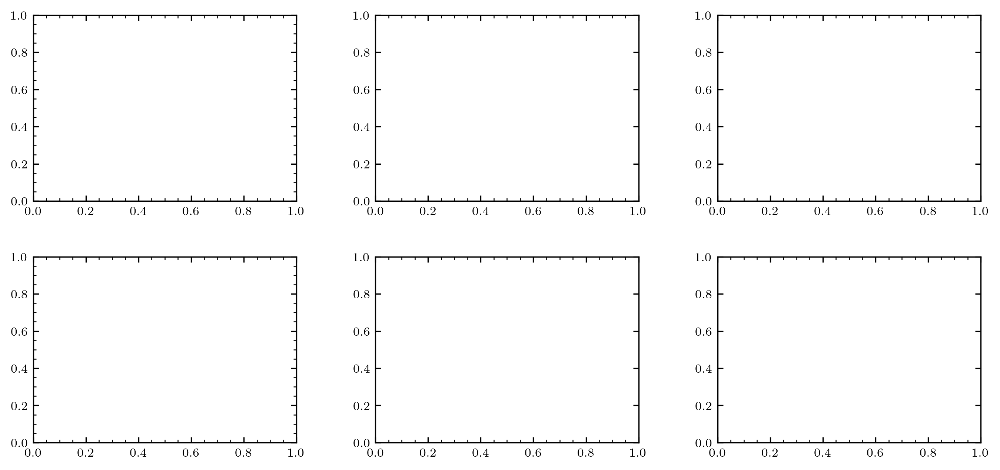

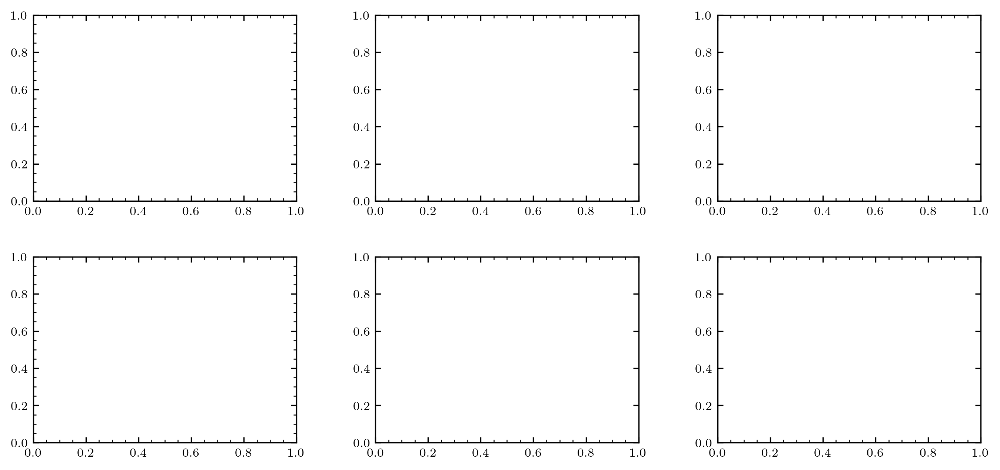

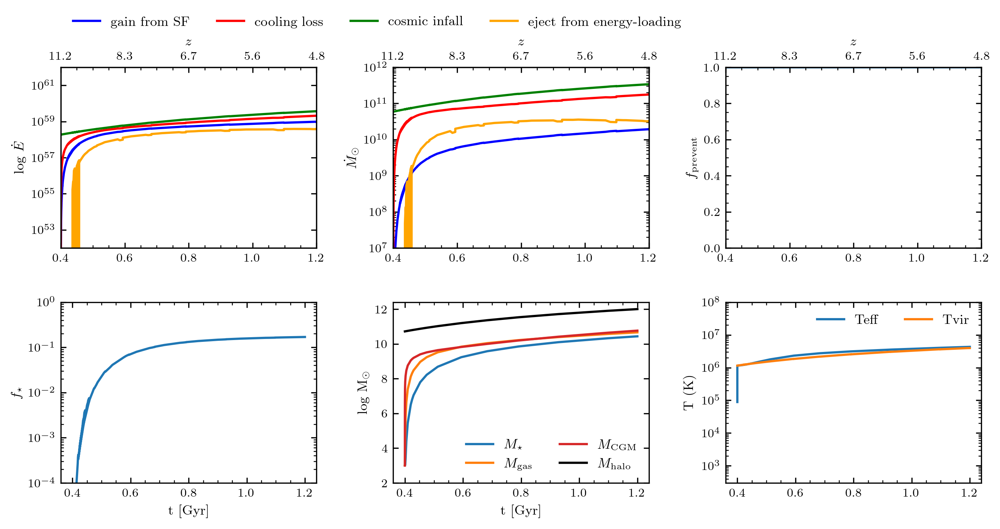

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
y = 0.02  # metallicity enrichment yield (mass in metals produced per solar mass)
fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
C = 0.4

# controls how effective outflowing energy is at preventing inflowing gas
CGM_infall_prevention_constant = 1.0
# ratio of specific energy of ejected gas to CGM gas
CGM_eject_specific_energy_ratio = 1.0
# time, virial temperature, cooling function, depletion time, inflow prevention factor, star formation efficiency
TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list = (
    [],
    [],
    [],
    [],
    [],
    [],
)
#
CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list = ([], [], [], [])
Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list = ([], [], [], [])
Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list = ([], [], [], [])
msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list = ([], [], [], [], [])

time_interval = (0.4, 1.2)
mh1e9t_004_05 = explore_halo(1e12 * u.solMass, 0.3, 0.15, time_interval)
plot_halo_evolution(mh1e9t_004_05)

In [ ]:
def mass_evolution(t, mass):
    """Ode to solve the mass evolution of the galaxy

    Args:
        t (_type_): _description_
        mass (_type_): _description_

    Returns:
        _type_: _description_
    """

    #  t: time (units: Gyr)
    #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
    #  energy [5-9] (units: erg): 5 vector of energy of each component/term

    mgas = mass[0] * u.solMass
    mstar = mass[1] * u.solMass
    mCGM = mass[2] * u.solMass  # Total CGM mass
    mZM = mass[3] * u.solMass
    mhalo = mass[4] * u.solMass

    E_g = mass[5] * (u.erg)  # Energy gained from energy-loaded galactic winds
    E_l = mass[6] * (u.erg)  # Energy loss from gas precipitation onto the Galaxy
    E_ej = mass[7] * (u.erg)  # Energy loss from mass enjected from the CGM
    E_acc = mass[8] * (u.erg)  # Energy gained from mass accretion from the IGM
    E_CGM = mass[9] * (u.erg)  # Total CGM energy

    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift

    t_dep = depletion_time(z, mstar, exp, C)  # estimate of depletion time
    # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr
    t_dep_list.append(t_dep.value)

    Rvir = virial_radius(z, mhalo).to(u.kpc)  # virial radius
    Tvir = virial_T(mhalo, Rvir).to(u.K)  # Virial Temperature
    rho_crit = LCDM.critical_density(z)  # critical density
    t_dyn = t_ff(Rvir, Rvir, mhalo).to(u.Gyr)  # dynamical time
    # t_cool = 10 * t_ff(Rvir,Rvir, mhalo).to(u.Gyr) # cooling time from precipitation
    Z_m = mZM / mCGM  # CGM metallicity
    Z = Z_m / Z_sol  # CGM metallicity with respect to solar metallicity
    Lamb = cooling_fn((-4, np.log10(Tvir.value), Z, 0)) * (
        u.erg * u.cm**3 * u.s**-1
    )  # cooling function value

    # Compute density normalization for power-law density model from CGM mass
    r1 = 0.1 * Rvir  # our definition of inner radius of CGM
    # r1 = 10.0*u.kpc # Another possible definition of inner radius of CGM

    rho0 = density0(mCGM=mCGM, alpha=alpha, r1=r1, Rvir=Rvir)  # central density of CGM

    # Energy ejection loss timescale
    cs = np.sqrt(E_CGM / mCGM)  # specific energy of CGM (approximate sound speed)
    t_ej = Rvir / cs  # ejection time of hot gas
    t_ej = min(max(t_ej, 0.1 * t_dyn), t_dyn)  # clip to range 0.1-1 t_dyn

    # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
    Eej_dot = (max(E_CGM - kb * Tvir * mCGM / mu, 0.0 * u.erg) / t_ej).to(u.erg / u.Gyr)

    # Energy radiative loss
    # integrated radiative loss rate
    El_dot = energy_loss(Lamb, Rvir, r1, rho0).to(u.erg / u.Gyr)

    # specific energy of ejected gas
    CGM_specific_energy = CGM_eject_specific_energy_ratio * max(
        E_CGM / mCGM, kb * Tvir / mu
    )

    # (effective) cooling time of CGM
    tcool_eff = (CGM_specific_energy / El_dot) * mCGM
    #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
    #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling

    # include dynamical time?
    tcool_eff = tcool_eff + 1 * t_dyn
    El_dot = (E_CGM / tcool_eff).to(u.erg / u.Gyr)

    # CGM mass loss due to cooling (using effective cooling time)
    CGM_cool_dot = (mCGM / tcool_eff).to(u.solMass / u.Gyr)

    # Mass Terms
    # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
    # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)
    mstar_dot = (mgas / t_dep).to(u.solMass / u.Gyr)
    mgas_dot = (-(mgas / t_dep) * (1 + eta_m) + CGM_cool_dot).to(u.solMass / u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)

    # CGM eject loss term
    CGM_eject_dot = ((1 / CGM_specific_energy) * Eej_dot).to(u.solMass / u.Gyr)

    # CGM infall terms
    CGM_infall_dot = fb * mhalo_dot
    print("CGM_infall_dot", CGM_infall_dot)
    # CGM infall prevention factor: ratio of ejection energy / infall energy
    Eej_infall_ratio = CGM_infall_prevention_constant / (
        Eej_dot / ((kb * Tvir / mu) * CGM_infall_dot)
    ).to(u.dimensionless_unscaled)
    print("e", Eej_infall_ratio)
    fprevent = min(max(Eej_infall_ratio, 0.1), 1.0)  # clip to 0.1-1.0
    CGM_infall_dot *= fprevent

    # CGM feedback gain term
    CGM_gain_dot = mstar_dot * eta_m

    # Energy gain due to star formation
    Eg_dot = energy_gain(eta_e, mstar_dot)

    # Energy loss due to ejection
    Eacc_dot = ((kb * Tvir) / mu * CGM_infall_dot).to(u.erg * u.Gyr**-1)

    # totaol Mass, energy, and metallicity derivatives
    mCGM_dot = CGM_infall_dot + CGM_gain_dot - CGM_cool_dot - CGM_eject_dot
    #    print(mCGM_dot, CGM_infall_dot, CGM_gain_dot, CGM_cool_dot, CGM_eject_dot)
    mZM_dot = (
        eta_z * y * mstar_dot
        + Z_IGM * Z_sol * CGM_infall_dot
        - Z_m * (CGM_cool_dot + CGM_eject_dot)
    )
    ECGM_dot = Eg_dot + 1 * Eacc_dot - Eej_dot - 1 * El_dot

    if (mCGM.value < 3e5) & (mCGM_dot < 0):
        mCGM_dot *= max((mCGM.value - 5e3) / 5e3, 0)
    #        mCGM_dot = 0.0 * u.solMass/u.Gyr

    # Record some quantities for plotting later
    TT_list.append(t)  # Time [Gyr]
    Tvir_list.append(Tvir.value)

    Eej_dot_list.append(Eej_dot.value)
    El_dot_list.append(El_dot.value)
    Eacc_dot_list.append(Eacc_dot.value)
    Eg_dot_list.append(Eg_dot.value)

    CGM_eject_list.append(CGM_eject_dot.value)
    CGM_cool_list.append(CGM_cool_dot.value)
    CGM_infall_list.append(CGM_infall_dot.value)
    CGM_gain_list.append(CGM_gain_dot.value)

    fprevent_list.append(fprevent)
    fstar_list.append(mstar / (fb * mhalo))

    grad_array = np.array(
        [
            mgas_dot.value,
            mstar_dot.value,
            mCGM_dot.value,
            mZM_dot.value,
            mhalo_dot.value,
            Eg_dot.value,
            El_dot.value,
            Eej_dot.value,
            Eacc_dot.value,
            ECGM_dot.value,
        ]
    )

    #    plot_list.append( (t,grad_array,Tvir_list,fprevent))

    return grad_array


def bathtub(time_interval, mhalo_z0):
    """run the model for a given halo mass at z=0

    Args:
        time_interval (float): tuple, time interval for the model (units: Gyr)
        mhalo_z0 (float): stellar mass at z=0 (units: solar mass)

    Returns:
        (array): time, redshift, gas mass, stellar mass, CGM mass, halo mass, CGM metallicity, energy gain, energy loss, energy ejection, energy accretion, CGM energy
    """

    mhalo0 = initial_mhalo(mhalo_z0, time_interval)
    Rvir = virial_radius(0, mhalo0 * u.solMass).to(u.kpc)  # virial radius
    Tvir = virial_T(mhalo0 * u.solMass, Rvir).to(u.K)  # Virial Temperature
    mcgm0 = 1e3
    ecgm0 = (1e3 * u.solMass * fb * kb * Tvir / mu).to(u.erg)
    mass_initial = np.array(
        [1e3, 1e3, mcgm0, 1e1, mhalo0, 1e3, 1e3, 1e3, 1e3, ecgm0.value]
    )

    sol = solve_ivp(mass_evolution, time_interval, mass_initial, rtol=1e-3)
    t = sol.t
    mgas_t = sol.y[0]
    mstar_t = sol.y[1]
    mCGM_t = sol.y[2]
    mZM_t = sol.y[3]
    mhalo_t = sol.y[4]

    Eg_t = sol.y[5]
    El_t = sol.y[6]
    Eej_t = sol.y[7]
    Eacc_t = sol.y[8]
    ECGM_t = sol.y[9]

    Z_m = mZM_t / mCGM_t  # CGM metallicity ratio
    Z_cgm = Z_m / Z_sol  # CGM metallicity with respect to solar metallicity
    #   z = np.sqrt((28/t) - 1) - 1 # cosmological redshift rough approx
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    return (
        t,
        z,
        mgas_t,
        mstar_t,
        mCGM_t,
        mhalo_t,
        Z_cgm,
        Eg_t,
        El_t,
        Eej_t,
        Eacc_t,
        ECGM_t,
    )

Running models from z = 11.18 redshift to z = 4.85 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
CGM_infall_dot 59109132696.52162 solMass / Gyr
e inf
CGM_infall_dot 59109132696.52162 solMass / Gyr
e inf
CGM_infall_dot 59109132696.5217 solMass / Gyr
e inf
CGM_infall_dot 59109132696.52167 solMass / Gyr
e inf
CGM_infall_dot 59109132696.52175 solMass / Gyr
e inf
CGM_infall_dot 59109132696.52177 solMass / Gyr
e inf
CGM_infall_dot 59109132696.5218 solMass / Gyr
e inf
CGM_infall_dot 59109132696.5218 solMass / Gyr
e inf
CGM_infall_dot 59109132696.52204 solMass / Gyr
e inf
CGM_infall_dot 59109132696.52222 solMass / Gyr
e inf
CGM_infall_dot 59109132696.52291 solMass / Gyr
e inf
CGM_infall_dot 59109132696.52304 solMass / Gyr
e inf
CGM_infall_dot 59109132696.52322 solMass / Gyr
e inf
CGM_infall_dot 59109132696.52322 solMass / Gyr
e inf
CGM_infall_dot 59109132696.52605 solMass / Gyr
e inf
CGM_infall_dot 59109132696.52748 solMass / Gyr
e inf
CGM_infall_dot 59109132696.53459 solMass / Gyr
e inf


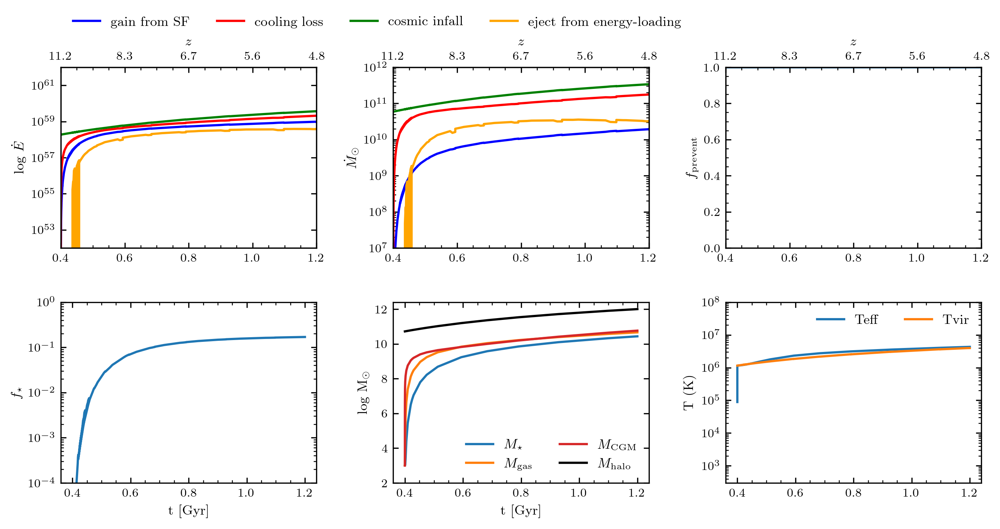

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
y = 0.02  # metallicity enrichment yield (mass in metals produced per solar mass)
fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
C = 0.4

# controls how effective outflowing energy is at preventing inflowing gas
CGM_infall_prevention_constant = 1.0
# ratio of specific energy of ejected gas to CGM gas
CGM_eject_specific_energy_ratio = 1.0
# time, virial temperature, cooling function, depletion time, inflow prevention factor, star formation efficiency
TT_list, Tvir_list, CB_list_1, t_dep_list, fprevent_list, fstar_list = (
    [],
    [],
    [],
    [],
    [],
    [],
)
#
CGM_gain_list, CGM_infall_list, CGM_cool_list, CGM_eject_list = ([], [], [], [])
Eej_dot_list, El_dot_list, Eg_dot_list, Eacc_dot_list = ([], [], [], [])
Z_gain_list, Z_infall_list, Z_cool_list, Z_eject_list = ([], [], [], [])
msdot_list, mgdot_list, mcdot_list, loss_list, CGMacc_list = ([], [], [], [], [])

time_interval = (0.4, 1.2)
mh1e9t_004_05 = explore_halo(1e12 * u.solMass, 0.3, 0.15, time_interval)
plot_halo_evolution(mh1e9t_004_05)

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


# def mass_evolution(t, mass):
#     """Ode to solve the mass evolution of the galaxy

#     Args:
#         t (_type_): _description_
#         mass (_type_): _description_

#     Returns:
#         _type_: _description_
#     """

#     #  t: time (units: Gyr)
#     #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
#     #  energy [5-9] (units: erg): 5 vector of energy of each component/term

#     # get current redshift
#     z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

#     m_gas = mass[0] * u.solMass
#     m_star = mass[1] * u.solMass
#     m_cgm = mass[2] * u.solMass  # Total CGM mass
#     m_metals = mass[3] * u.solMass
#     m_halo = mass[4] * u.solMass  # total halo mass

#     e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
#     e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
#     e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
#     e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
#     e_cgm = mass[9] * u.erg  # Total CGM energy

#     # now, derive relevant quantities
#     t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
#     halo_rvir = virial_radius(z, m_halo).to(u.kpc)
#     halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
#     t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
#     rho_crit = LCDM.critical_density(z)
#     cgm_metallicity = m_metals / m_cgm
#     cgm_metallicity_sol = cgm_metallicity / Z_sol

#     # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

#     # cooling function value at this timestep
#     cooling_lambda = cooling_fn(
#         (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
#     ) * (u.erg * u.cm**3 * u.s**-1)

#     # compute density normalization for power-law density model from CGM mass
#     r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

#     ## Another possible definition of inner radius of CGM
#     # r1 = 10.0*u.kpc

#     # get the central density in units of kpc^-3 ?
#     rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

#     # estimate energy ejection loss timescale and limitit to dynamical time
#     c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
#     t_ejection = halo_rvir / c_sound  # ejection time of hot gas
#     t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
#     # print(t_ejection)
#     # outflow rate assuming that gas flows out at the sound speed
#     # eq. 18 from Carr+ 2023
#     # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
#     dot_e_cgm_out = (
#         max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
#     ).to(u.erg / u.Gyr)

#     # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
#     dot_e_cgm_cool = energy_loss(
#         Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
#     ).to(u.erg / u.Gyr)

#     # speceific energy of eject gas
#     cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
#         e_cgm / m_cgm, kb * halo_vir_temp / mu
#     )

#     # (effective) cooling time of CGM
#     tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
#     #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
#     #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
#     tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
#     dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

#     ##################### moving on to mass evolution
#     # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
#     # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

#     # CGM mass loss due to cooling, eq. 7 from Carr 2023
#     dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
#     # eq. 12, m_gas is kinda the ism
#     dot_m_sfr = m_gas / t_depletion
#     # eq 11 ish
#     dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
#     dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

#     dot_m_halo = halo_infall(z, m_halo)
#     dot_m_cgm_in = fb * dot_m_halo  # eq. 6

#     # CGM eject loss term, eq 10
#     dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

#     ################## calculate the energies that depend on the mass changes

#     # ratio of dot ECGM_in / ECGM_out
#     e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
#         dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
#     ).to(u.dimensionless_unscaled)
#     # equation 19 CGM infall prevention factor
#     f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
#     dot_m_cgm_in *= f_prevent

#     # energy input from SF
#     dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

#     # energy due to accretion, eq 16
#     dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

#     # CGM feedback gain term, eq 9
#     dot_m_ism_wind = dot_m_sfr * eta_m

#     ##################  total Mass, Energy, and Metallicity derivatives
#     dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
#     dot_m_metal = (
#         metal_yield * eta_z * dot_m_sfr
#         + Z_IGM * Z_sol * dot_m_cgm_in
#         - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
#     )
#     dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

#     # limiter
#     if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
#         dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

#     # t_dep_list.append(t_dep.value)

#     derivs = np.array(
#         [
#             dot_m_gas.value,
#             dot_m_sfr.value,
#             dot_m_cgm.value,
#             dot_m_metal.value,
#             dot_m_halo.value,
#             dot_e_ism_wind.value,
#             dot_e_cgm_cool.value,
#             dot_e_cgm_out.value,
#             dot_e_cgm_in.value,
#             dot_e_cgm.value,
#         ]
#     )
#     return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        dot_energy_from_infall = (self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in
        print("dot_energy_from_infall", dot_energy_from_infall)
        print("dot_m_cgm_in", dot_m_cgm_in)
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / dot_energy_from_infall
        ).to(u.dimensionless_unscaled)

        # equation 19 CGM infall prevention factor
        f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            self.mass_evolution,
            self.time_interval,
            masses_initial,
            # method="RK45",
            rtol=1e-3,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.3, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.30) = 3.05e+10 Msol
dot_energy_from_infall 6.549902877451147e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.71013 solMass / Gyr
dot_energy_from_infall 6.549902877451147e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.71013 solMass / Gyr
dot_energy_from_infall 6.549902877451155e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.71017 solMass / Gyr
dot_energy_from_infall 6.549902877451159e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.710175 solMass / Gyr
dot_energy_from_infall 6.54990287745118e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.710266 solMass / Gyr
dot_energy_from_infall 6.549902877451181e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.71028 solMass / Gyr
dot_energy_from_infall 6.54990287745119e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.71032 solMass / Gyr
dot_energy_from_infall 6.

TypeError: only dimensionless scalar quantities can be converted to Python scalars

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


# def mass_evolution(t, mass):
#     """Ode to solve the mass evolution of the galaxy

#     Args:
#         t (_type_): _description_
#         mass (_type_): _description_

#     Returns:
#         _type_: _description_
#     """

#     #  t: time (units: Gyr)
#     #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
#     #  energy [5-9] (units: erg): 5 vector of energy of each component/term

#     # get current redshift
#     z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

#     m_gas = mass[0] * u.solMass
#     m_star = mass[1] * u.solMass
#     m_cgm = mass[2] * u.solMass  # Total CGM mass
#     m_metals = mass[3] * u.solMass
#     m_halo = mass[4] * u.solMass  # total halo mass

#     e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
#     e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
#     e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
#     e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
#     e_cgm = mass[9] * u.erg  # Total CGM energy

#     # now, derive relevant quantities
#     t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
#     halo_rvir = virial_radius(z, m_halo).to(u.kpc)
#     halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
#     t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
#     rho_crit = LCDM.critical_density(z)
#     cgm_metallicity = m_metals / m_cgm
#     cgm_metallicity_sol = cgm_metallicity / Z_sol

#     # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

#     # cooling function value at this timestep
#     cooling_lambda = cooling_fn(
#         (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
#     ) * (u.erg * u.cm**3 * u.s**-1)

#     # compute density normalization for power-law density model from CGM mass
#     r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

#     ## Another possible definition of inner radius of CGM
#     # r1 = 10.0*u.kpc

#     # get the central density in units of kpc^-3 ?
#     rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

#     # estimate energy ejection loss timescale and limitit to dynamical time
#     c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
#     t_ejection = halo_rvir / c_sound  # ejection time of hot gas
#     t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
#     # print(t_ejection)
#     # outflow rate assuming that gas flows out at the sound speed
#     # eq. 18 from Carr+ 2023
#     # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
#     dot_e_cgm_out = (
#         max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
#     ).to(u.erg / u.Gyr)

#     # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
#     dot_e_cgm_cool = energy_loss(
#         Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
#     ).to(u.erg / u.Gyr)

#     # speceific energy of eject gas
#     cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
#         e_cgm / m_cgm, kb * halo_vir_temp / mu
#     )

#     # (effective) cooling time of CGM
#     tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
#     #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
#     #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
#     tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
#     dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

#     ##################### moving on to mass evolution
#     # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
#     # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

#     # CGM mass loss due to cooling, eq. 7 from Carr 2023
#     dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
#     # eq. 12, m_gas is kinda the ism
#     dot_m_sfr = m_gas / t_depletion
#     # eq 11 ish
#     dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
#     dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

#     dot_m_halo = halo_infall(z, m_halo)
#     dot_m_cgm_in = fb * dot_m_halo  # eq. 6

#     # CGM eject loss term, eq 10
#     dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

#     ################## calculate the energies that depend on the mass changes

#     # ratio of dot ECGM_in / ECGM_out
#     e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
#         dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
#     ).to(u.dimensionless_unscaled)
#     # equation 19 CGM infall prevention factor
#     f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
#     dot_m_cgm_in *= f_prevent

#     # energy input from SF
#     dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

#     # energy due to accretion, eq 16
#     dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

#     # CGM feedback gain term, eq 9
#     dot_m_ism_wind = dot_m_sfr * eta_m

#     ##################  total Mass, Energy, and Metallicity derivatives
#     dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
#     dot_m_metal = (
#         metal_yield * eta_z * dot_m_sfr
#         + Z_IGM * Z_sol * dot_m_cgm_in
#         - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
#     )
#     dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

#     # limiter
#     if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
#         dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

#     # t_dep_list.append(t_dep.value)

#     derivs = np.array(
#         [
#             dot_m_gas.value,
#             dot_m_sfr.value,
#             dot_m_cgm.value,
#             dot_m_metal.value,
#             dot_m_halo.value,
#             dot_e_ism_wind.value,
#             dot_e_cgm_cool.value,
#             dot_e_cgm_out.value,
#             dot_e_cgm_in.value,
#             dot_e_cgm.value,
#         ]
#     )
#     return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        dot_energy_from_infall = (self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in
        print("dot_energy_from_infall", dot_energy_from_infall)
        print("dot_m_cgm_in", dot_m_cgm_in)
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / dot_energy_from_infall
        ).to(u.dimensionless_unscaled)
        print("e_ejection_to_infall_ratio", e_ejection_to_infall_ratio)
        # equation 19 CGM infall prevention factor
        f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            self.mass_evolution,
            self.time_interval,
            masses_initial,
            # method="RK45",
            rtol=1e-3,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.3, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.30) = 3.05e+10 Msol
dot_energy_from_infall 6.549902877451147e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.71013 solMass / Gyr
e_ejection_to_infall_ratio inf
dot_energy_from_infall 6.549902877451147e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.71013 solMass / Gyr
e_ejection_to_infall_ratio inf
dot_energy_from_infall 6.549902877451155e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.71017 solMass / Gyr
e_ejection_to_infall_ratio inf
dot_energy_from_infall 6.549902877451159e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.710175 solMass / Gyr
e_ejection_to_infall_ratio inf
dot_energy_from_infall 6.54990287745118e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.710266 solMass / Gyr
e_ejection_to_infall_ratio inf
dot_energy_from_infall 6.549902877451181e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.

TypeError: only dimensionless scalar quantities can be converted to Python scalars

In [ ]:
 1/(6.54990287745119e+20/48890489173.71032)


7.464307500195395e-11

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


# def mass_evolution(t, mass):
#     """Ode to solve the mass evolution of the galaxy

#     Args:
#         t (_type_): _description_
#         mass (_type_): _description_

#     Returns:
#         _type_: _description_
#     """

#     #  t: time (units: Gyr)
#     #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
#     #  energy [5-9] (units: erg): 5 vector of energy of each component/term

#     # get current redshift
#     z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

#     m_gas = mass[0] * u.solMass
#     m_star = mass[1] * u.solMass
#     m_cgm = mass[2] * u.solMass  # Total CGM mass
#     m_metals = mass[3] * u.solMass
#     m_halo = mass[4] * u.solMass  # total halo mass

#     e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
#     e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
#     e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
#     e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
#     e_cgm = mass[9] * u.erg  # Total CGM energy

#     # now, derive relevant quantities
#     t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
#     halo_rvir = virial_radius(z, m_halo).to(u.kpc)
#     halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
#     t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
#     rho_crit = LCDM.critical_density(z)
#     cgm_metallicity = m_metals / m_cgm
#     cgm_metallicity_sol = cgm_metallicity / Z_sol

#     # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

#     # cooling function value at this timestep
#     cooling_lambda = cooling_fn(
#         (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
#     ) * (u.erg * u.cm**3 * u.s**-1)

#     # compute density normalization for power-law density model from CGM mass
#     r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

#     ## Another possible definition of inner radius of CGM
#     # r1 = 10.0*u.kpc

#     # get the central density in units of kpc^-3 ?
#     rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

#     # estimate energy ejection loss timescale and limitit to dynamical time
#     c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
#     t_ejection = halo_rvir / c_sound  # ejection time of hot gas
#     t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
#     # print(t_ejection)
#     # outflow rate assuming that gas flows out at the sound speed
#     # eq. 18 from Carr+ 2023
#     # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
#     dot_e_cgm_out = (
#         max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
#     ).to(u.erg / u.Gyr)

#     # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
#     dot_e_cgm_cool = energy_loss(
#         Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
#     ).to(u.erg / u.Gyr)

#     # speceific energy of eject gas
#     cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
#         e_cgm / m_cgm, kb * halo_vir_temp / mu
#     )

#     # (effective) cooling time of CGM
#     tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
#     #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
#     #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
#     tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
#     dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

#     ##################### moving on to mass evolution
#     # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
#     # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

#     # CGM mass loss due to cooling, eq. 7 from Carr 2023
#     dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
#     # eq. 12, m_gas is kinda the ism
#     dot_m_sfr = m_gas / t_depletion
#     # eq 11 ish
#     dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
#     dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

#     dot_m_halo = halo_infall(z, m_halo)
#     dot_m_cgm_in = fb * dot_m_halo  # eq. 6

#     # CGM eject loss term, eq 10
#     dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

#     ################## calculate the energies that depend on the mass changes

#     # ratio of dot ECGM_in / ECGM_out
#     e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
#         dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
#     ).to(u.dimensionless_unscaled)
#     # equation 19 CGM infall prevention factor
#     f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
#     dot_m_cgm_in *= f_prevent

#     # energy input from SF
#     dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

#     # energy due to accretion, eq 16
#     dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

#     # CGM feedback gain term, eq 9
#     dot_m_ism_wind = dot_m_sfr * eta_m

#     ##################  total Mass, Energy, and Metallicity derivatives
#     dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
#     dot_m_metal = (
#         metal_yield * eta_z * dot_m_sfr
#         + Z_IGM * Z_sol * dot_m_cgm_in
#         - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
#     )
#     dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

#     # limiter
#     if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
#         dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

#     # t_dep_list.append(t_dep.value)

#     derivs = np.array(
#         [
#             dot_m_gas.value,
#             dot_m_sfr.value,
#             dot_m_cgm.value,
#             dot_m_metal.value,
#             dot_m_halo.value,
#             dot_e_ism_wind.value,
#             dot_e_cgm_cool.value,
#             dot_e_cgm_out.value,
#             dot_e_cgm_in.value,
#             dot_e_cgm.value,
#         ]
#     )
#     return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        dot_energy_from_infall = (self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in
        print("dot_energy_from_infall", dot_energy_from_infall)
        print("dot_m_cgm_in", dot_m_cgm_in)
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / dot_energy_from_infall
        ).to(u.dimensionless_unscaled)
        print("e_ejection_to_infall_ratio", e_ejection_to_infall_ratio)
        # equation 19 CGM infall prevention factor
        f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            self.mass_evolution,
            self.time_interval,
            masses_initial,
            # method="RK45",
            rtol=1e-3,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.3, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.30) = 3.05e+10 Msol
dot_energy_from_infall 6.549902877451147e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.71013 solMass / Gyr
e_ejection_to_infall_ratio inf
dot_energy_from_infall 6.549902877451147e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.71013 solMass / Gyr
e_ejection_to_infall_ratio inf
dot_energy_from_infall 6.549902877451155e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.71017 solMass / Gyr
e_ejection_to_infall_ratio inf
dot_energy_from_infall 6.549902877451159e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.710175 solMass / Gyr
e_ejection_to_infall_ratio inf
dot_energy_from_infall 6.54990287745118e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.710266 solMass / Gyr
e_ejection_to_infall_ratio inf
dot_energy_from_infall 6.549902877451181e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.

/home/fabg/.pyenv/versions/3.8.10/lib/python3.8/site-packages/astropy/units/quantity.py:673: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


dot_energy_from_infall 6.549902881991595e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489193.91398 solMass / Gyr
e_ejection_to_infall_ratio inf
dot_energy_from_infall 6.54990289016493e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489230.28362 solMass / Gyr
e_ejection_to_infall_ratio inf
dot_energy_from_infall 6.549902894251852e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489248.469765 solMass / Gyr
e_ejection_to_infall_ratio inf
dot_energy_from_infall 6.549902914688977e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489339.413475 solMass / Gyr
e_ejection_to_infall_ratio inf
dot_energy_from_infall 6.549902918322687e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489355.583534 solMass / Gyr
e_ejection_to_infall_ratio inf
dot_energy_from_infall 6.549902922865006e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489375.79705 solMass / Gyr
e_ejection_to_infall_ratio inf
dot_energy_from_infall 6.549902922865006e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489375.79705 solMass / Gyr
e_ejection_to_infall_ratio inf
dot_

TypeError: only dimensionless scalar quantities can be converted to Python scalars

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


# def mass_evolution(t, mass):
#     """Ode to solve the mass evolution of the galaxy

#     Args:
#         t (_type_): _description_
#         mass (_type_): _description_

#     Returns:
#         _type_: _description_
#     """

#     #  t: time (units: Gyr)
#     #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
#     #  energy [5-9] (units: erg): 5 vector of energy of each component/term

#     # get current redshift
#     z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

#     m_gas = mass[0] * u.solMass
#     m_star = mass[1] * u.solMass
#     m_cgm = mass[2] * u.solMass  # Total CGM mass
#     m_metals = mass[3] * u.solMass
#     m_halo = mass[4] * u.solMass  # total halo mass

#     e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
#     e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
#     e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
#     e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
#     e_cgm = mass[9] * u.erg  # Total CGM energy

#     # now, derive relevant quantities
#     t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
#     halo_rvir = virial_radius(z, m_halo).to(u.kpc)
#     halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
#     t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
#     rho_crit = LCDM.critical_density(z)
#     cgm_metallicity = m_metals / m_cgm
#     cgm_metallicity_sol = cgm_metallicity / Z_sol

#     # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

#     # cooling function value at this timestep
#     cooling_lambda = cooling_fn(
#         (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
#     ) * (u.erg * u.cm**3 * u.s**-1)

#     # compute density normalization for power-law density model from CGM mass
#     r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

#     ## Another possible definition of inner radius of CGM
#     # r1 = 10.0*u.kpc

#     # get the central density in units of kpc^-3 ?
#     rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

#     # estimate energy ejection loss timescale and limitit to dynamical time
#     c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
#     t_ejection = halo_rvir / c_sound  # ejection time of hot gas
#     t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
#     # print(t_ejection)
#     # outflow rate assuming that gas flows out at the sound speed
#     # eq. 18 from Carr+ 2023
#     # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
#     dot_e_cgm_out = (
#         max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
#     ).to(u.erg / u.Gyr)

#     # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
#     dot_e_cgm_cool = energy_loss(
#         Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
#     ).to(u.erg / u.Gyr)

#     # speceific energy of eject gas
#     cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
#         e_cgm / m_cgm, kb * halo_vir_temp / mu
#     )

#     # (effective) cooling time of CGM
#     tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
#     #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
#     #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
#     tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
#     dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

#     ##################### moving on to mass evolution
#     # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
#     # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

#     # CGM mass loss due to cooling, eq. 7 from Carr 2023
#     dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
#     # eq. 12, m_gas is kinda the ism
#     dot_m_sfr = m_gas / t_depletion
#     # eq 11 ish
#     dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
#     dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

#     dot_m_halo = halo_infall(z, m_halo)
#     dot_m_cgm_in = fb * dot_m_halo  # eq. 6

#     # CGM eject loss term, eq 10
#     dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

#     ################## calculate the energies that depend on the mass changes

#     # ratio of dot ECGM_in / ECGM_out
#     e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
#         dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
#     ).to(u.dimensionless_unscaled)
#     # equation 19 CGM infall prevention factor
#     f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
#     dot_m_cgm_in *= f_prevent

#     # energy input from SF
#     dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

#     # energy due to accretion, eq 16
#     dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

#     # CGM feedback gain term, eq 9
#     dot_m_ism_wind = dot_m_sfr * eta_m

#     ##################  total Mass, Energy, and Metallicity derivatives
#     dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
#     dot_m_metal = (
#         metal_yield * eta_z * dot_m_sfr
#         + Z_IGM * Z_sol * dot_m_cgm_in
#         - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
#     )
#     dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

#     # limiter
#     if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
#         dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

#     # t_dep_list.append(t_dep.value)

#     derivs = np.array(
#         [
#             dot_m_gas.value,
#             dot_m_sfr.value,
#             dot_m_cgm.value,
#             dot_m_metal.value,
#             dot_m_halo.value,
#             dot_e_ism_wind.value,
#             dot_e_cgm_cool.value,
#             dot_e_cgm_out.value,
#             dot_e_cgm_in.value,
#             dot_e_cgm.value,
#         ]
#     )
#     return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        dot_energy_from_infall = (self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in
        print("dot_energy_from_infall", dot_energy_from_infall)
        print("dot_m_cgm_in", dot_m_cgm_in)
        print("dot_e_cgm_out", dot_e_cgm_out)
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / dot_energy_from_infall
        ).to(u.dimensionless_unscaled)
        print("e_ejection_to_infall_ratio", e_ejection_to_infall_ratio)
        # equation 19 CGM infall prevention factor
        f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            self.mass_evolution,
            self.time_interval,
            masses_initial,
            # method="RK45",
            rtol=1e-3,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.3, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.30) = 3.05e+10 Msol
dot_energy_from_infall 6.549902877451147e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.71013 solMass / Gyr
dot_e_cgm_out 0.0 erg / Gyr
e_ejection_to_infall_ratio inf
dot_energy_from_infall 6.549902877451147e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.71013 solMass / Gyr
dot_e_cgm_out 0.0 erg / Gyr
e_ejection_to_infall_ratio inf
dot_energy_from_infall 6.549902877451155e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.71017 solMass / Gyr
dot_e_cgm_out 0.0 erg / Gyr
e_ejection_to_infall_ratio inf
dot_energy_from_infall 6.549902877451159e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.710175 solMass / Gyr
dot_e_cgm_out 0.0 erg / Gyr
e_ejection_to_infall_ratio inf
dot_energy_from_infall 6.54990287745118e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.710266 solMass / Gyr
dot_e_cgm_

TypeError: only dimensionless scalar quantities can be converted to Python scalars

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


# def mass_evolution(t, mass):
#     """Ode to solve the mass evolution of the galaxy

#     Args:
#         t (_type_): _description_
#         mass (_type_): _description_

#     Returns:
#         _type_: _description_
#     """

#     #  t: time (units: Gyr)
#     #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
#     #  energy [5-9] (units: erg): 5 vector of energy of each component/term

#     # get current redshift
#     z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

#     m_gas = mass[0] * u.solMass
#     m_star = mass[1] * u.solMass
#     m_cgm = mass[2] * u.solMass  # Total CGM mass
#     m_metals = mass[3] * u.solMass
#     m_halo = mass[4] * u.solMass  # total halo mass

#     e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
#     e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
#     e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
#     e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
#     e_cgm = mass[9] * u.erg  # Total CGM energy

#     # now, derive relevant quantities
#     t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
#     halo_rvir = virial_radius(z, m_halo).to(u.kpc)
#     halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
#     t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
#     rho_crit = LCDM.critical_density(z)
#     cgm_metallicity = m_metals / m_cgm
#     cgm_metallicity_sol = cgm_metallicity / Z_sol

#     # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

#     # cooling function value at this timestep
#     cooling_lambda = cooling_fn(
#         (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
#     ) * (u.erg * u.cm**3 * u.s**-1)

#     # compute density normalization for power-law density model from CGM mass
#     r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

#     ## Another possible definition of inner radius of CGM
#     # r1 = 10.0*u.kpc

#     # get the central density in units of kpc^-3 ?
#     rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

#     # estimate energy ejection loss timescale and limitit to dynamical time
#     c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
#     t_ejection = halo_rvir / c_sound  # ejection time of hot gas
#     t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
#     # print(t_ejection)
#     # outflow rate assuming that gas flows out at the sound speed
#     # eq. 18 from Carr+ 2023
#     # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
#     dot_e_cgm_out = (
#         max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
#     ).to(u.erg / u.Gyr)

#     # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
#     dot_e_cgm_cool = energy_loss(
#         Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
#     ).to(u.erg / u.Gyr)

#     # speceific energy of eject gas
#     cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
#         e_cgm / m_cgm, kb * halo_vir_temp / mu
#     )

#     # (effective) cooling time of CGM
#     tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
#     #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
#     #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
#     tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
#     dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

#     ##################### moving on to mass evolution
#     # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
#     # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

#     # CGM mass loss due to cooling, eq. 7 from Carr 2023
#     dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
#     # eq. 12, m_gas is kinda the ism
#     dot_m_sfr = m_gas / t_depletion
#     # eq 11 ish
#     dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
#     dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

#     dot_m_halo = halo_infall(z, m_halo)
#     dot_m_cgm_in = fb * dot_m_halo  # eq. 6

#     # CGM eject loss term, eq 10
#     dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

#     ################## calculate the energies that depend on the mass changes

#     # ratio of dot ECGM_in / ECGM_out
#     e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
#         dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
#     ).to(u.dimensionless_unscaled)
#     # equation 19 CGM infall prevention factor
#     f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
#     dot_m_cgm_in *= f_prevent

#     # energy input from SF
#     dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

#     # energy due to accretion, eq 16
#     dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

#     # CGM feedback gain term, eq 9
#     dot_m_ism_wind = dot_m_sfr * eta_m

#     ##################  total Mass, Energy, and Metallicity derivatives
#     dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
#     dot_m_metal = (
#         metal_yield * eta_z * dot_m_sfr
#         + Z_IGM * Z_sol * dot_m_cgm_in
#         - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
#     )
#     dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

#     # limiter
#     if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
#         dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

#     # t_dep_list.append(t_dep.value)

#     derivs = np.array(
#         [
#             dot_m_gas.value,
#             dot_m_sfr.value,
#             dot_m_cgm.value,
#             dot_m_metal.value,
#             dot_m_halo.value,
#             dot_e_ism_wind.value,
#             dot_e_cgm_cool.value,
#             dot_e_cgm_out.value,
#             dot_e_cgm_in.value,
#             dot_e_cgm.value,
#         ]
#     )
#     return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        dot_energy_from_infall = (self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in
        print(self.kb, halo_vir_temp, self.mu, dot_m_cgm_in)
        print("dot_energy_from_infall", dot_energy_from_infall)
        print("dot_m_cgm_in", dot_m_cgm_in)
        print("dot_e_cgm_out", dot_e_cgm_out)
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / dot_energy_from_infall
        ).to(u.dimensionless_unscaled)
        print("e_ejection_to_infall_ratio", e_ejection_to_infall_ratio)
        # equation 19 CGM infall prevention factor
        f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            self.mass_evolution,
            self.time_interval,
            masses_initial,
            # method="RK45",
            rtol=1e-3,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.3, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.30) = 3.05e+10 Msol
  Name   = Boltzmann constant
  Value  = 1.380649e-23
  Uncertainty  = 0.0
  Unit  = J / K
  Reference = CODATA 2018 973814.4853318124 K 1.003573154214e-27 kg 48890489173.71013 solMass / Gyr
dot_energy_from_infall 6.549902877451147e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.71013 solMass / Gyr
dot_e_cgm_out 0.0 erg / Gyr
e_ejection_to_infall_ratio inf
  Name   = Boltzmann constant
  Value  = 1.380649e-23
  Uncertainty  = 0.0
  Unit  = J / K
  Reference = CODATA 2018 973814.4853318124 K 1.003573154214e-27 kg 48890489173.71013 solMass / Gyr
dot_energy_from_infall 6.549902877451147e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.71013 solMass / Gyr
dot_e_cgm_out 0.0 erg / Gyr
e_ejection_to_infall_ratio inf
  Name   = Boltzmann constant
  Value  = 1.380649e-23
  Uncertainty  = 0.0
  Uni

/home/fabg/.pyenv/versions/3.8.10/lib/python3.8/site-packages/astropy/units/quantity.py:673: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


  Name   = Boltzmann constant
  Value  = 1.380649e-23
  Uncertainty  = 0.0
  Unit  = J / K
  Reference = CODATA 2018 973814.4853345384 K 1.003573154214e-27 kg 48890489173.91215 solMass / Gyr
dot_energy_from_infall 6.549902877496546e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.91215 solMass / Gyr
dot_e_cgm_out 0.0 erg / Gyr
e_ejection_to_infall_ratio inf
  Name   = Boltzmann constant
  Value  = 1.380649e-23
  Uncertainty  = 0.0
  Unit  = J / K
  Reference = CODATA 2018 973814.4853345384 K 1.003573154214e-27 kg 48890489173.91215 solMass / Gyr
dot_energy_from_infall 6.549902877496546e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.91215 solMass / Gyr
dot_e_cgm_out 0.0 erg / Gyr
e_ejection_to_infall_ratio inf
  Name   = Boltzmann constant
  Value  = 1.380649e-23
  Uncertainty  = 0.0
  Unit  = J / K
  Reference = CODATA 2018 973814.4853394458 K 1.003573154214e-27 kg 48890489174.2758 solMass / Gyr
dot_energy_from_infall 6.549902877578274e+20 J solMass / (Gyr kg)
dot_m_cgm_in 488904891

TypeError: only dimensionless scalar quantities can be converted to Python scalars

In [ ]:
self.kb

NameError: name 'self' is not defined

In [ ]:
consts.k_B

<<class 'astropy.constants.codata2018.CODATA2018'> name='Boltzmann constant' value=1.380649e-23 uncertainty=0.0 unit='J / K' reference='CODATA 2018'>

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


# def mass_evolution(t, mass):
#     """Ode to solve the mass evolution of the galaxy

#     Args:
#         t (_type_): _description_
#         mass (_type_): _description_

#     Returns:
#         _type_: _description_
#     """

#     #  t: time (units: Gyr)
#     #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
#     #  energy [5-9] (units: erg): 5 vector of energy of each component/term

#     # get current redshift
#     z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

#     m_gas = mass[0] * u.solMass
#     m_star = mass[1] * u.solMass
#     m_cgm = mass[2] * u.solMass  # Total CGM mass
#     m_metals = mass[3] * u.solMass
#     m_halo = mass[4] * u.solMass  # total halo mass

#     e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
#     e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
#     e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
#     e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
#     e_cgm = mass[9] * u.erg  # Total CGM energy

#     # now, derive relevant quantities
#     t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
#     halo_rvir = virial_radius(z, m_halo).to(u.kpc)
#     halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
#     t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
#     rho_crit = LCDM.critical_density(z)
#     cgm_metallicity = m_metals / m_cgm
#     cgm_metallicity_sol = cgm_metallicity / Z_sol

#     # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

#     # cooling function value at this timestep
#     cooling_lambda = cooling_fn(
#         (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
#     ) * (u.erg * u.cm**3 * u.s**-1)

#     # compute density normalization for power-law density model from CGM mass
#     r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

#     ## Another possible definition of inner radius of CGM
#     # r1 = 10.0*u.kpc

#     # get the central density in units of kpc^-3 ?
#     rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

#     # estimate energy ejection loss timescale and limitit to dynamical time
#     c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
#     t_ejection = halo_rvir / c_sound  # ejection time of hot gas
#     t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
#     # print(t_ejection)
#     # outflow rate assuming that gas flows out at the sound speed
#     # eq. 18 from Carr+ 2023
#     # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
#     dot_e_cgm_out = (
#         max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
#     ).to(u.erg / u.Gyr)

#     # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
#     dot_e_cgm_cool = energy_loss(
#         Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
#     ).to(u.erg / u.Gyr)

#     # speceific energy of eject gas
#     cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
#         e_cgm / m_cgm, kb * halo_vir_temp / mu
#     )

#     # (effective) cooling time of CGM
#     tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
#     #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
#     #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
#     tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
#     dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

#     ##################### moving on to mass evolution
#     # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
#     # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

#     # CGM mass loss due to cooling, eq. 7 from Carr 2023
#     dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
#     # eq. 12, m_gas is kinda the ism
#     dot_m_sfr = m_gas / t_depletion
#     # eq 11 ish
#     dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
#     dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

#     dot_m_halo = halo_infall(z, m_halo)
#     dot_m_cgm_in = fb * dot_m_halo  # eq. 6

#     # CGM eject loss term, eq 10
#     dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

#     ################## calculate the energies that depend on the mass changes

#     # ratio of dot ECGM_in / ECGM_out
#     e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
#         dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
#     ).to(u.dimensionless_unscaled)
#     # equation 19 CGM infall prevention factor
#     f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
#     dot_m_cgm_in *= f_prevent

#     # energy input from SF
#     dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

#     # energy due to accretion, eq 16
#     dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

#     # CGM feedback gain term, eq 9
#     dot_m_ism_wind = dot_m_sfr * eta_m

#     ##################  total Mass, Energy, and Metallicity derivatives
#     dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
#     dot_m_metal = (
#         metal_yield * eta_z * dot_m_sfr
#         + Z_IGM * Z_sol * dot_m_cgm_in
#         - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
#     )
#     dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

#     # limiter
#     if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
#         dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

#     # t_dep_list.append(t_dep.value)

#     derivs = np.array(
#         [
#             dot_m_gas.value,
#             dot_m_sfr.value,
#             dot_m_cgm.value,
#             dot_m_metal.value,
#             dot_m_halo.value,
#             dot_e_ism_wind.value,
#             dot_e_cgm_cool.value,
#             dot_e_cgm_out.value,
#             dot_e_cgm_in.value,
#             dot_e_cgm.value,
#         ]
#     )
#     return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        dot_energy_from_infall = (self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in
        print([self.kb, halo_vir_temp, self.mu, dot_m_cgm_in])
        print("dot_energy_from_infall", dot_energy_from_infall)
        print("dot_m_cgm_in", dot_m_cgm_in)
        print("dot_e_cgm_out", dot_e_cgm_out)
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / dot_energy_from_infall
        ).to(u.dimensionless_unscaled)
        print("e_ejection_to_infall_ratio", e_ejection_to_infall_ratio)
        # equation 19 CGM infall prevention factor
        f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            self.mass_evolution,
            self.time_interval,
            masses_initial,
            # method="RK45",
            rtol=1e-3,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.3, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.30) = 3.05e+10 Msol
[<<class 'astropy.constants.codata2018.CODATA2018'> name='Boltzmann constant' value=1.380649e-23 uncertainty=0.0 unit='J / K' reference='CODATA 2018'>, <Quantity 973814.48533181 K>, <Quantity 1.00357315e-27 kg>, <Quantity 4.88904892e+10 solMass / Gyr>]
dot_energy_from_infall 6.549902877451147e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.71013 solMass / Gyr
dot_e_cgm_out 0.0 erg / Gyr
e_ejection_to_infall_ratio inf
[<<class 'astropy.constants.codata2018.CODATA2018'> name='Boltzmann constant' value=1.380649e-23 uncertainty=0.0 unit='J / K' reference='CODATA 2018'>, <Quantity 973814.48533181 K>, <Quantity 1.00357315e-27 kg>, <Quantity 4.88904892e+10 solMass / Gyr>]
dot_energy_from_infall 6.549902877451147e+20 J solMass / (Gyr kg)
dot_m_cgm_in 48890489173.71013 solMass / Gyr
dot_e_cgm_out 0

TypeError: only dimensionless scalar quantities can be converted to Python scalars

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


# def mass_evolution(t, mass):
#     """Ode to solve the mass evolution of the galaxy

#     Args:
#         t (_type_): _description_
#         mass (_type_): _description_

#     Returns:
#         _type_: _description_
#     """

#     #  t: time (units: Gyr)
#     #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
#     #  energy [5-9] (units: erg): 5 vector of energy of each component/term

#     # get current redshift
#     z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

#     m_gas = mass[0] * u.solMass
#     m_star = mass[1] * u.solMass
#     m_cgm = mass[2] * u.solMass  # Total CGM mass
#     m_metals = mass[3] * u.solMass
#     m_halo = mass[4] * u.solMass  # total halo mass

#     e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
#     e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
#     e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
#     e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
#     e_cgm = mass[9] * u.erg  # Total CGM energy

#     # now, derive relevant quantities
#     t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
#     halo_rvir = virial_radius(z, m_halo).to(u.kpc)
#     halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
#     t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
#     rho_crit = LCDM.critical_density(z)
#     cgm_metallicity = m_metals / m_cgm
#     cgm_metallicity_sol = cgm_metallicity / Z_sol

#     # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

#     # cooling function value at this timestep
#     cooling_lambda = cooling_fn(
#         (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
#     ) * (u.erg * u.cm**3 * u.s**-1)

#     # compute density normalization for power-law density model from CGM mass
#     r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

#     ## Another possible definition of inner radius of CGM
#     # r1 = 10.0*u.kpc

#     # get the central density in units of kpc^-3 ?
#     rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

#     # estimate energy ejection loss timescale and limitit to dynamical time
#     c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
#     t_ejection = halo_rvir / c_sound  # ejection time of hot gas
#     t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
#     # print(t_ejection)
#     # outflow rate assuming that gas flows out at the sound speed
#     # eq. 18 from Carr+ 2023
#     # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
#     dot_e_cgm_out = (
#         max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
#     ).to(u.erg / u.Gyr)

#     # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
#     dot_e_cgm_cool = energy_loss(
#         Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
#     ).to(u.erg / u.Gyr)

#     # speceific energy of eject gas
#     cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
#         e_cgm / m_cgm, kb * halo_vir_temp / mu
#     )

#     # (effective) cooling time of CGM
#     tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
#     #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
#     #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
#     tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
#     dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

#     ##################### moving on to mass evolution
#     # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
#     # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

#     # CGM mass loss due to cooling, eq. 7 from Carr 2023
#     dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
#     # eq. 12, m_gas is kinda the ism
#     dot_m_sfr = m_gas / t_depletion
#     # eq 11 ish
#     dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
#     dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

#     dot_m_halo = halo_infall(z, m_halo)
#     dot_m_cgm_in = fb * dot_m_halo  # eq. 6

#     # CGM eject loss term, eq 10
#     dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

#     ################## calculate the energies that depend on the mass changes

#     # ratio of dot ECGM_in / ECGM_out
#     e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
#         dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
#     ).to(u.dimensionless_unscaled)
#     # equation 19 CGM infall prevention factor
#     f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
#     dot_m_cgm_in *= f_prevent

#     # energy input from SF
#     dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

#     # energy due to accretion, eq 16
#     dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

#     # CGM feedback gain term, eq 9
#     dot_m_ism_wind = dot_m_sfr * eta_m

#     ##################  total Mass, Energy, and Metallicity derivatives
#     dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
#     dot_m_metal = (
#         metal_yield * eta_z * dot_m_sfr
#         + Z_IGM * Z_sol * dot_m_cgm_in
#         - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
#     )
#     dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

#     # limiter
#     if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
#         dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

#     # t_dep_list.append(t_dep.value)

#     derivs = np.array(
#         [
#             dot_m_gas.value,
#             dot_m_sfr.value,
#             dot_m_cgm.value,
#             dot_m_metal.value,
#             dot_m_halo.value,
#             dot_e_ism_wind.value,
#             dot_e_cgm_cool.value,
#             dot_e_cgm_out.value,
#             dot_e_cgm_in.value,
#             dot_e_cgm.value,
#         ]
#     )
#     return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        dot_energy_from_infall = (self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in
        print([self.kb, halo_vir_temp, self.mu, dot_m_cgm_in])
        print("dot_energy_from_infall", dot_energy_from_infall.to(u.erg * u.Gyr**-1))
        print("dot_m_cgm_in", dot_m_cgm_in)
        print("dot_e_cgm_out", dot_e_cgm_out)
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / dot_energy_from_infall
        ).to(u.dimensionless_unscaled)
        print("e_ejection_to_infall_ratio", e_ejection_to_infall_ratio)
        # equation 19 CGM infall prevention factor
        f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            self.mass_evolution,
            self.time_interval,
            masses_initial,
            # method="RK45",
            rtol=1e-3,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.3, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.30) = 3.05e+10 Msol
[<<class 'astropy.constants.codata2018.CODATA2018'> name='Boltzmann constant' value=1.380649e-23 uncertainty=0.0 unit='J / K' reference='CODATA 2018'>, <Quantity 973814.48533181 K>, <Quantity 1.00357315e-27 kg>, <Quantity 4.88904892e+10 solMass / Gyr>]
dot_energy_from_infall 1.3023891533637427e+58 erg / Gyr
dot_m_cgm_in 48890489173.71013 solMass / Gyr
dot_e_cgm_out 0.0 erg / Gyr
e_ejection_to_infall_ratio inf
[<<class 'astropy.constants.codata2018.CODATA2018'> name='Boltzmann constant' value=1.380649e-23 uncertainty=0.0 unit='J / K' reference='CODATA 2018'>, <Quantity 973814.48533181 K>, <Quantity 1.00357315e-27 kg>, <Quantity 4.88904892e+10 solMass / Gyr>]
dot_energy_from_infall 1.3023891533637427e+58 erg / Gyr
dot_m_cgm_in 48890489173.71013 solMass / Gyr
dot_e_cgm_out 0.0 erg / Gyr
e_eject

TypeError: only dimensionless scalar quantities can be converted to Python scalars

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


# def mass_evolution(t, mass):
#     """Ode to solve the mass evolution of the galaxy

#     Args:
#         t (_type_): _description_
#         mass (_type_): _description_

#     Returns:
#         _type_: _description_
#     """

#     #  t: time (units: Gyr)
#     #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
#     #  energy [5-9] (units: erg): 5 vector of energy of each component/term

#     # get current redshift
#     z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

#     m_gas = mass[0] * u.solMass
#     m_star = mass[1] * u.solMass
#     m_cgm = mass[2] * u.solMass  # Total CGM mass
#     m_metals = mass[3] * u.solMass
#     m_halo = mass[4] * u.solMass  # total halo mass

#     e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
#     e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
#     e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
#     e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
#     e_cgm = mass[9] * u.erg  # Total CGM energy

#     # now, derive relevant quantities
#     t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
#     halo_rvir = virial_radius(z, m_halo).to(u.kpc)
#     halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
#     t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
#     rho_crit = LCDM.critical_density(z)
#     cgm_metallicity = m_metals / m_cgm
#     cgm_metallicity_sol = cgm_metallicity / Z_sol

#     # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

#     # cooling function value at this timestep
#     cooling_lambda = cooling_fn(
#         (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
#     ) * (u.erg * u.cm**3 * u.s**-1)

#     # compute density normalization for power-law density model from CGM mass
#     r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

#     ## Another possible definition of inner radius of CGM
#     # r1 = 10.0*u.kpc

#     # get the central density in units of kpc^-3 ?
#     rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

#     # estimate energy ejection loss timescale and limitit to dynamical time
#     c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
#     t_ejection = halo_rvir / c_sound  # ejection time of hot gas
#     t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
#     # print(t_ejection)
#     # outflow rate assuming that gas flows out at the sound speed
#     # eq. 18 from Carr+ 2023
#     # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
#     dot_e_cgm_out = (
#         max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
#     ).to(u.erg / u.Gyr)

#     # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
#     dot_e_cgm_cool = energy_loss(
#         Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
#     ).to(u.erg / u.Gyr)

#     # speceific energy of eject gas
#     cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
#         e_cgm / m_cgm, kb * halo_vir_temp / mu
#     )

#     # (effective) cooling time of CGM
#     tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
#     #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
#     #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
#     tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
#     dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

#     ##################### moving on to mass evolution
#     # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
#     # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

#     # CGM mass loss due to cooling, eq. 7 from Carr 2023
#     dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
#     # eq. 12, m_gas is kinda the ism
#     dot_m_sfr = m_gas / t_depletion
#     # eq 11 ish
#     dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
#     dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

#     dot_m_halo = halo_infall(z, m_halo)
#     dot_m_cgm_in = fb * dot_m_halo  # eq. 6

#     # CGM eject loss term, eq 10
#     dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

#     ################## calculate the energies that depend on the mass changes

#     # ratio of dot ECGM_in / ECGM_out
#     e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
#         dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
#     ).to(u.dimensionless_unscaled)
#     # equation 19 CGM infall prevention factor
#     f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
#     dot_m_cgm_in *= f_prevent

#     # energy input from SF
#     dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

#     # energy due to accretion, eq 16
#     dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

#     # CGM feedback gain term, eq 9
#     dot_m_ism_wind = dot_m_sfr * eta_m

#     ##################  total Mass, Energy, and Metallicity derivatives
#     dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
#     dot_m_metal = (
#         metal_yield * eta_z * dot_m_sfr
#         + Z_IGM * Z_sol * dot_m_cgm_in
#         - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
#     )
#     dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

#     # limiter
#     if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
#         dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

#     # t_dep_list.append(t_dep.value)

#     derivs = np.array(
#         [
#             dot_m_gas.value,
#             dot_m_sfr.value,
#             dot_m_cgm.value,
#             dot_m_metal.value,
#             dot_m_halo.value,
#             dot_e_ism_wind.value,
#             dot_e_cgm_cool.value,
#             dot_e_cgm_out.value,
#             dot_e_cgm_in.value,
#             dot_e_cgm.value,
#         ]
#     )
#     return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            max(
                e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu,
                0.0 * u.erg / t_ejection,
            )
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        dot_energy_from_infall = (self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in
        print([self.kb, halo_vir_temp, self.mu, dot_m_cgm_in])
        print("dot_energy_from_infall", dot_energy_from_infall.to(u.erg * u.Gyr**-1))
        print("dot_m_cgm_in", dot_m_cgm_in)
        print("dot_e_cgm_out", dot_e_cgm_out)
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / dot_energy_from_infall
        ).to(u.dimensionless_unscaled)
        print("e_ejection_to_infall_ratio", e_ejection_to_infall_ratio)
        # equation 19 CGM infall prevention factor
        f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            self.mass_evolution,
            self.time_interval,
            masses_initial,
            # method="RK45",
            rtol=1e-3,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.3, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.30) = 3.05e+10 Msol


UnitConversionError: Can only apply 'greater' function to quantities with compatible dimensions

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


# def mass_evolution(t, mass):
#     """Ode to solve the mass evolution of the galaxy

#     Args:
#         t (_type_): _description_
#         mass (_type_): _description_

#     Returns:
#         _type_: _description_
#     """

#     #  t: time (units: Gyr)
#     #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
#     #  energy [5-9] (units: erg): 5 vector of energy of each component/term

#     # get current redshift
#     z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

#     m_gas = mass[0] * u.solMass
#     m_star = mass[1] * u.solMass
#     m_cgm = mass[2] * u.solMass  # Total CGM mass
#     m_metals = mass[3] * u.solMass
#     m_halo = mass[4] * u.solMass  # total halo mass

#     e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
#     e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
#     e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
#     e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
#     e_cgm = mass[9] * u.erg  # Total CGM energy

#     # now, derive relevant quantities
#     t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
#     halo_rvir = virial_radius(z, m_halo).to(u.kpc)
#     halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
#     t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
#     rho_crit = LCDM.critical_density(z)
#     cgm_metallicity = m_metals / m_cgm
#     cgm_metallicity_sol = cgm_metallicity / Z_sol

#     # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

#     # cooling function value at this timestep
#     cooling_lambda = cooling_fn(
#         (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
#     ) * (u.erg * u.cm**3 * u.s**-1)

#     # compute density normalization for power-law density model from CGM mass
#     r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

#     ## Another possible definition of inner radius of CGM
#     # r1 = 10.0*u.kpc

#     # get the central density in units of kpc^-3 ?
#     rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

#     # estimate energy ejection loss timescale and limitit to dynamical time
#     c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
#     t_ejection = halo_rvir / c_sound  # ejection time of hot gas
#     t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
#     # print(t_ejection)
#     # outflow rate assuming that gas flows out at the sound speed
#     # eq. 18 from Carr+ 2023
#     # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
#     dot_e_cgm_out = (
#         max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
#     ).to(u.erg / u.Gyr)

#     # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
#     dot_e_cgm_cool = energy_loss(
#         Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
#     ).to(u.erg / u.Gyr)

#     # speceific energy of eject gas
#     cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
#         e_cgm / m_cgm, kb * halo_vir_temp / mu
#     )

#     # (effective) cooling time of CGM
#     tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
#     #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
#     #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
#     tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
#     dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

#     ##################### moving on to mass evolution
#     # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
#     # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

#     # CGM mass loss due to cooling, eq. 7 from Carr 2023
#     dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
#     # eq. 12, m_gas is kinda the ism
#     dot_m_sfr = m_gas / t_depletion
#     # eq 11 ish
#     dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
#     dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

#     dot_m_halo = halo_infall(z, m_halo)
#     dot_m_cgm_in = fb * dot_m_halo  # eq. 6

#     # CGM eject loss term, eq 10
#     dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

#     ################## calculate the energies that depend on the mass changes

#     # ratio of dot ECGM_in / ECGM_out
#     e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
#         dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
#     ).to(u.dimensionless_unscaled)
#     # equation 19 CGM infall prevention factor
#     f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
#     dot_m_cgm_in *= f_prevent

#     # energy input from SF
#     dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

#     # energy due to accretion, eq 16
#     dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

#     # CGM feedback gain term, eq 9
#     dot_m_ism_wind = dot_m_sfr * eta_m

#     ##################  total Mass, Energy, and Metallicity derivatives
#     dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
#     dot_m_metal = (
#         metal_yield * eta_z * dot_m_sfr
#         + Z_IGM * Z_sol * dot_m_cgm_in
#         - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
#     )
#     dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

#     # limiter
#     if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
#         dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

#     # t_dep_list.append(t_dep.value)

#     derivs = np.array(
#         [
#             dot_m_gas.value,
#             dot_m_sfr.value,
#             dot_m_cgm.value,
#             dot_m_metal.value,
#             dot_m_halo.value,
#             dot_e_ism_wind.value,
#             dot_e_cgm_cool.value,
#             dot_e_cgm_out.value,
#             dot_e_cgm_in.value,
#             dot_e_cgm.value,
#         ]
#     )
#     return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        print(halo_vir_temp)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        dot_energy_from_infall = (self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in
        print([self.kb, halo_vir_temp, self.mu, dot_m_cgm_in])
        print("dot_energy_from_infall", dot_energy_from_infall.to(u.erg * u.Gyr**-1))
        print("dot_m_cgm_in", dot_m_cgm_in)
        print("dot_e_cgm_out", dot_e_cgm_out)
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / dot_energy_from_infall
        ).to(u.dimensionless_unscaled)
        print("e_ejection_to_infall_ratio", e_ejection_to_infall_ratio)
        # equation 19 CGM infall prevention factor
        f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            self.mass_evolution,
            self.time_interval,
            masses_initial,
            # method="RK45",
            rtol=1e-3,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.3, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.30) = 3.05e+10 Msol
973814.4853318124 K
[<<class 'astropy.constants.codata2018.CODATA2018'> name='Boltzmann constant' value=1.380649e-23 uncertainty=0.0 unit='J / K' reference='CODATA 2018'>, <Quantity 973814.48533181 K>, <Quantity 1.00357315e-27 kg>, <Quantity 4.88904892e+10 solMass / Gyr>]
dot_energy_from_infall 1.3023891533637427e+58 erg / Gyr
dot_m_cgm_in 48890489173.71013 solMass / Gyr
dot_e_cgm_out 0.0 erg / Gyr
e_ejection_to_infall_ratio inf
973814.4853318124 K
[<<class 'astropy.constants.codata2018.CODATA2018'> name='Boltzmann constant' value=1.380649e-23 uncertainty=0.0 unit='J / K' reference='CODATA 2018'>, <Quantity 973814.48533181 K>, <Quantity 1.00357315e-27 kg>, <Quantity 4.88904892e+10 solMass / Gyr>]
dot_energy_from_infall 1.3023891533637427e+58 erg / Gyr
dot_m_cgm_in 48890489173.71013 solMass /

TypeError: only dimensionless scalar quantities can be converted to Python scalars

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


# def mass_evolution(t, mass):
#     """Ode to solve the mass evolution of the galaxy

#     Args:
#         t (_type_): _description_
#         mass (_type_): _description_

#     Returns:
#         _type_: _description_
#     """

#     #  t: time (units: Gyr)
#     #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
#     #  energy [5-9] (units: erg): 5 vector of energy of each component/term

#     # get current redshift
#     z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

#     m_gas = mass[0] * u.solMass
#     m_star = mass[1] * u.solMass
#     m_cgm = mass[2] * u.solMass  # Total CGM mass
#     m_metals = mass[3] * u.solMass
#     m_halo = mass[4] * u.solMass  # total halo mass

#     e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
#     e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
#     e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
#     e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
#     e_cgm = mass[9] * u.erg  # Total CGM energy

#     # now, derive relevant quantities
#     t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
#     halo_rvir = virial_radius(z, m_halo).to(u.kpc)
#     halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
#     t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
#     rho_crit = LCDM.critical_density(z)
#     cgm_metallicity = m_metals / m_cgm
#     cgm_metallicity_sol = cgm_metallicity / Z_sol

#     # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

#     # cooling function value at this timestep
#     cooling_lambda = cooling_fn(
#         (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
#     ) * (u.erg * u.cm**3 * u.s**-1)

#     # compute density normalization for power-law density model from CGM mass
#     r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

#     ## Another possible definition of inner radius of CGM
#     # r1 = 10.0*u.kpc

#     # get the central density in units of kpc^-3 ?
#     rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

#     # estimate energy ejection loss timescale and limitit to dynamical time
#     c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
#     t_ejection = halo_rvir / c_sound  # ejection time of hot gas
#     t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
#     # print(t_ejection)
#     # outflow rate assuming that gas flows out at the sound speed
#     # eq. 18 from Carr+ 2023
#     # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
#     dot_e_cgm_out = (
#         max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
#     ).to(u.erg / u.Gyr)

#     # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
#     dot_e_cgm_cool = energy_loss(
#         Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
#     ).to(u.erg / u.Gyr)

#     # speceific energy of eject gas
#     cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
#         e_cgm / m_cgm, kb * halo_vir_temp / mu
#     )

#     # (effective) cooling time of CGM
#     tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
#     #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
#     #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
#     tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
#     dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

#     ##################### moving on to mass evolution
#     # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
#     # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

#     # CGM mass loss due to cooling, eq. 7 from Carr 2023
#     dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
#     # eq. 12, m_gas is kinda the ism
#     dot_m_sfr = m_gas / t_depletion
#     # eq 11 ish
#     dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
#     dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

#     dot_m_halo = halo_infall(z, m_halo)
#     dot_m_cgm_in = fb * dot_m_halo  # eq. 6

#     # CGM eject loss term, eq 10
#     dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

#     ################## calculate the energies that depend on the mass changes

#     # ratio of dot ECGM_in / ECGM_out
#     e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
#         dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
#     ).to(u.dimensionless_unscaled)
#     # equation 19 CGM infall prevention factor
#     f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
#     dot_m_cgm_in *= f_prevent

#     # energy input from SF
#     dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

#     # energy due to accretion, eq 16
#     dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

#     # CGM feedback gain term, eq 9
#     dot_m_ism_wind = dot_m_sfr * eta_m

#     ##################  total Mass, Energy, and Metallicity derivatives
#     dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
#     dot_m_metal = (
#         metal_yield * eta_z * dot_m_sfr
#         + Z_IGM * Z_sol * dot_m_cgm_in
#         - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
#     )
#     dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

#     # limiter
#     if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
#         dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

#     # t_dep_list.append(t_dep.value)

#     derivs = np.array(
#         [
#             dot_m_gas.value,
#             dot_m_sfr.value,
#             dot_m_cgm.value,
#             dot_m_metal.value,
#             dot_m_halo.value,
#             dot_e_ism_wind.value,
#             dot_e_cgm_cool.value,
#             dot_e_cgm_out.value,
#             dot_e_cgm_in.value,
#             dot_e_cgm.value,
#         ]
#     )
#     return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        print("halo_vir_temp ", halo_vir_temp)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        dot_energy_from_infall = (self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in
        print([self.kb, halo_vir_temp, self.mu, dot_m_cgm_in])
        print("dot_energy_from_infall", dot_energy_from_infall.to(u.erg * u.Gyr**-1))
        print("dot_m_cgm_in", dot_m_cgm_in)
        print("dot_e_cgm_out", dot_e_cgm_out)
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / dot_energy_from_infall
        ).to(u.dimensionless_unscaled)
        print("e_ejection_to_infall_ratio", e_ejection_to_infall_ratio)
        # equation 19 CGM infall prevention factor
        f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            self.mass_evolution,
            self.time_interval,
            masses_initial,
            # method="RK45",
            rtol=1e-3,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.3, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.30) = 3.05e+10 Msol
halo_vir_temp  973814.4853318124 K
[<<class 'astropy.constants.codata2018.CODATA2018'> name='Boltzmann constant' value=1.380649e-23 uncertainty=0.0 unit='J / K' reference='CODATA 2018'>, <Quantity 973814.48533181 K>, <Quantity 1.00357315e-27 kg>, <Quantity 4.88904892e+10 solMass / Gyr>]
dot_energy_from_infall 1.3023891533637427e+58 erg / Gyr
dot_m_cgm_in 48890489173.71013 solMass / Gyr
dot_e_cgm_out 0.0 erg / Gyr
e_ejection_to_infall_ratio inf
halo_vir_temp  973814.4853318124 K
[<<class 'astropy.constants.codata2018.CODATA2018'> name='Boltzmann constant' value=1.380649e-23 uncertainty=0.0 unit='J / K' reference='CODATA 2018'>, <Quantity 973814.48533181 K>, <Quantity 1.00357315e-27 kg>, <Quantity 4.88904892e+10 solMass / Gyr>]
dot_energy_from_infall 1.3023891533637427e+58 erg / Gyr
dot_m_cgm_

TypeError: only dimensionless scalar quantities can be converted to Python scalars

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


# def mass_evolution(t, mass):
#     """Ode to solve the mass evolution of the galaxy

#     Args:
#         t (_type_): _description_
#         mass (_type_): _description_

#     Returns:
#         _type_: _description_
#     """

#     #  t: time (units: Gyr)
#     #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
#     #  energy [5-9] (units: erg): 5 vector of energy of each component/term

#     # get current redshift
#     z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

#     m_gas = mass[0] * u.solMass
#     m_star = mass[1] * u.solMass
#     m_cgm = mass[2] * u.solMass  # Total CGM mass
#     m_metals = mass[3] * u.solMass
#     m_halo = mass[4] * u.solMass  # total halo mass

#     e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
#     e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
#     e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
#     e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
#     e_cgm = mass[9] * u.erg  # Total CGM energy

#     # now, derive relevant quantities
#     t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
#     halo_rvir = virial_radius(z, m_halo).to(u.kpc)
#     halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
#     t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
#     rho_crit = LCDM.critical_density(z)
#     cgm_metallicity = m_metals / m_cgm
#     cgm_metallicity_sol = cgm_metallicity / Z_sol

#     # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

#     # cooling function value at this timestep
#     cooling_lambda = cooling_fn(
#         (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
#     ) * (u.erg * u.cm**3 * u.s**-1)

#     # compute density normalization for power-law density model from CGM mass
#     r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

#     ## Another possible definition of inner radius of CGM
#     # r1 = 10.0*u.kpc

#     # get the central density in units of kpc^-3 ?
#     rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

#     # estimate energy ejection loss timescale and limitit to dynamical time
#     c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
#     t_ejection = halo_rvir / c_sound  # ejection time of hot gas
#     t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
#     # print(t_ejection)
#     # outflow rate assuming that gas flows out at the sound speed
#     # eq. 18 from Carr+ 2023
#     # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
#     dot_e_cgm_out = (
#         max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
#     ).to(u.erg / u.Gyr)

#     # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
#     dot_e_cgm_cool = energy_loss(
#         Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
#     ).to(u.erg / u.Gyr)

#     # speceific energy of eject gas
#     cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
#         e_cgm / m_cgm, kb * halo_vir_temp / mu
#     )

#     # (effective) cooling time of CGM
#     tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
#     #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
#     #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
#     tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
#     dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

#     ##################### moving on to mass evolution
#     # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
#     # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

#     # CGM mass loss due to cooling, eq. 7 from Carr 2023
#     dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
#     # eq. 12, m_gas is kinda the ism
#     dot_m_sfr = m_gas / t_depletion
#     # eq 11 ish
#     dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
#     dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

#     dot_m_halo = halo_infall(z, m_halo)
#     dot_m_cgm_in = fb * dot_m_halo  # eq. 6

#     # CGM eject loss term, eq 10
#     dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

#     ################## calculate the energies that depend on the mass changes

#     # ratio of dot ECGM_in / ECGM_out
#     e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
#         dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
#     ).to(u.dimensionless_unscaled)
#     # equation 19 CGM infall prevention factor
#     f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
#     dot_m_cgm_in *= f_prevent

#     # energy input from SF
#     dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

#     # energy due to accretion, eq 16
#     dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

#     # CGM feedback gain term, eq 9
#     dot_m_ism_wind = dot_m_sfr * eta_m

#     ##################  total Mass, Energy, and Metallicity derivatives
#     dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
#     dot_m_metal = (
#         metal_yield * eta_z * dot_m_sfr
#         + Z_IGM * Z_sol * dot_m_cgm_in
#         - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
#     )
#     dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

#     # limiter
#     if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
#         dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

#     # t_dep_list.append(t_dep.value)

#     derivs = np.array(
#         [
#             dot_m_gas.value,
#             dot_m_sfr.value,
#             dot_m_cgm.value,
#             dot_m_metal.value,
#             dot_m_halo.value,
#             dot_e_ism_wind.value,
#             dot_e_cgm_cool.value,
#             dot_e_cgm_out.value,
#             dot_e_cgm_in.value,
#             dot_e_cgm.value,
#         ]
#     )
#     return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        print("halo_vir_temp ", halo_vir_temp)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        dot_energy_from_infall = (self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in
        print([self.kb, halo_vir_temp, self.mu, dot_m_cgm_in])
        print("dot_energy_from_infall", dot_energy_from_infall.to(u.erg * u.Gyr**-1))
        print("dot_m_cgm_in", dot_m_cgm_in)
        print("dot_e_cgm_out", dot_e_cgm_out)
        e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (
            dot_e_cgm_out / dot_energy_from_infall
        ).to(u.dimensionless_unscaled)
        print("e_ejection_to_infall_ratio", e_ejection_to_infall_ratio)
        # equation 19 CGM infall prevention factor
        f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            self.mass_evolution,
            self.time_interval,
            masses_initial,
            # method="RK45",
            rtol=1e-3,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.3, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.30) = 3.05e+10 Msol
halo_vir_temp  973814.4853318124 K
[<<class 'astropy.constants.codata2018.CODATA2018'> name='Boltzmann constant' value=1.380649e-23 uncertainty=0.0 unit='J / K' reference='CODATA 2018'>, <Quantity 973814.48533181 K>, <Quantity 1.00357315e-27 kg>, <Quantity 4.88904892e+10 solMass / Gyr>]
dot_energy_from_infall 1.3023891533637427e+58 erg / Gyr
dot_m_cgm_in 48890489173.71013 solMass / Gyr
dot_e_cgm_out 0.0 erg / Gyr
e_ejection_to_infall_ratio inf
halo_vir_temp  973814.4853318124 K
[<<class 'astropy.constants.codata2018.CODATA2018'> name='Boltzmann constant' value=1.380649e-23 uncertainty=0.0 unit='J / K' reference='CODATA 2018'>, <Quantity 973814.48533181 K>, <Quantity 1.00357315e-27 kg>, <Quantity 4.88904892e+10 solMass / Gyr>]
dot_energy_from_infall 1.3023891533637427e+58 erg / Gyr
dot_m_cgm_

TypeError: only dimensionless scalar quantities can be converted to Python scalars

In [ ]:
min(0, inf)

NameError: name 'inf' is not defined

In [ ]:
min(0, 1 / 0)

ZeroDivisionError: division by zero

In [ ]:
min(0, 1 / 0.0)

ZeroDivisionError: float division by zero

In [ ]:
# 1D galaxy model that produces a self-consistent model of
# the gas, stellar, and CGM contents for galaxies.
# Takes bounds on time and initial values for masses as inputs.

eta_m = 0.5  # mass-loading factor
eta_e = 0.1  # energy-loading factor
eta_z = 0.3  # metallicity-loading factor
# metallicity enrichment yield (mass in metals produced per solar mass)
metal_yield = 0.02

fb = 0.16  # universal baryon fraction
Delc = 200  # overdensity
G = consts.G  # Gravitational Constant
kb = consts.k_B  # Boltzmann constant
mp = consts.m_p  # mass of a proton (Hydrogen mass)
Z_sol = 0.0134  # solar metallicty
Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
mu = 0.6 * mp  # mean molecular weight
alpha = 1.4  # density power-law index
exp = 0.0  # T_depletion power-law
dep_time_norm = 0.4  # depletion time prefactor

cgm_ejecti_specific_energy_ratio = 1
cgm_infall_prevention_const = 1


def custom_mass_loading(mhalo, A=1, alpha=1.4):
    """mass loading factor as a function of halo mass"""
    return A * (mhalo / (1e12 * u.solMass)) ** (-alpha)


def t_ff(r, Rvir, mhalo):
    """free-fall time as a function of radius

    Args:
        r (_type_): radius
        Rvir (_type_): virial radius
        mhalo (_type_): halo mass

    Returns:
        _type_: _description_
    """
    # Menc = mhalo*(r/Rvir)**3
    v_circ = np.sqrt(G * mhalo / Rvir) * 1.3
    return r / v_circ


def depletion_time(z, mstar, exp, dep_time_norm):
    """depletion time (power-law),
    eq. 13 from Carr 2023

    Args:
        z (_type_): redshift
        mstar (_type_): mass of galaxy in solar mass
        exp (_type_): _description_
        dep_time_norm (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    return dep_time_norm * tH * (mstar / (4e10 * u.solMass)) ** (-exp)


def depletion_time_McGaugh(z, mstar):
    """depletion time fit from McGaugh observations

    Args:
        z (_type_): _description_
        mstar (_type_): _description_

    Returns:
        _type_: _description_
    """
    tH = (1 / LCDM.H(z=z)).to(u.Gyr)
    tH0 = (1 / LCDM.H(z=0)).to(u.Gyr)
    if mstar < 5e7:
        tdep = 10 ** (4.92 - 0.37 * np.log10(5e7)) * (tH / tH0)
    else:
        tdep = 10 ** (4.92 - 0.37 * np.log10(mstar)) * (tH / tH0)
    return tdep


def virial_radius(z, mhalo, Delc=200):
    """Halo virial radius, classical 200 topahat overdensity
    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mhalo / (LCDM.critical_density(z) * (4 / 3) * np.pi * Delc)) ** (1 / 3)


def halo_infall(z, mhalo):
    """halo mass inflows, from # d M_{halo} / dt (Dekel et al 2009)
    also, Carr 2023 Eq 4

    Args:
        z (_type_): _description_
        mhalo (_type_): _description_

    Returns:
        _type_: \dot{M}_{halo}
    """
    return (
        0.47
        * mhalo
        * (mhalo / (1e12 * u.solMass)) ** (0.15)
        * ((1 + z) / 3) ** (2.25)
        * u.Gyr ** (-1)
    ).to(u.solMass / u.Gyr)


def virial_T(mhalo, Rvir):
    """Halo virial temp

    Args:
        mhalo (_type_): halo mass
        Rvir (_type_): halo virial radius

    Returns:
        _type_: virial temperture
    """
    return (2 / 5) * ((G * mhalo * mp) / (Rvir * kb))


def density0(mCGM, r1, Rvir, alpha=1.4):
    """assuming rho = rho0 * (r/r1)^-alpha, this function computes rho0

    Args:
        mCGM (_type_): total mass of the CGM
        alpha (_type_): some power-law index
        r1 (_type_): _description_
        Rvir (_type_): _description_

    Returns:
        _type_: _description_
    """
    return (mCGM * (3 - alpha)) / (
        (4 * np.pi * r1 ** (3) * ((Rvir / r1) ** (3 - alpha) - 1))
    )


def energy_gain(eta_e, mstar_dot):
    """energy associated with SN-powered galactic winds,
    Carr 2023 Eq 17

    Args:
        eta_e (_type_): _description_
        mstar_dot (_type_): _description_

    Returns:
        _type_: _description_
    """
    norm = 100  # per 100 solar masses
    e_perSNE = 1e51 * u.erg
    return (eta_e * (mstar_dot) * (e_perSNE / (norm * u.solMass))).to(u.erg * u.Gyr**-1)


def energy_loss(Lamb, Rvir, r1, rho0):
    """radiative energy loss from the CGM
    Equation 3 from Carr 2023

    Args:
        Lamb (_type_): cooling function
        Rvir (_type_): virial radius
        r1 (_type_): characteristic radius
        rho0 (_type_): central density of the CGM

    Returns:
        _type_: _description_
    """
    return (
        (4 * np.pi * ((rho0 / mu) ** 2) * (r1**3))
        * (Lamb)
        * (((Rvir / r1) ** (3 - 2 * alpha) - 1) / (3 - 2 * alpha))
    )


def halo_mass_evol(t, mass):
    """
    # Halo mass evolution called by initial_mhalo to estimate initial halo mass at arbitrary redshift
    """
    mhalo = mass * u.solMass
    #    z = np.sqrt((28/t) - 1) - 1 # cosmological redshift
    z = cosmology.z_at_value(LCDM.age, t * u.Gyr)
    mhalo_dot = halo_infall(z, mhalo)
    return -mhalo_dot


def initial_mhalo(mhalo_z0, time_interval):
    """finds initial halo mass at the left edge of the time interval

    Args:
        mhalo_z0 (_type_): _description_
        time_interval (_type_): _description_

    Returns:
        _type_: _description_
    """

    mass_initial = np.array([mhalo_z0.value])
    sol_0 = solve_ivp(halo_mass_evol, time_interval, mass_initial)
    return sol_0.y[0][-1]  # return the last value of the solution


# def mass_evolution(t, mass):
#     """Ode to solve the mass evolution of the galaxy

#     Args:
#         t (_type_): _description_
#         mass (_type_): _description_

#     Returns:
#         _type_: _description_
#     """

#     #  t: time (units: Gyr)
#     #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
#     #  energy [5-9] (units: erg): 5 vector of energy of each component/term

#     # get current redshift
#     z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

#     m_gas = mass[0] * u.solMass
#     m_star = mass[1] * u.solMass
#     m_cgm = mass[2] * u.solMass  # Total CGM mass
#     m_metals = mass[3] * u.solMass
#     m_halo = mass[4] * u.solMass  # total halo mass

#     e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
#     e_cgm_cool = mass[6] * u.erg  # Energy loss from gas precipitation onto the Galaxy
#     e_cgm_out = mass[7] * u.erg  # Energy loss from mass ejected from the CGM into IGM
#     e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
#     e_cgm = mass[9] * u.erg  # Total CGM energy

#     # now, derive relevant quantities
#     t_depletion = depletion_time(z, m_star, exp, dep_time_norm)
#     halo_rvir = virial_radius(z, m_halo).to(u.kpc)
#     halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
#     t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
#     rho_crit = LCDM.critical_density(z)
#     cgm_metallicity = m_metals / m_cgm
#     cgm_metallicity_sol = cgm_metallicity / Z_sol

#     # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

#     # cooling function value at this timestep
#     cooling_lambda = cooling_fn(
#         (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
#     ) * (u.erg * u.cm**3 * u.s**-1)

#     # compute density normalization for power-law density model from CGM mass
#     r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

#     ## Another possible definition of inner radius of CGM
#     # r1 = 10.0*u.kpc

#     # get the central density in units of kpc^-3 ?
#     rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=alpha)

#     # estimate energy ejection loss timescale and limitit to dynamical time
#     c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
#     t_ejection = halo_rvir / c_sound  # ejection time of hot gas
#     t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)
#     # print(t_ejection)
#     # outflow rate assuming that gas flows out at the sound speed
#     # eq. 18 from Carr+ 2023
#     # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
#     dot_e_cgm_out = (
#         max(e_cgm - kb * halo_vir_temp * m_cgm / mu, 0.0 * u.erg) / t_ejection
#     ).to(u.erg / u.Gyr)

#     # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
#     dot_e_cgm_cool = energy_loss(
#         Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
#     ).to(u.erg / u.Gyr)

#     # speceific energy of eject gas
#     cgm_specific_e = cgm_ejecti_specific_energy_ratio * max(
#         e_cgm / m_cgm, kb * halo_vir_temp / mu
#     )

#     # (effective) cooling time of CGM
#     tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
#     #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
#     #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
#     tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
#     dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

#     ##################### moving on to mass evolution
#     # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
#     # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

#     # CGM mass loss due to cooling, eq. 7 from Carr 2023
#     dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
#     # eq. 12, m_gas is kinda the ism
#     dot_m_sfr = m_gas / t_depletion
#     # eq 11 ish
#     dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + eta_m)).to(u.solMass / u.Gyr)
#     dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

#     dot_m_halo = halo_infall(z, m_halo)
#     dot_m_cgm_in = fb * dot_m_halo  # eq. 6

#     # CGM eject loss term, eq 10
#     dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

#     ################## calculate the energies that depend on the mass changes

#     # ratio of dot ECGM_in / ECGM_out
#     e_ejection_to_infall_ratio = cgm_infall_prevention_const / (
#         dot_e_cgm_out / ((kb * halo_vir_temp / mu) * dot_m_cgm_in)
#     ).to(u.dimensionless_unscaled)
#     # equation 19 CGM infall prevention factor
#     f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
#     dot_m_cgm_in *= f_prevent

#     # energy input from SF
#     dot_e_ism_wind = energy_gain(eta_e, dot_m_sfr)

#     # energy due to accretion, eq 16
#     dot_e_cgm_in = (kb * halo_vir_temp / mu * dot_m_cgm_in).to(u.erg * u.Gyr**-1)

#     # CGM feedback gain term, eq 9
#     dot_m_ism_wind = dot_m_sfr * eta_m

#     ##################  total Mass, Energy, and Metallicity derivatives
#     dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
#     dot_m_metal = (
#         metal_yield * eta_z * dot_m_sfr
#         + Z_IGM * Z_sol * dot_m_cgm_in
#         - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
#     )
#     dot_e_cgm = dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool

#     # limiter
#     if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
#         dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

#     # t_dep_list.append(t_dep.value)

#     derivs = np.array(
#         [
#             dot_m_gas.value,
#             dot_m_sfr.value,
#             dot_m_cgm.value,
#             dot_m_metal.value,
#             dot_m_halo.value,
#             dot_e_ism_wind.value,
#             dot_e_cgm_cool.value,
#             dot_e_cgm_out.value,
#             dot_e_cgm_in.value,
#             dot_e_cgm.value,
#         ]
#     )
#     return derivs


class CGM_regulator:
    def __init__(self, mhalo_z0, time_interval, eta_m=0.5, eta_e=0.1, eta_z=0.3):
        self.mhalo_z0 = mhalo_z0
        self.time_interval = time_interval
        self.eta_m = eta_m
        self.eta_e = eta_e
        self.eta_z = eta_z

        # here we set some of the model params that are not the key parameters
        self.metal_yield = 0.02

        self.fb = 0.16  # universal baryon fraction
        self.Delc = 200  # overdensity
        self.G = consts.G  # Gravitational Constant
        self.kb = consts.k_B  # Boltzmann constant
        self.mp = consts.m_p  # mass of a proton (Hydrogen mass)
        self.Z_sol = 0.0134  # solar metallicty
        self.Z_IGM = 0.01  # Assumed metallicity of IGM in solar units
        self.mu = 0.6 * self.mp  # mean molecular weight
        self.alpha = 1.4  # density power-law index
        self.exp = 0.0  # T_depletion power-law
        self.dep_time_norm = 0.4  # depletion time prefactor

        # sets how E_out is at preventing inflow (smaller - more effective)
        self.cgm_ejecti_specific_energy_ratio = 1

        # ratio of specific energy of ejected gas to CGM gas
        self.cgm_infall_prevention_const = 1

        self.cooling_fn = cooling_fn_generator("./tables/Lambda_tab_redshifts.npz")

        # here are some of the important derived quantities
        self.sim_time_out = []
        self.tvir_out = []

        # _out suffix means for export
        self.dot_e_cgm_out_out = []
        self.dot_e_cgm_cool_out = []
        self.dot_e_cgm_in_out = []
        self.dot_e_ism_wind_out = []

        self.dot_m_cgm_out_out = []
        self.dot_m_cgm_cool_out = []
        self.dot_m_cgm_in_out = []
        self.dot_m_ism_wind_out = []

        self.f_prevent_out = []
        self.f_star_out = []  # halo scale SFEs
        self.t_depletion_out = []

        self.zinit = cosmology.z_at_value(LCDM.age, time_interval[0] * u.Gyr)
        self.zfinal = cosmology.z_at_value(LCDM.age, time_interval[1] * u.Gyr)
        print(
            "Running models from z = {:.2f} to z = {:.2f}".format(
                self.zinit, self.zfinal
            )
        )
        print("Halo mass at z=0 = {:.2e}  Msol".format(mhalo_z0))

        # also declare the actual results to be stored
        self.ode_results = {}

    def mass_evolution(self, t, mass):
        """Ode to solve the mass evolution of the galaxy

        Args:
        t (_type_): _description_
        mass (_type_): _description_

        Returns:
        _type_: _description_
        """

        #  t: time (units: Gyr)
        #  mass [0-4] (units: solar mass): 5 vector of mass of each component/term
        #  energy [5-9] (units: erg): 5 vector of energy of each component/term

        # get current redshift
        z = cosmology.z_at_value(LCDM.age, t * u.Gyr)

        m_gas = mass[0] * u.solMass
        m_star = mass[1] * u.solMass
        m_cgm = mass[2] * u.solMass  # Total CGM mass
        m_metals = mass[3] * u.solMass
        m_halo = mass[4] * u.solMass  # total halo mass

        e_ism_wind = mass[5] * u.erg  # Energy gained from energy-loaded galactic winds
        e_cgm_cool = (
            mass[6] * u.erg
        )  # Energy loss from gas precipitation onto the Galaxy
        e_cgm_out = (
            mass[7] * u.erg
        )  # Energy loss from mass ejected from the CGM into IGM
        e_cgm_in = mass[8] * u.erg  # Energy gained from mass accretion from the IGM
        e_cgm = mass[9] * u.erg  # Total CGM energy

        # now, derive relevant quantities
        t_depletion = depletion_time(z, m_star, self.exp, self.dep_time_norm)
        halo_rvir = virial_radius(z, m_halo).to(u.kpc)
        halo_vir_temp = virial_T(m_halo, halo_rvir).to(u.K)
        print("halo_vir_temp ", halo_vir_temp)
        t_dynamical = t_ff(halo_rvir, halo_rvir, m_halo).to(u.Gyr)
        rho_crit = LCDM.critical_density(z)
        cgm_metallicity = m_metals / m_cgm
        cgm_metallicity_sol = cgm_metallicity / self.Z_sol

        # can also use   # t_dep = depletion_time_McGaugh(z,mstar.value) * u.Gyr

        # cooling function value at this timestep
        cooling_lambda = self.cooling_fn(
            (-4, np.log10(halo_vir_temp.value), cgm_metallicity_sol, 0)
        ) * (u.erg * u.cm**3 * u.s**-1)

        # compute density normalization for power-law density model from CGM mass
        r1 = 0.1 * halo_rvir  # our definition of inner radius of CGM

        ## Another possible definition of inner radius of CGM
        # r1 = 10.0*u.kpc

        # get the central density in units of kpc^-3 ?
        rho0 = density0(mCGM=m_cgm, r1=r1, Rvir=halo_rvir, alpha=self.alpha)

        # estimate energy ejection loss timescale and limitit to dynamical time
        c_sound = np.sqrt(e_cgm / m_cgm)  # approximate sound speed
        t_ejection = halo_rvir / c_sound  # ejection time of hot gas
        t_ejection = min(max(t_ejection, 0.1 * t_dynamical), t_dynamical)

        # outflow rate assuming that gas flows out at the sound speed
        # eq. 18 from Carr+ 2023
        # Energy ejection loss rate = (E_CGM - E_vir)/t_ej
        dot_e_cgm_out = (
            max(e_cgm - self.kb * halo_vir_temp * m_cgm / self.mu, 0.0 * u.erg)
            / t_ejection
        ).to(u.erg / u.Gyr)

        # radiative losses in the cgm, integrated, Eq. 3 from Carr 2023
        dot_e_cgm_cool = energy_loss(
            Lamb=cooling_lambda, Rvir=halo_rvir, r1=r1, rho0=rho0
        ).to(u.erg / u.Gyr)

        # speceific energy of eject gas
        cgm_specific_e = self.cgm_ejecti_specific_energy_ratio * max(
            e_cgm / m_cgm, self.kb * halo_vir_temp / self.mu
        )

        # (effective) cooling time of CGM
        tcool_eff = (cgm_specific_e / dot_e_cgm_cool) * m_cgm
        #   tcomp = 1.2e7*u.yr * ((1+20)/(1+z))**4
        #   tcool_eff = min(tcool_eff, tcomp)  # include Compton cooling
        tcool_eff = tcool_eff + 1 * t_dynamical  # include dynamical time?
        dot_e_cgm_cool = (e_cgm / tcool_eff).to(u.erg / u.Gyr)

        ##################### moving on to mass evolution
        # CGM_eject_dot = max(mCGM - mCGM_precip, 0 * u.solMass) / (t_dyn)
        # CGM_eject_dot = (energy_gain(eta_e, mstar_dot) * (mu/(kb*Tvir))).to(u.solMass/u.Gyr)

        # CGM mass loss due to cooling, eq. 7 from Carr 2023
        dot_m_cgm_cool = (m_cgm / tcool_eff).to(u.solMass / u.Gyr)
        # eq. 12, m_gas is kinda the ism
        dot_m_sfr = m_gas / t_depletion
        # eq 11 ish
        dot_m_gas = (dot_m_cgm_cool - dot_m_sfr * (1 + self.eta_m)).to(
            u.solMass / u.Gyr
        )
        dot_m_sfr = dot_m_sfr.to(u.solMass / u.Gyr)

        dot_m_halo = halo_infall(z, m_halo)
        dot_m_cgm_in = self.fb * dot_m_halo  # eq. 6

        # CGM eject loss term, eq 10
        dot_m_cgm_out = ((1 / cgm_specific_e) * dot_e_cgm_out).to(u.solMass / u.Gyr)

        ################## calculate the energies that depend on the mass changes

        # ratio of dot ECGM_in / ECGM_out
        dot_energy_from_infall = (self.kb * halo_vir_temp / self.mu) * dot_m_cgm_in
        print([self.kb, halo_vir_temp, self.mu, dot_m_cgm_in])
        print("dot_energy_from_infall", dot_energy_from_infall.to(u.erg * u.Gyr**-1))
        print("dot_m_cgm_in", dot_m_cgm_in)
        print("dot_e_cgm_out", dot_e_cgm_out)
        e_ejection_to_infall_ratio = (
            self.cgm_infall_prevention_const
            / (dot_e_cgm_out / dot_energy_from_infall).value
        )
        print("e_ejection_to_infall_ratio", e_ejection_to_infall_ratio)
        # equation 19 CGM infall prevention factor
        f_prevent = min(max(e_ejection_to_infall_ratio, 0.1), 1.0)  # 0.1 < f < 1
        dot_m_cgm_in *= f_prevent

        # energy input from SF
        dot_e_ism_wind = energy_gain(self.eta_e, dot_m_sfr)

        # energy due to accretion, eq 16
        dot_e_cgm_in = (self.kb * halo_vir_temp / self.mu * dot_m_cgm_in).to(
            u.erg * u.Gyr**-1
        )

        # CGM feedback gain term, eq 9
        dot_m_ism_wind = dot_m_sfr * self.eta_m

        ##################  total Mass, Energy, and Metallicity derivatives
        dot_m_cgm = dot_m_cgm_in + dot_m_ism_wind - dot_m_cgm_cool - dot_m_cgm_out
        dot_m_metal = (
            self.metal_yield * self.eta_z * dot_m_sfr
            + self.Z_IGM * self.Z_sol * dot_m_cgm_in
            - cgm_metallicity * (dot_m_cgm_cool + dot_m_cgm_out)
        )
        dot_e_cgm = (
            dot_e_ism_wind + 1 * dot_e_cgm_in - dot_e_cgm_out - 1 * dot_e_cgm_cool
        )

        # limiter
        if (m_cgm.value < 3e5) & (dot_m_cgm < 0):
            dot_m_cgm *= max((m_cgm.value - 5e3) / 5e3, 0)

        # fill the values
        self.sim_time_out.append(t)
        self.tvir_out.append(halo_vir_temp)
        self.dot_e_cgm_out_out.append(dot_e_cgm_out)
        self.dot_e_cgm_cool_out.append(dot_e_cgm_cool)
        self.dot_e_cgm_in_out.append(dot_e_cgm_in)
        self.dot_e_ism_wind_out.append(dot_e_ism_wind)
        self.dot_m_cgm_out_out.append(dot_m_cgm_out)
        self.dot_m_cgm_cool_out.append(dot_m_cgm_cool)
        self.dot_m_cgm_in_out.append(dot_m_cgm_in)
        self.dot_m_ism_wind_out.append(dot_m_ism_wind)

        self.f_prevent_out.append(f_prevent)
        self.f_star_out.append(t_depletion)
        self.t_depletion_out.append(t_depletion)

        derivs = np.array(
            [
                dot_m_gas.value,
                dot_m_sfr.value,
                dot_m_cgm.value,
                dot_m_metal.value,
                dot_m_halo.value,
                dot_e_ism_wind.value,
                dot_e_cgm_cool.value,
                dot_e_cgm_out.value,
                dot_e_cgm_in.value,
                dot_e_cgm.value,
            ]
        )
        return derivs

    def run_halo(self):
        mhalo_t0 = initial_mhalo(self.mhalo_z0, self.time_interval)
        rvir = virial_radius(z=self.zfinal, mhalo=mhalo_t0 * u.solMass).to(u.kpc)
        tvir = virial_T(mhalo_t0 * u.solMass, rvir).to(u.K)

        print(
            "Initial halo mass (z = {:.2f}) = {:.2e} Msol".format(
                self.time_interval[0], mhalo_t0
            )
        )

        mass_cgm_0 = 1e3
        e_cgm_0 = (mass_cgm_0 * u.solMass * self.fb * self.kb * tvir / self.mu).to(
            u.erg
        )

        masses_initial = np.array(
            [1e3, 1e3, mass_cgm_0, 1e1, mhalo_t0, 1e3, 1e3, 1e3, 1e3, e_cgm_0.value]
        )

        solution = solve_ivp(
            self.mass_evolution,
            self.time_interval,
            masses_initial,
            # method="RK45",
            rtol=1e-3,
            # atol=1e-6,
        )

        adaptive_tsteps = solution.t
        adaptive_z = cosmology.z_at_value(LCDM.age, adaptive_tsteps * u.Gyr)
        mgas_t = solution.y[0]
        mstar_t = solution.y[1]
        mcgm_t = solution.y[2]
        mmetals_t = solution.y[3]
        mhalo_t = solution.y[4]

        egy_t = solution.y[5]
        egy_radloss_t = solution.y[6]
        egy_eject_t = solution.y[7]
        egy_accrete_t = solution.y[8]
        egy_cgm_t = solution.y[9]  # total cgm energy

        metal_cgm_mass = mmetals_t / mcgm_t  # CGM metallicity ratio
        metal_cgm_mass_sol = (
            metal_cgm_mass / self.Z_sol
        )  # CGM metallicity ratio in solar units

        # diagnose the solution status
        print(
            "Solution status: {} (0: succes, -1: Integration step failed, 1: A termination event occurred)".format(
                solution.status
            )
        ),
        print("Number of function evaluations: ", solution.nfev)

        # the final values
        print(r"Final halo mass = {:.2e} Msol".format(mhalo_t[-1]))
        print("Final stellar mass = {:.2e} Msol".format(mstar_t[-1]))
        print(
            "Peak halo scale efficiency = {:.2e}".format(
                np.max(mstar_t / (mhalo_t * self.fb))
            )
        )
        print(r"Final CGM mass = {:.2e} Msol".format(mcgm_t[-1]))
        print(r"Final CGM metallicity = {:.2e}".format(metal_cgm_mass_sol[-1]))
        print(r"Final CGM energy = {:.2e} erg".format(egy_cgm_t[-1]))

        # fill the ode_results with the results
        self.ode_results["z"] = adaptive_z
        self.ode_results["t"] = adaptive_tsteps
        self.ode_results["m_gas"] = mgas_t
        self.ode_results["m_star"] = mstar_t
        self.ode_results["m_cgm"] = mcgm_t
        self.ode_results["m_metals"] = mmetals_t
        self.ode_results["m_halo"] = mhalo_t
        self.ode_results["egy"] = egy_t
        self.ode_results["egy_radloss"] = egy_radloss_t
        self.ode_results["egy_eject"] = egy_eject_t
        self.ode_results["egy_accrete"] = egy_accrete_t
        self.ode_results["egy_cgm"] = egy_cgm_t
        self.ode_results["metal_cgm_mass"] = metal_cgm_mass
        self.ode_results["metal_cgm_mass_sol"] = metal_cgm_mass_sol

    def get_results(self):
        """
        main results of the ODE
        """
        return self.ode_results

    def get_derived_quantities(self):
        """get either some of the derived quantities or derivatives

        Returns:
            _type_: _description_
        """

        # the differnce between this and the one above is that this is dynamically updated, while the resulsta are from IVP
        return {
            "sim_time_out": self.sim_time_out,
            "tvir_out": self.tvir_out,
            "dot_e_cgm_out_out": self.dot_e_cgm_out_out,
            "dot_e_cgm_cool_out": self.dot_e_cgm_cool_out,
            "dot_e_cgm_in_out": self.dot_e_cgm_in_out,
            "dot_e_ism_wind_out": self.dot_e_ism_wind_out,
            "dot_m_cgm_out_out": self.dot_m_cgm_out_out,
            "dot_m_cgm_cool_out": self.dot_m_cgm_cool_out,
            "dot_m_cgm_in_out": self.dot_m_cgm_in_out,
            "dot_m_ism_wind_out": self.dot_m_ism_wind_out,
            "f_prevent_out": self.f_prevent_out,
            "f_star_out": self.f_star_out,
            "t_depletion_out": self.t_depletion_out,
        }


def plot_halo_diagnostics(results, derived_qunaties):
    t = derived_qunaties["sim_time_out"]
    tvir = derived_qunaties["tvir_out"]
    dot_e_cgm_out = derived_qunaties["dot_e_cgm_out_out"]
    dot_e_cgm_cool = derived_qunaties["dot_e_cgm_cool_out"]
    dot_e_cgm_in = derived_qunaties["dot_e_cgm_in_out"]
    dot_e_ism_wind = derived_qunaties["dot_e_ism_wind_out"]
    dot_m_cgm_out = derived_qunaties["dot_m_cgm_out_out"]
    dot_m_cgm_cool = derived_qunaties["dot_m_cgm_cool_out"]
    dot_m_cgm_in = derived_qunaties["dot_m_cgm_in_out"]
    dot_m_ism_wind = derived_qunaties["dot_m_ism_wind_out"]
    f_prevent = derived_qunaties["f_prevent_out"]
    f_star = derived_qunaties["f_star_out"]
    t_depletion = derived_qunaties["t_depletion_out"]

    adaptive_z = results["z"]
    t_adaptive = results["t"]
    mgas_t = results["m_gas"]
    mgas_t = results["m_gas"]
    mstar_t = results["m_star"]
    mcgm_t = results["m_cgm"]
    mmetals_t = results["m_metals"]
    mhalo_t = results["m_halo"]
    egy_t = results["egy"]
    egy_radloss_t = results["egy_radloss"]
    egy_eject_t = results["egy_eject"]
    egy_accrete_t = results["egy_accrete"]
    egy_cgm_t = results["egy_cgm"]
    metal_cgm_mass = results["metal_cgm_mass"]
    metal_cgm_mass_sol = results["metal_cgm_mass_sol"]

    colors = sns.color_palette()

    fig, ax = plt.subplots(2, 3, figsize=(11, 5), dpi=300, sharex="row")
    ax = ax.flatten()

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    #   ax[0,0].plot(sol.t, gradients[0,:])
    # add minor tick marks
    ax[0].minorticks_on()
    ax[3].minorticks_on()

    ax[0].plot(t, dot_e_ism_wind, label="gain from SF winds", color="b")
    ax[0].plot(t, dot_e_cgm_cool, label="CGM cooling loss", color="r")
    ax[0].plot(t, dot_e_cgm_in, label=r"cosmic infall", color="g")
    ax[0].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    ax[0].legend(ncols=4, bbox_to_anchor=(0.0, 1.35), loc="upper left", frameon=False)
    ax[0].set_yscale("log")
    ax[0].set_ylim(1e52, 1e62)
    ax[0].set_ylabel(r"log $\dot{E}$")

    ax[1].plot(t, dot_m_ism_wind, label="mass gain from SF", color="b")
    ax[1].plot(t, dot_m_cgm_cool, label="cooling gas", color="r")
    ax[1].plot(t, dot_m_cgm_in, label=r"cosmic infall", color="g")
    ax[1].plot(t, dot_m_cgm_out, label=r"eject from energy-loading", color="orange")
    # ax[1].legend()
    ax[1].set_ylim(1e7, 1e12)
    ax[1].set_xlim(t[0], t[-1])
    ax[1].set_yscale("log")
    ax[1].set_ylabel(r" $\dot{M}_{\odot}$")

    ax[2].plot(t, f_prevent)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel(r"$f_{\rm prevent}$")

    ax[3].plot(t, f_star)
    ax[3].set_ylim(1e-4, 1)
    ax[3].set_yscale("log")
    ax[3].set_ylabel(r"$f_\star$")
    ax[3].set_xlabel("t [Gyr]")

    ax[4].plot(t_adaptive, np.log10(mstar_t), label=r"$M_{\star}$", color=colors[0])
    ax[4].plot(t_adaptive, np.log10(mgas_t), label=r"$M_{\rm gas}$", color=colors[1])
    ax[4].plot(t_adaptive, np.log10(mcgm_t), label=r"$M_{\rm CGM}$", color=colors[3])
    ax[4].plot(t_adaptive, np.log10(mhalo_t), label=r"$M_{\rm halo}$", color="k")
    ax[4].legend(ncols=2, frameon=False)
    ax[4].set_ylabel(r"log M$_{\odot}$")
    ax[4].set_xlabel("t [Gyr]")
    ax[4].set_ylim(2, 12.4)

    Teff = ((egy_cgm_t * u.erg) / (mcgm_t * u.solMass) * (mu / kb)).to(u.K)
    ax[5].plot(t, Teff, label="Teff")
    ax[5].plot(t, tvir, label="Tvir")
    ax[5].set_ylabel("T (K)")
    ax[5].set_yscale("log")

    ax[5].set_ylim(300, 1e8)
    ax[5].legend(ncols=2, frameon=False)

    # make a twin redshift axis for the top row, using z
    for i in range(3):

        ax2 = ax[i].twiny()
        # make sure the ranges are the same
        ax2.set_xlim(ax[0].get_xlim())
        ax2.plot(t, dot_e_cgm_out, color="k", alpha=0)
        # now get the tick labels and replace them with redshifts
        current_ticks = ax2.get_xticks()
        print(current_ticks)
        current_ticklabels = ax2.get_xticklabels()
        z_ticks = [
            cosmology.z_at_value(LCDM.age, t_tick * u.Gyr).value
            for t_tick in current_ticks
        ]
        ax2.set_xticks(current_ticks)
        ax2.set_xticklabels(["{:.1f}".format(z) for z in z_ticks])
        ax2.set_xlabel(r"$z$")
        ax2.minorticks_on()

    plt.show()


# run a test model
mhalo_z0 = 1e12 * u.Msun
t_span = (0.3, 1.0)  # gyrs
model = CGM_regulator(mhalo_z0, t_span)
run = model.run_halo()
results = model.get_results()
derived = model.get_derived_quantities()
plot_halo_diagnostics(results, derived)

reading file ['./tables/Lambda_tab_redshifts.npz']
Running models from z = 13.75 redshift to z = 5.61 redshift
Halo mass at z=0 = 1.00e+12 solMass  Msol
Initial halo mass (z = 0.30) = 3.05e+10 Msol
halo_vir_temp  973814.4853318124 K
[<<class 'astropy.constants.codata2018.CODATA2018'> name='Boltzmann constant' value=1.380649e-23 uncertainty=0.0 unit='J / K' reference='CODATA 2018'>, <Quantity 973814.48533181 K>, <Quantity 1.00357315e-27 kg>, <Quantity 4.88904892e+10 solMass / Gyr>]
dot_energy_from_infall 1.3023891533637427e+58 erg / Gyr
dot_m_cgm_in 48890489173.71013 solMass / Gyr
dot_e_cgm_out 0.0 erg / Gyr
e_ejection_to_infall_ratio inf
halo_vir_temp  973814.4853318124 K
[<<class 'astropy.constants.codata2018.CODATA2018'> name='Boltzmann constant' value=1.380649e-23 uncertainty=0.0 unit='J / K' reference='CODATA 2018'>, <Quantity 973814.48533181 K>, <Quantity 1.00357315e-27 kg>, <Quantity 4.88904892e+10 solMass / Gyr>]
dot_energy_from_infall 1.3023891533637427e+58 erg / Gyr
dot_m_cgm_

<ipython-input-118-b3668904e342>:543: RuntimeWarning: divide by zero encountered in scalar divide
  e_ejection_to_infall_ratio = self.cgm_infall_prevention_const / (


[<<class 'astropy.constants.codata2018.CODATA2018'> name='Boltzmann constant' value=1.380649e-23 uncertainty=0.0 unit='J / K' reference='CODATA 2018'>, <Quantity 973814.49542553 K>, <Quantity 1.00357315e-27 kg>, <Quantity 4.88904899e+10 solMass / Gyr>]
dot_energy_from_infall 1.302389186796136e+58 erg / Gyr
dot_m_cgm_in 48890489921.97472 solMass / Gyr
dot_e_cgm_out 0.0 erg / Gyr
e_ejection_to_infall_ratio inf
halo_vir_temp  973814.5077199308 K
[<<class 'astropy.constants.codata2018.CODATA2018'> name='Boltzmann constant' value=1.380649e-23 uncertainty=0.0 unit='J / K' reference='CODATA 2018'>, <Quantity 973814.50771993 K>, <Quantity 1.00357315e-27 kg>, <Quantity 4.88904908e+10 solMass / Gyr>]
dot_energy_from_infall 1.302389227536519e+58 erg / Gyr
dot_m_cgm_in 48890490834.08926 solMass / Gyr
dot_e_cgm_out 0.0 erg / Gyr
e_ejection_to_infall_ratio inf
halo_vir_temp  973814.5099077744 K
[<<class 'astropy.constants.codata2018.CODATA2018'> name='Boltzmann constant' value=1.380649e-23 uncertain

TypeError: only dimensionless scalar quantities can be converted to Python scalars